In [1]:
from multi_imbalance.datasets import load_datasets
import experiment as ex
from sklearn.model_selection import StratifiedKFold
from collections import Counter, defaultdict
from multi_imbalance.utils.metrics import gmean_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from utils import plot_embeddings
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.datasets.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
datasets = load_datasets()

In [3]:
ds_name = 'new_yeast'
test_on_all_folds = True
test_all_ds = True

In [ ]:
datasets = ex.one_hot_encode_all(datasets)

In [6]:
config = ex.config_calculation_strategy2(datasets)

In [7]:
config['cmc'] = {'nn_config': {'units_1st_layer': 17,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 200}

config['dermatology'] = {'nn_config': {'units_1st_layer': 97,
   'units_2nd_layer': 512,
   'units_3rd_layer': 256,
   'units_latent_layer': 2},
  'weighted_triplet_loss': True,
  'lr': 0.0001,
  'batch_size': 16,
  'gamma': 0.9,
  'epochs': 100}

config['hayes-roth'] = {'nn_config': {'units_1st_layer': 11,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0005,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 150}

config['new_vehicle'] = {'nn_config': {'units_1st_layer': 18,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 3},
 'weighted_triplet_loss': True,
 'lr': 0.0005,
 'batch_size': 16,
 'gamma': 0.90,
 'epochs': 100}

config['new_yeast'] = {'nn_config': {'units_1st_layer': 9,
  'units_2nd_layer': 300,
  'units_3rd_layer': 200,
  'units_latent_layer': 3},
 'weighted_triplet_loss': True,
 'lr': 0.0004,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 100}

config['balance-scale'] = {'nn_config': {'units_1st_layer': 16,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 3},
 'weighted_triplet_loss': True,
 'lr': 0.0004,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['cleveland'] = {'nn_config': {'units_1st_layer': 24,
  'units_2nd_layer': 72,
  'units_3rd_layer': 48,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 32,
 'gamma': 0.95,
 'epochs': 100}

config['cleveland_v2'] = {'nn_config': {'units_1st_layer': 23,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 150}

config['glass'] = {'nn_config': {'units_1st_layer': 9,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.00001,
 'batch_size': 16,
 'gamma': 0.90,
 'epochs': 70}

config['thyroid-newthyroid'] = {'nn_config': {'units_1st_layer': 5,
  'units_2nd_layer': 64,
  'units_3rd_layer': 32,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 100}

config['new_ecoli'] = {'nn_config': {'units_1st_layer': 7,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 3},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.85,
 'epochs': 100}

config['new_led7digit'] = {'nn_config': {'units_1st_layer': 7,
  'units_2nd_layer': 64,
  'units_3rd_layer': 32,
  'units_latent_layer': 8},0.8642710.864271
 'weighted_triplet_loss': True,
 'lr': 0.0003,
 'batch_size': 16,
 'gamma': 0.85,
 'epochs': 70}

config['new_winequality-red'] = {'nn_config': {'units_1st_layer': 11,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 4},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.95,
 'epochs': 100}

config['4delikatne-bezover-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

In [8]:
config

{'1czysty-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 16,
   'units_3rd_layer': 8,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0001,
  'batch_size': 32,
  'gamma': 0.95,
  'epochs': 100},
 '2delikatne-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 16,
   'units_3rd_layer': 8,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0001,
  'batch_size': 32,
  'gamma': 0.95,
  'epochs': 100},
 '3mocniej-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 16,
   'units_3rd_layer': 8,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0001,
  'batch_size': 32,
  'gamma': 0.95,
  'epochs': 100},
 '4delikatne-bezover-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.0003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 'balance-scale': {'nn_config': {'un

In [9]:
def instantiate_classifiers():
    classifiers = {
            "RF24": RandomForestClassifier(random_state=0, min_samples_leaf=2, min_samples_split=4, class_weight='balanced'),
            "DT": DecisionTreeClassifier(random_state=0, min_samples_split=4, min_samples_leaf=2, class_weight='balanced'),
            "KNN": KNeighborsClassifier(n_neighbors=1)
        } 
    return classifiers

cmc


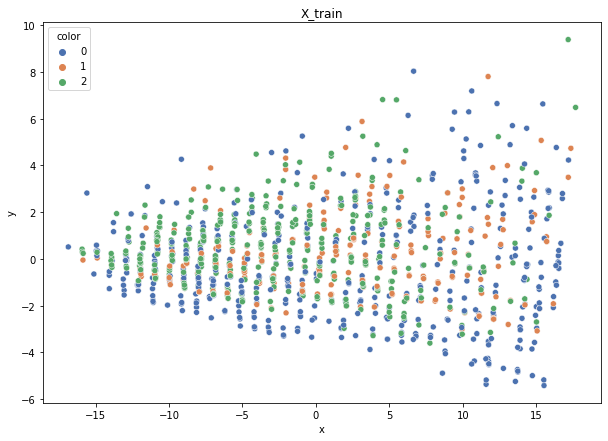

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


100%|██████████| 295/295 [00:00<00:00, 3068.67it/s]


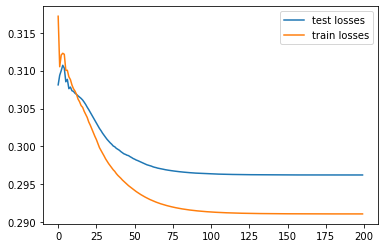

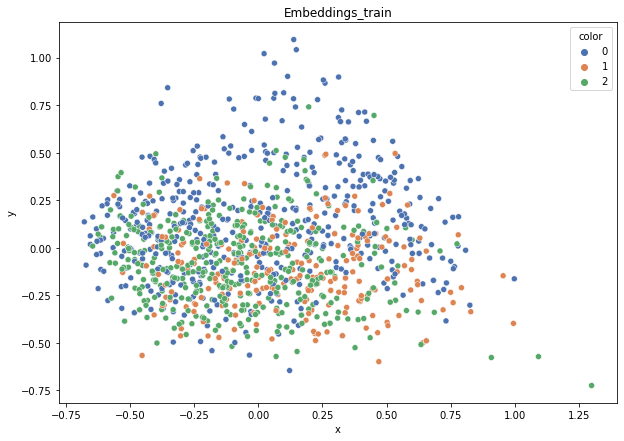

DT-f1-new-features: 0.429
DT-f1-old+new-features: 0.456
DT-f1-old-features: 0.469
DT-gmean-new-features: 0.433
DT-gmean-old+new-features: 0.458
DT-gmean-old-features: 0.467
KNN-f1-new-features: 0.439
KNN-f1-old+new-features: 0.447
KNN-f1-old-features: 0.436
KNN-gmean-new-features: 0.434
KNN-gmean-old+new-features: 0.441
KNN-gmean-old-features: 0.428
RF24-f1-new-features: 0.477
RF24-f1-old+new-features: 0.523
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.476
RF24-gmean-old+new-features: 0.521
RF24-gmean-old-features: 0.523


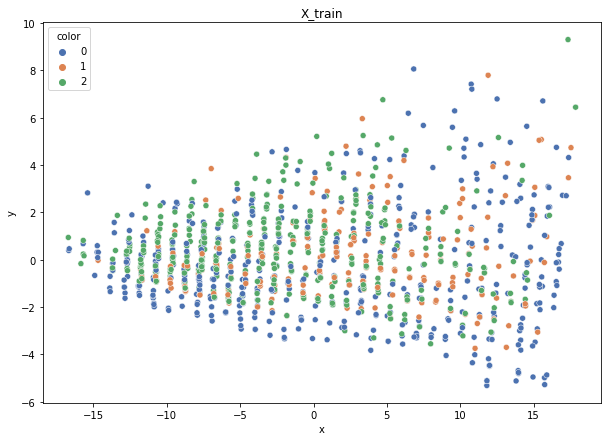

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


100%|██████████| 295/295 [00:00<00:00, 3049.41it/s]


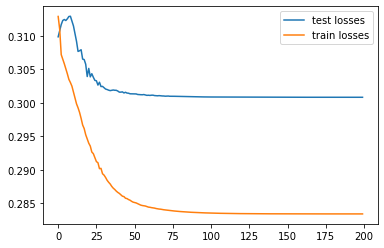

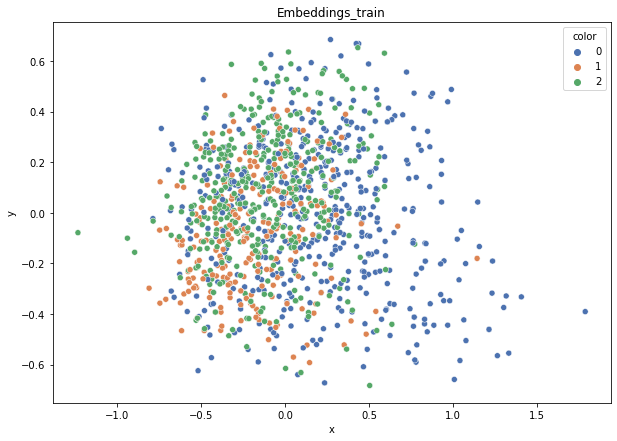

DT-f1-new-features: 0.428
DT-f1-old+new-features: 0.458
DT-f1-old-features: 0.491
DT-gmean-new-features: 0.428
DT-gmean-old+new-features: 0.46
DT-gmean-old-features: 0.503
KNN-f1-new-features: 0.43
KNN-f1-old+new-features: 0.45
KNN-f1-old-features: 0.485
KNN-gmean-new-features: 0.427
KNN-gmean-old+new-features: 0.443
KNN-gmean-old-features: 0.484
RF24-f1-new-features: 0.494
RF24-f1-old+new-features: 0.515
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.494
RF24-gmean-old+new-features: 0.512
RF24-gmean-old-features: 0.519


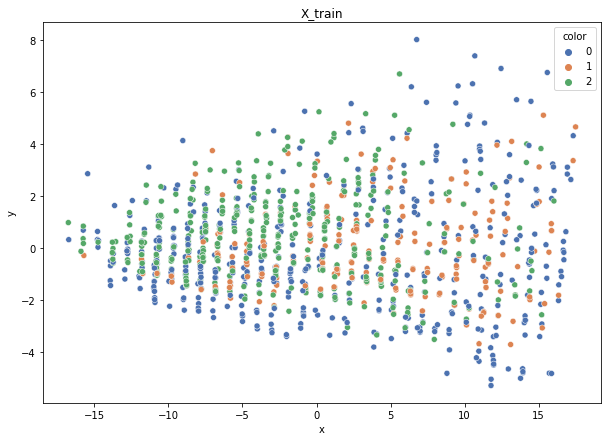

Class cardinalities: Counter({0: 503, 2: 408, 1: 267})
Weights: {0: 0.2429107547813522, 1: 0.45761838822104933, 2: 0.29947085699759846}


100%|██████████| 295/295 [00:00<00:00, 3331.31it/s]


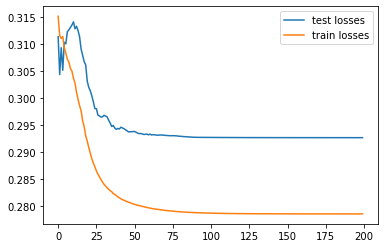

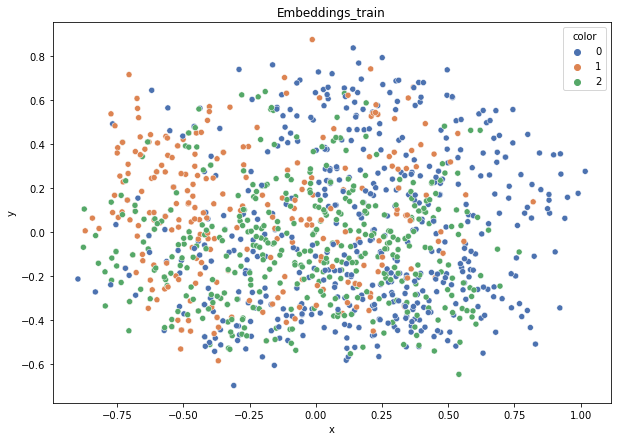

DT-f1-new-features: 0.384
DT-f1-old+new-features: 0.439
DT-f1-old-features: 0.462
DT-gmean-new-features: 0.389
DT-gmean-old+new-features: 0.431
DT-gmean-old-features: 0.46
KNN-f1-new-features: 0.422
KNN-f1-old+new-features: 0.419
KNN-f1-old-features: 0.464
KNN-gmean-new-features: 0.417
KNN-gmean-old+new-features: 0.411
KNN-gmean-old-features: 0.461
RF24-f1-new-features: 0.429
RF24-f1-old+new-features: 0.526
RF24-f1-old-features: 0.52
RF24-gmean-new-features: 0.424
RF24-gmean-old+new-features: 0.514
RF24-gmean-old-features: 0.513


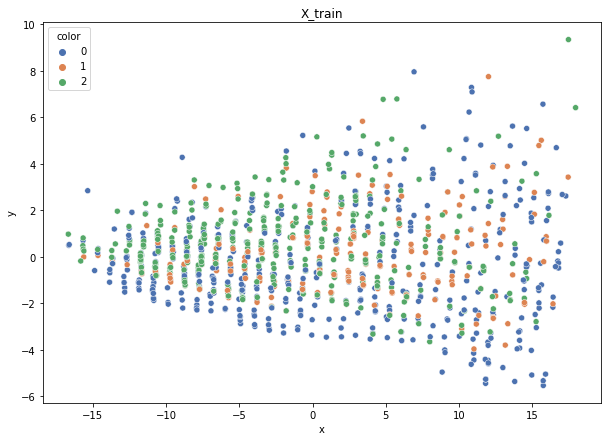

Class cardinalities: Counter({0: 503, 2: 409, 1: 267})
Weights: {0: 0.24308874498865835, 1: 0.4579537031059744, 2: 0.29895755190536716}


100%|██████████| 294/294 [00:00<00:00, 3255.41it/s]


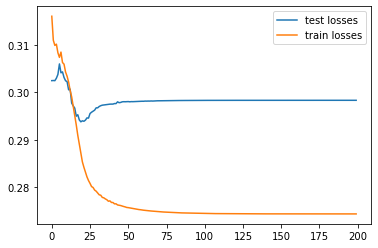

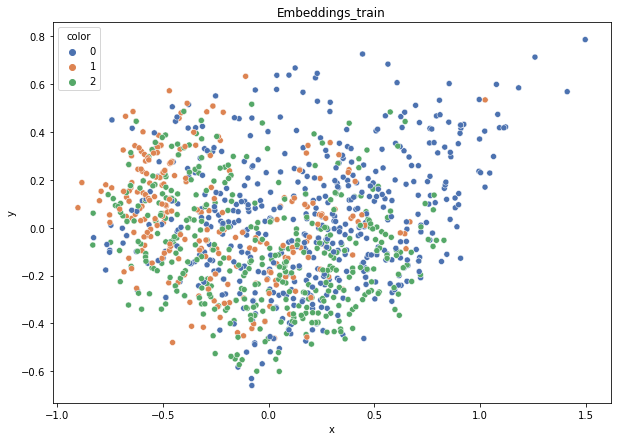

DT-f1-new-features: 0.388
DT-f1-old+new-features: 0.445
DT-f1-old-features: 0.444
DT-gmean-new-features: 0.388
DT-gmean-old+new-features: 0.441
DT-gmean-old-features: 0.442
KNN-f1-new-features: 0.418
KNN-f1-old+new-features: 0.419
KNN-f1-old-features: 0.415
KNN-gmean-new-features: 0.396
KNN-gmean-old+new-features: 0.402
KNN-gmean-old-features: 0.397
RF24-f1-new-features: 0.452
RF24-f1-old+new-features: 0.519
RF24-f1-old-features: 0.506
RF24-gmean-new-features: 0.435
RF24-gmean-old+new-features: 0.504
RF24-gmean-old-features: 0.494


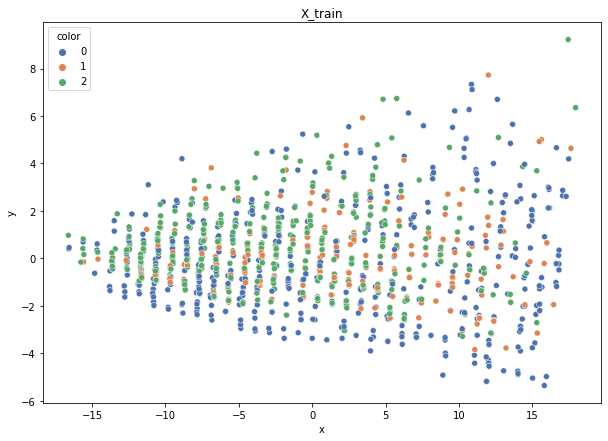

Class cardinalities: Counter({0: 504, 2: 409, 1: 266})
Weights: {0: 0.24230613326681422, 1: 0.4591063577687006, 2: 0.29858750896448505}


100%|██████████| 294/294 [00:00<00:00, 2291.97it/s]


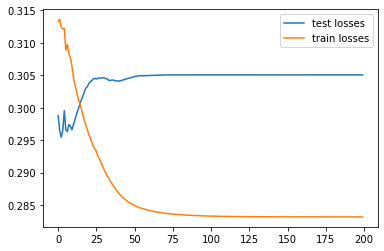

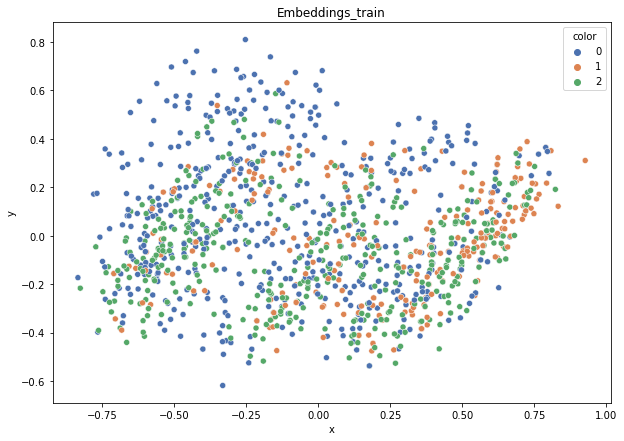

DT-f1-new-features: 0.414
DT-f1-old+new-features: 0.425
DT-f1-old-features: 0.473
DT-gmean-new-features: 0.415
DT-gmean-old+new-features: 0.417
DT-gmean-old-features: 0.483
KNN-f1-new-features: 0.391
KNN-f1-old+new-features: 0.443
KNN-f1-old-features: 0.453
KNN-gmean-new-features: 0.377
KNN-gmean-old+new-features: 0.429
KNN-gmean-old-features: 0.444
RF24-f1-new-features: 0.495
RF24-f1-old+new-features: 0.531
RF24-f1-old-features: 0.522
RF24-gmean-new-features: 0.479
RF24-gmean-old+new-features: 0.528
RF24-gmean-old-features: 0.525
dermatology


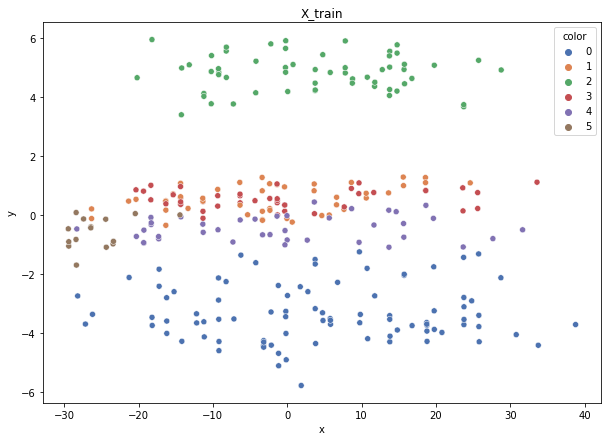

Class cardinalities: Counter({0: 90, 2: 58, 1: 48, 4: 41, 3: 39, 5: 16})
Weights: {1: 0.1288257963857323, 0: 0.0687070914057239, 2: 0.10661445218129569, 4: 0.15082044454915, 3: 0.1585548263209013, 5: 0.38647738915719687}


100%|██████████| 74/74 [00:00<00:00, 2942.67it/s]


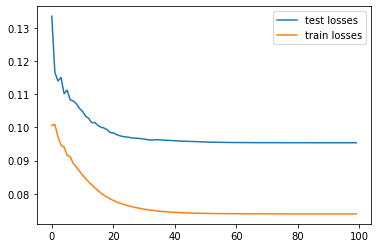

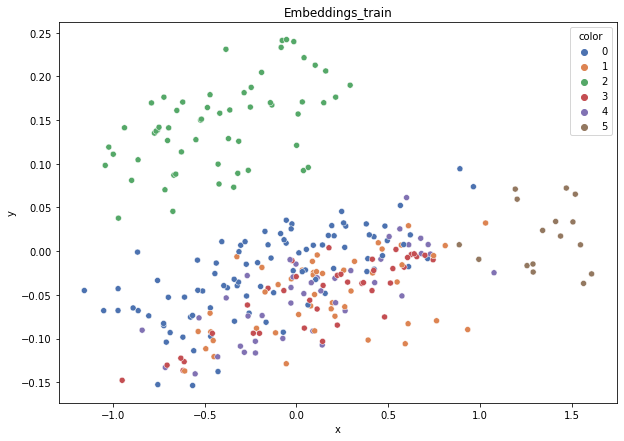

DT-f1-new-features: 0.533
DT-f1-old+new-features: 0.947
DT-f1-old-features: 0.914
DT-gmean-new-features: 0.215
DT-gmean-old+new-features: 0.953
DT-gmean-old-features: 0.911
KNN-f1-new-features: 0.579
KNN-f1-old+new-features: 0.858
KNN-f1-old-features: 0.871
KNN-gmean-new-features: 0.457
KNN-gmean-old+new-features: 0.84
KNN-gmean-old-features: 0.857
RF24-f1-new-features: 0.583
RF24-f1-old+new-features: 0.959
RF24-f1-old-features: 0.959
RF24-gmean-new-features: 0.479
RF24-gmean-old+new-features: 0.957
RF24-gmean-old-features: 0.957


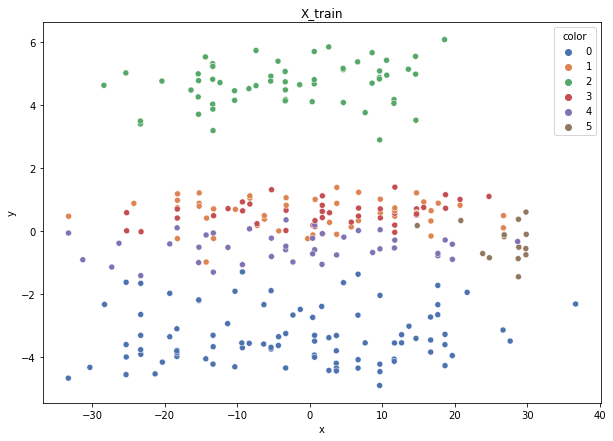

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 41, 3: 40, 5: 16})
Weights: {1: 0.1269355878601628, 2: 0.10723868629565478, 0: 0.06988588545110087, 4: 0.1517035074426336, 3: 0.15549609512869944, 5: 0.3887402378217486}


100%|██████████| 73/73 [00:00<00:00, 2731.08it/s]


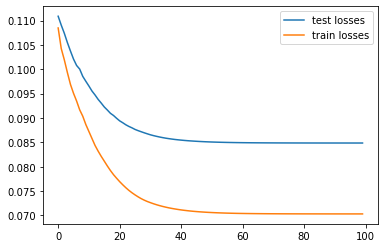

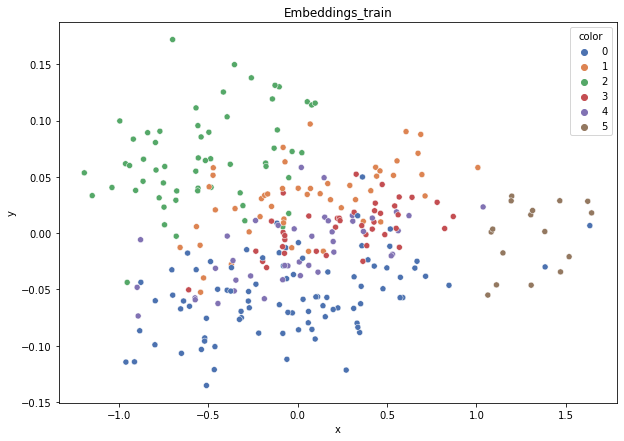

DT-f1-new-features: 0.61
DT-f1-old+new-features: 0.955
DT-f1-old-features: 0.955
DT-gmean-new-features: 0.559
DT-gmean-old+new-features: 0.955
DT-gmean-old-features: 0.955
KNN-f1-new-features: 0.565
KNN-f1-old+new-features: 0.86
KNN-f1-old-features: 0.86
KNN-gmean-new-features: 0.488
KNN-gmean-old+new-features: 0.841
KNN-gmean-old-features: 0.841
RF24-f1-new-features: 0.626
RF24-f1-old+new-features: 0.984
RF24-f1-old-features: 0.984
RF24-gmean-new-features: 0.552
RF24-gmean-old+new-features: 0.986
RF24-gmean-old-features: 0.986


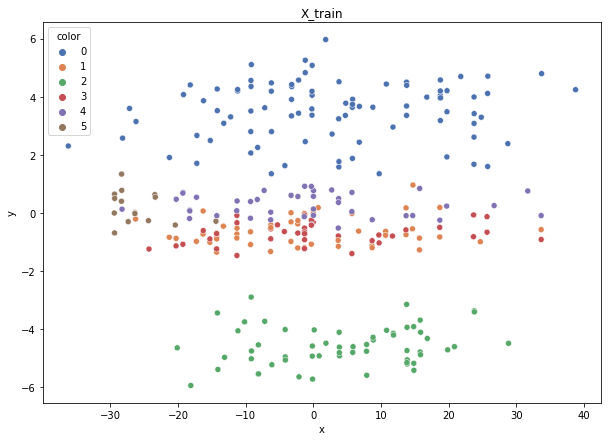

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {0: 0.06985968170695418, 2: 0.10719847710205038, 4: 0.14803599218854577, 3: 0.15942337620304928, 1: 0.1268879933044678, 5: 0.38859447949493264}


100%|██████████| 73/73 [00:00<00:00, 2928.84it/s]


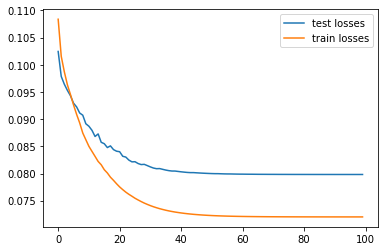

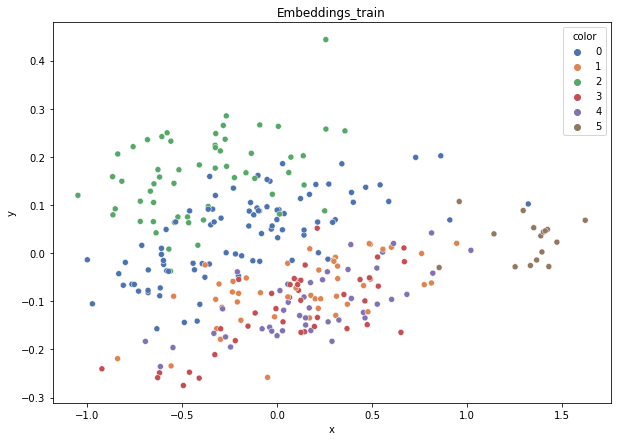

DT-f1-new-features: 0.537
DT-f1-old+new-features: 0.933
DT-f1-old-features: 0.945
DT-gmean-new-features: 0.482
DT-gmean-old+new-features: 0.937
DT-gmean-old-features: 0.953
KNN-f1-new-features: 0.592
KNN-f1-old+new-features: 0.902
KNN-f1-old-features: 0.898
KNN-gmean-new-features: 0.554
KNN-gmean-old+new-features: 0.891
KNN-gmean-old-features: 0.878
RF24-f1-new-features: 0.513
RF24-f1-old+new-features: 0.935
RF24-f1-old-features: 0.909
RF24-gmean-new-features: 0.397
RF24-gmean-old+new-features: 0.918
RF24-gmean-old-features: 0.905


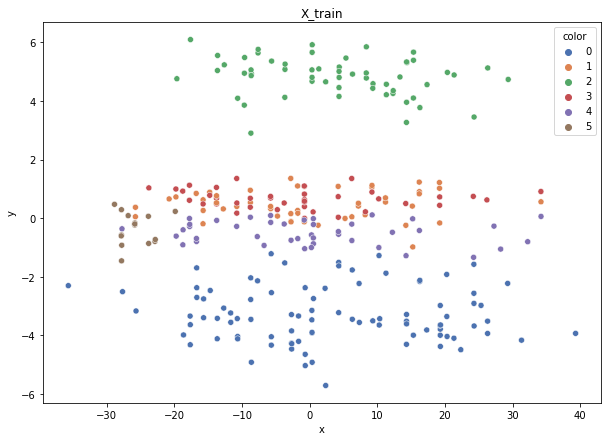

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 4: 0.14787267327537115, 3: 0.15924749429655355, 5: 0.3881657673478493}


100%|██████████| 73/73 [00:00<00:00, 2998.28it/s]


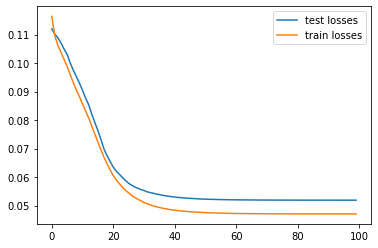

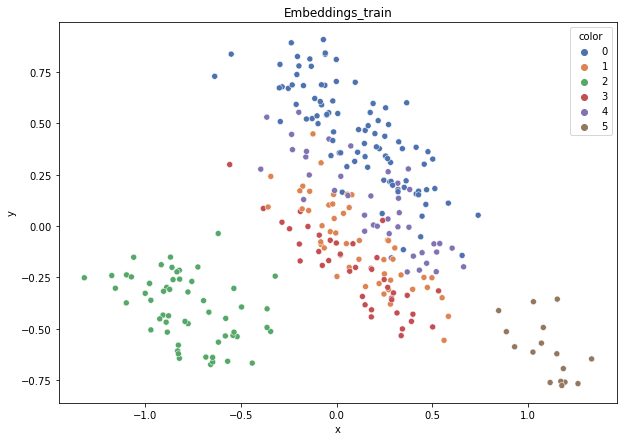

DT-f1-new-features: 0.686
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.946
DT-gmean-new-features: 0.68
DT-gmean-old+new-features: 0.937
DT-gmean-old-features: 0.945
KNN-f1-new-features: 0.757
KNN-f1-old+new-features: 0.872
KNN-f1-old-features: 0.871
KNN-gmean-new-features: 0.73
KNN-gmean-old+new-features: 0.865
KNN-gmean-old-features: 0.865
RF24-f1-new-features: 0.753
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.738
RF24-gmean-old+new-features: 0.963
RF24-gmean-old-features: 0.963


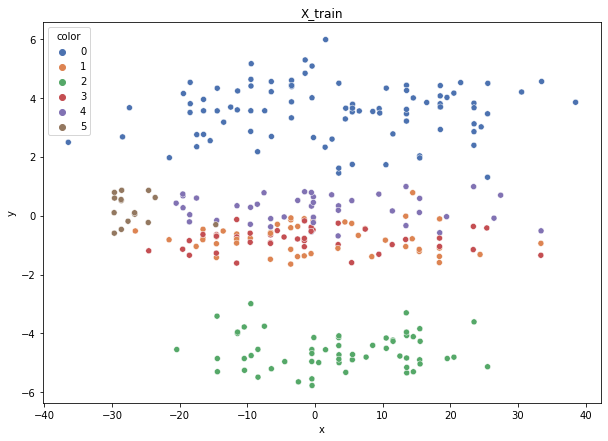

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 3: 0.15924749429655355, 4: 0.14787267327537115, 5: 0.3881657673478493}


100%|██████████| 73/73 [00:00<00:00, 2782.28it/s]


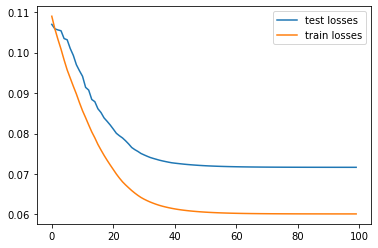

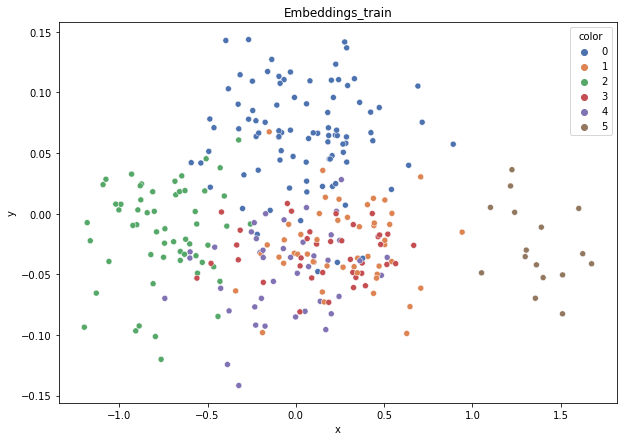

DT-f1-new-features: 0.431
DT-f1-old+new-features: 0.843
DT-f1-old-features: 0.989
DT-gmean-new-features: 0.381
DT-gmean-old+new-features: 0.764
DT-gmean-old-features: 0.992
KNN-f1-new-features: 0.423
KNN-f1-old+new-features: 0.873
KNN-f1-old-features: 0.873
KNN-gmean-new-features: 0.333
KNN-gmean-old+new-features: 0.881
KNN-gmean-old-features: 0.881
RF24-f1-new-features: 0.542
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 1.0
RF24-gmean-new-features: 0.475
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 1.0
hayes-roth


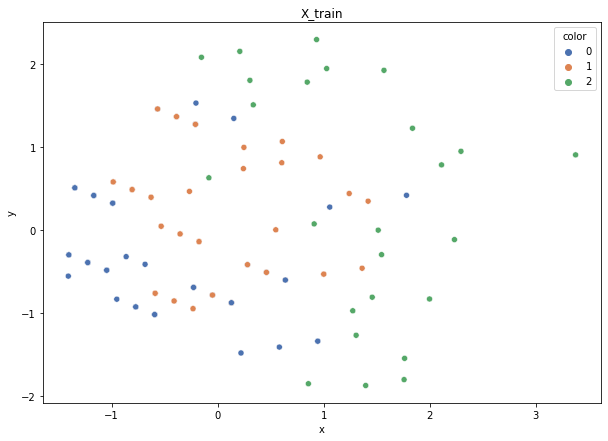

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 2765.55it/s]


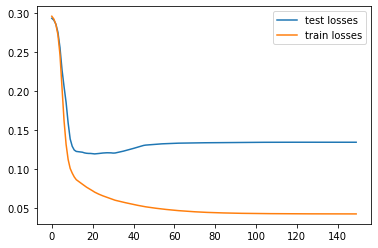

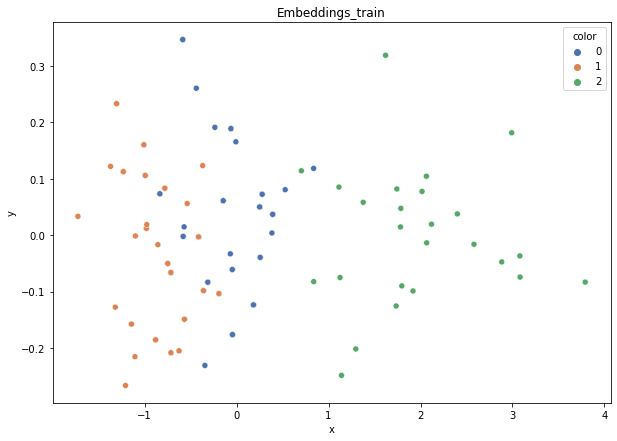

DT-f1-new-features: 0.855
DT-f1-old+new-features: 0.825
DT-f1-old-features: 0.842
DT-gmean-new-features: 0.84
DT-gmean-old+new-features: 0.8
DT-gmean-old-features: 0.828
KNN-f1-new-features: 0.857
KNN-f1-old+new-features: 0.897
KNN-f1-old-features: 0.668
KNN-gmean-new-features: 0.842
KNN-gmean-old+new-features: 0.892
KNN-gmean-old-features: 0.601
RF24-f1-new-features: 0.88
RF24-f1-old+new-features: 0.88
RF24-f1-old-features: 0.838
RF24-gmean-new-features: 0.862
RF24-gmean-old+new-features: 0.862
RF24-gmean-old-features: 0.814


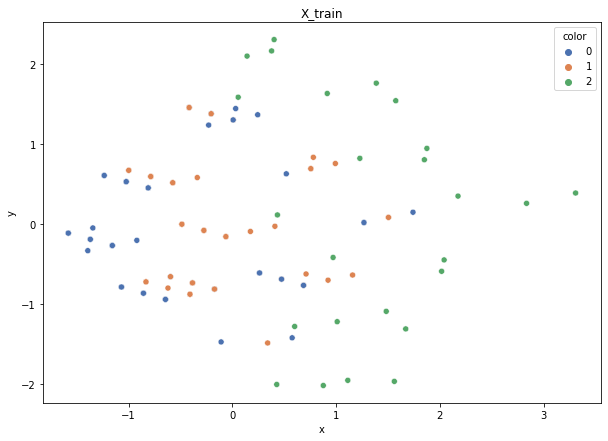

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 2064.16it/s]


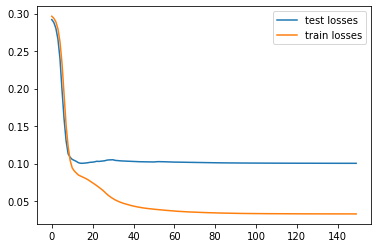

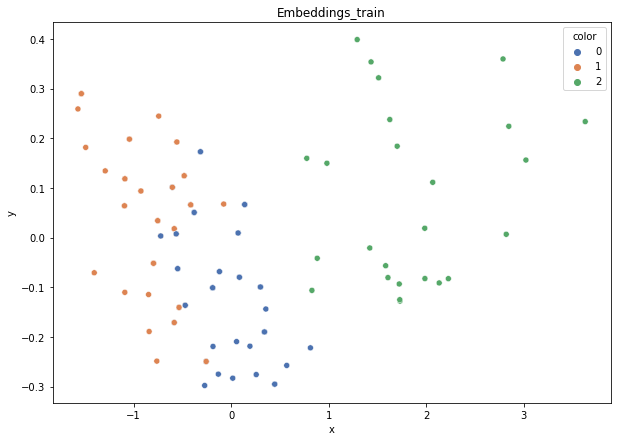

DT-f1-new-features: 0.897
DT-f1-old+new-features: 0.897
DT-f1-old-features: 0.872
DT-gmean-new-features: 0.895
DT-gmean-old+new-features: 0.895
DT-gmean-old-features: 0.867
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.805
KNN-f1-old-features: 0.669
KNN-gmean-new-features: 0.921
KNN-gmean-old+new-features: 0.787
KNN-gmean-old-features: 0.643
RF24-f1-new-features: 0.897
RF24-f1-old+new-features: 0.897
RF24-f1-old-features: 0.846
RF24-gmean-new-features: 0.895
RF24-gmean-old+new-features: 0.895
RF24-gmean-old-features: 0.84


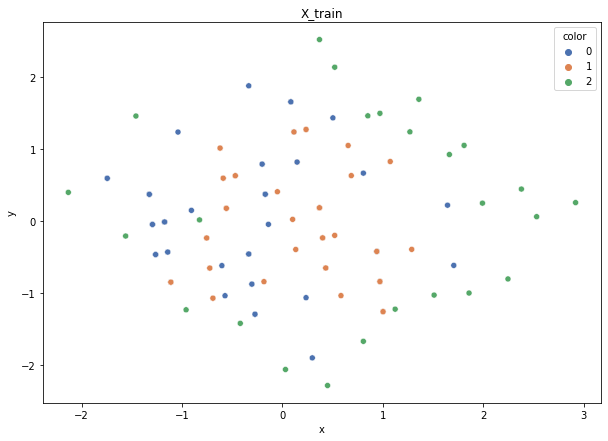

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 2547.74it/s]


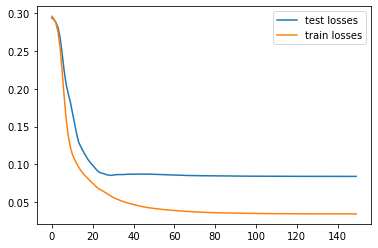

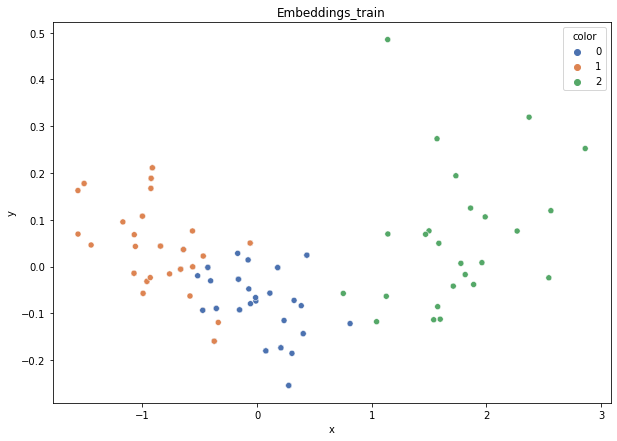

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.923
DT-gmean-new-features: 0.921
DT-gmean-old+new-features: 0.921
DT-gmean-old-features: 0.921
KNN-f1-new-features: 0.948
KNN-f1-old+new-features: 0.882
KNN-f1-old-features: 0.858
KNN-gmean-new-features: 0.946
KNN-gmean-old+new-features: 0.862
KNN-gmean-old-features: 0.826
RF24-f1-new-features: 0.948
RF24-f1-old+new-features: 0.923
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.946
RF24-gmean-old+new-features: 0.921
RF24-gmean-old-features: 0.921


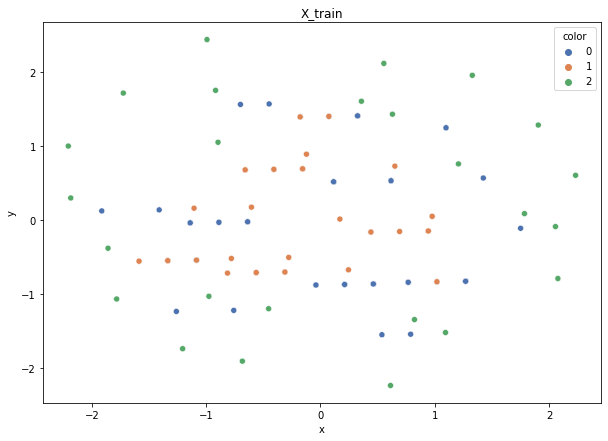

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {1: 0.24870862827625786, 2: 0.507365601683566, 0: 0.243925770040176}


100%|██████████| 32/32 [00:00<00:00, 2298.68it/s]


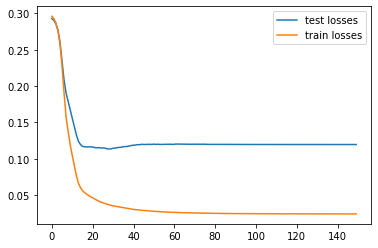

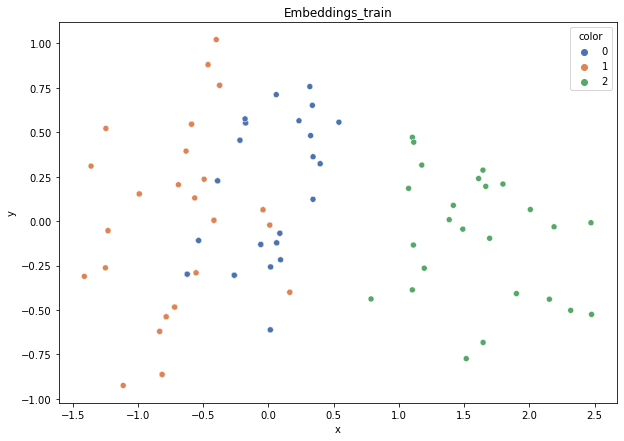

DT-f1-new-features: 0.811
DT-f1-old+new-features: 0.745
DT-f1-old-features: 0.897
DT-gmean-new-features: 0.782
DT-gmean-old+new-features: 0.731
DT-gmean-old-features: 0.892
KNN-f1-new-features: 0.857
KNN-f1-old+new-features: 0.922
KNN-f1-old-features: 0.786
KNN-gmean-new-features: 0.842
KNN-gmean-old+new-features: 0.916
KNN-gmean-old-features: 0.757
RF24-f1-new-features: 0.836
RF24-f1-old+new-features: 0.836
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.805
RF24-gmean-old+new-features: 0.805
RF24-gmean-old-features: 0.921


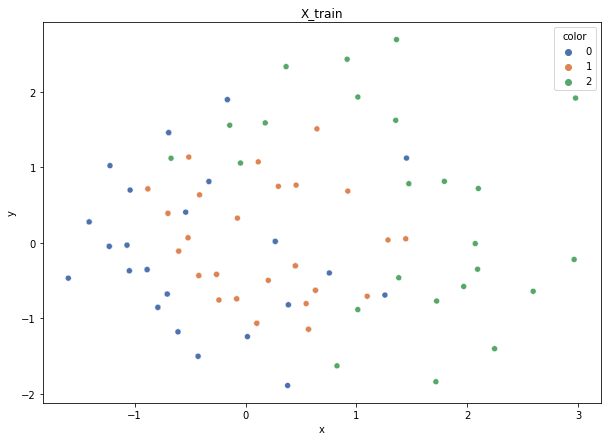

Class cardinalities: Counter({0: 52, 1: 52, 2: 24})
Weights: {0: 0.24000000000000005, 2: 0.52, 1: 0.24000000000000005}


100%|██████████| 32/32 [00:00<00:00, 2444.63it/s]


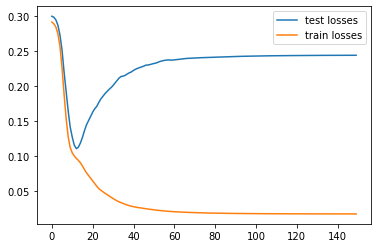

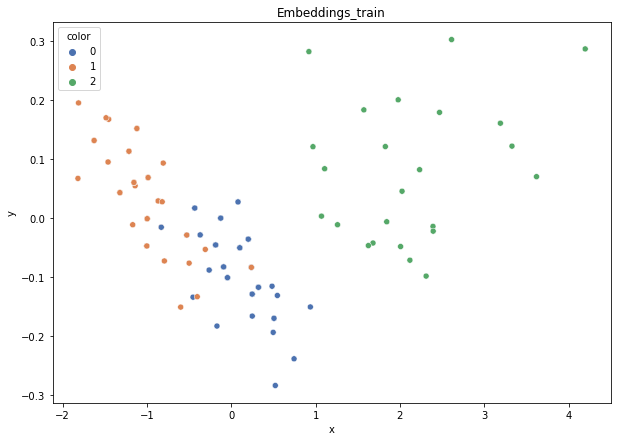

DT-f1-new-features: 0.778
DT-f1-old+new-features: 0.774
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.76
DT-gmean-old+new-features: 0.751
DT-gmean-old-features: 0.684
KNN-f1-new-features: 0.778
KNN-f1-old+new-features: 0.752
KNN-f1-old-features: 0.535
KNN-gmean-new-features: 0.763
KNN-gmean-old+new-features: 0.734
KNN-gmean-old-features: 0.487
RF24-f1-new-features: 0.752
RF24-f1-old+new-features: 0.752
RF24-f1-old-features: 0.733
RF24-gmean-new-features: 0.734
RF24-gmean-old+new-features: 0.734
RF24-gmean-old-features: 0.711
new_vehicle


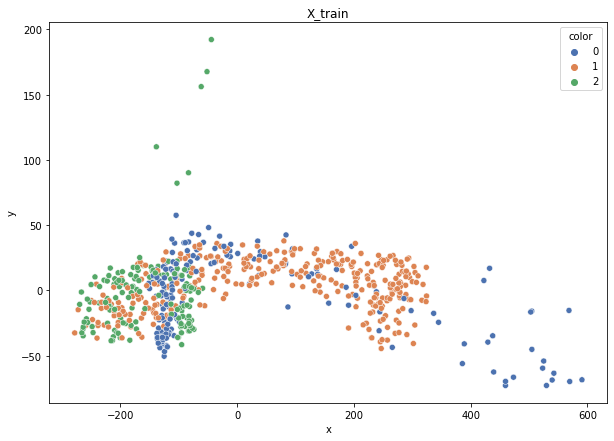

Class cardinalities: Counter({1: 343, 0: 174, 2: 159})
Weights: {2: 0.42063643091235864, 1: 0.19498889946083095, 0: 0.38437466962681044}


100%|██████████| 170/170 [00:00<00:00, 2793.18it/s]


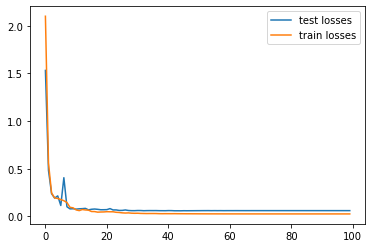

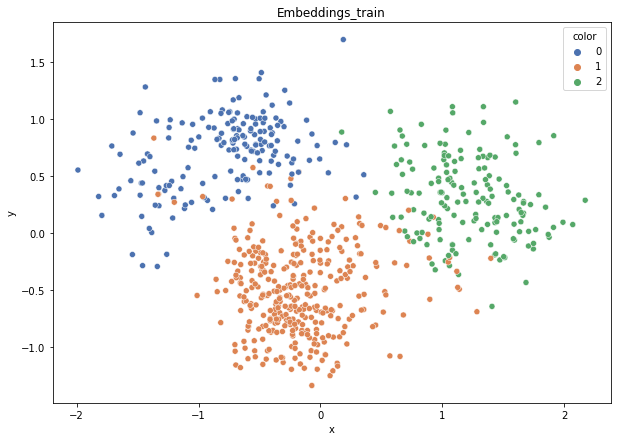

DT-f1-new-features: 0.888
DT-f1-old+new-features: 0.87
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.892
DT-gmean-old+new-features: 0.875
DT-gmean-old-features: 0.908
KNN-f1-new-features: 0.889
KNN-f1-old+new-features: 0.858
KNN-f1-old-features: 0.858
KNN-gmean-new-features: 0.888
KNN-gmean-old+new-features: 0.861
KNN-gmean-old-features: 0.861
RF24-f1-new-features: 0.896
RF24-f1-old+new-features: 0.919
RF24-f1-old-features: 0.922
RF24-gmean-new-features: 0.901
RF24-gmean-old+new-features: 0.925
RF24-gmean-old-features: 0.932


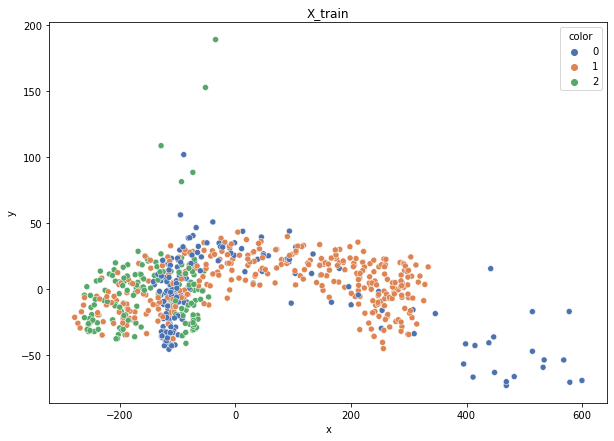

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


100%|██████████| 169/169 [00:00<00:00, 2696.51it/s]


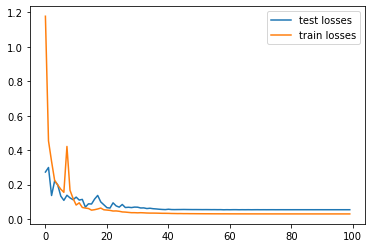

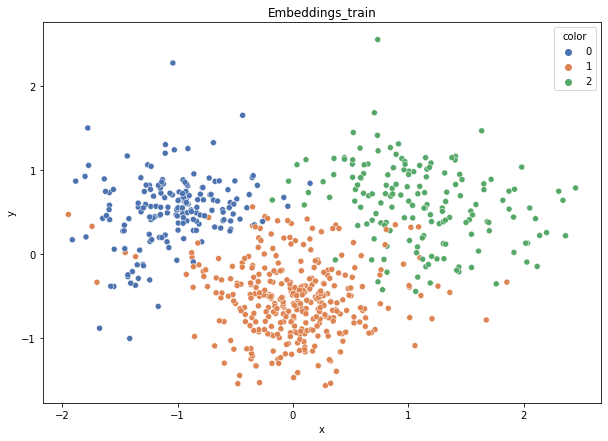

DT-f1-new-features: 0.898
DT-f1-old+new-features: 0.962
DT-f1-old-features: 0.906
DT-gmean-new-features: 0.904
DT-gmean-old+new-features: 0.968
DT-gmean-old-features: 0.904
KNN-f1-new-features: 0.896
KNN-f1-old+new-features: 0.859
KNN-f1-old-features: 0.859
KNN-gmean-new-features: 0.895
KNN-gmean-old+new-features: 0.861
KNN-gmean-old-features: 0.861
RF24-f1-new-features: 0.928
RF24-f1-old+new-features: 0.965
RF24-f1-old-features: 0.964
RF24-gmean-new-features: 0.943
RF24-gmean-old+new-features: 0.976
RF24-gmean-old-features: 0.972


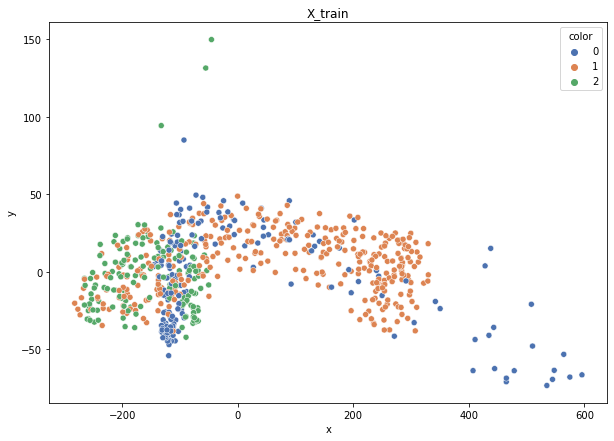

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


100%|██████████| 169/169 [00:00<00:00, 2953.30it/s]


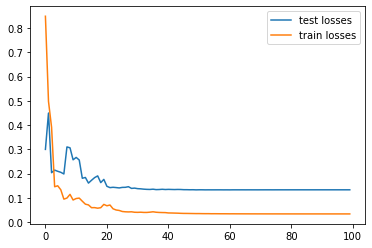

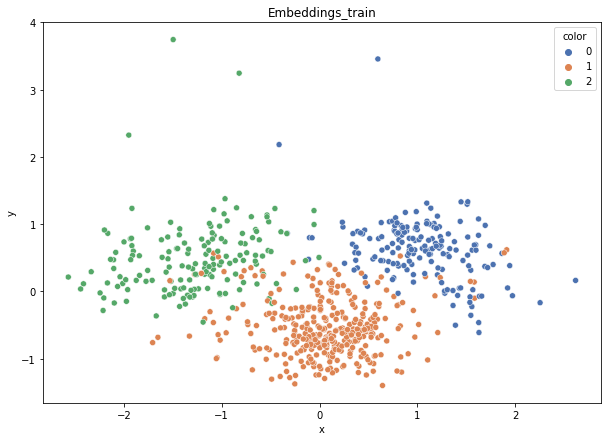

DT-f1-new-features: 0.918
DT-f1-old+new-features: 0.939
DT-f1-old-features: 0.89
DT-gmean-new-features: 0.933
DT-gmean-old+new-features: 0.956
DT-gmean-old-features: 0.895
KNN-f1-new-features: 0.908
KNN-f1-old+new-features: 0.864
KNN-f1-old-features: 0.864
KNN-gmean-new-features: 0.911
KNN-gmean-old+new-features: 0.874
KNN-gmean-old-features: 0.874
RF24-f1-new-features: 0.933
RF24-f1-old+new-features: 0.97
RF24-f1-old-features: 0.952
RF24-gmean-new-features: 0.947
RF24-gmean-old+new-features: 0.98
RF24-gmean-old-features: 0.955


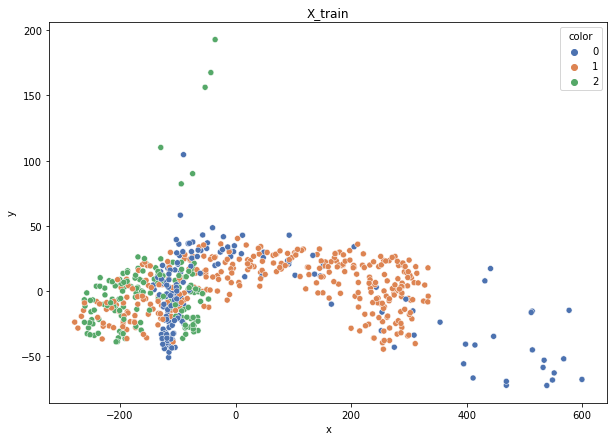

Class cardinalities: Counter({1: 344, 0: 174, 2: 159})
Weights: {2: 0.42087499472640594, 0: 0.3845926675948192, 1: 0.19453233767877484}


100%|██████████| 169/169 [00:00<00:00, 2661.64it/s]


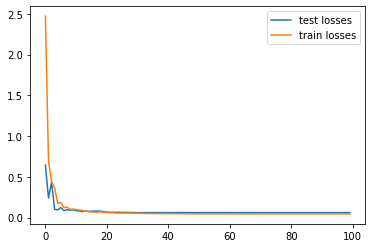

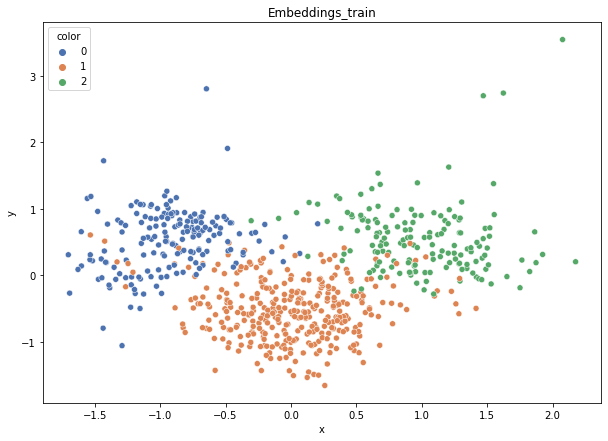

DT-f1-new-features: 0.925
DT-f1-old+new-features: 0.949
DT-f1-old-features: 0.915
DT-gmean-new-features: 0.929
DT-gmean-old+new-features: 0.952
DT-gmean-old-features: 0.92
KNN-f1-new-features: 0.944
KNN-f1-old+new-features: 0.879
KNN-f1-old-features: 0.879
KNN-gmean-new-features: 0.939
KNN-gmean-old+new-features: 0.877
KNN-gmean-old-features: 0.877
RF24-f1-new-features: 0.958
RF24-f1-old+new-features: 0.976
RF24-f1-old-features: 0.976
RF24-gmean-new-features: 0.961
RF24-gmean-old+new-features: 0.981
RF24-gmean-old-features: 0.977


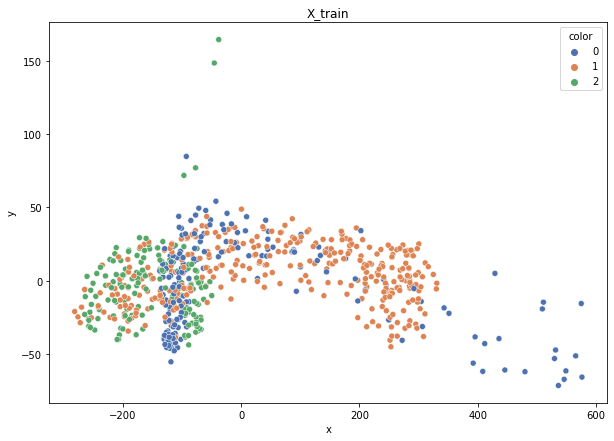

Class cardinalities: Counter({1: 343, 0: 174, 2: 160})
Weights: {2: 0.4191092821730032, 1: 0.19550287215067205, 0: 0.3853878456763248}


100%|██████████| 169/169 [00:00<00:00, 2713.73it/s]


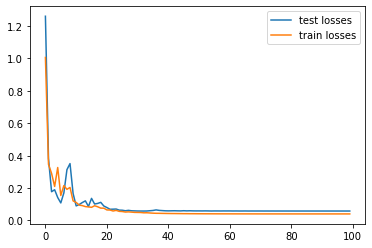

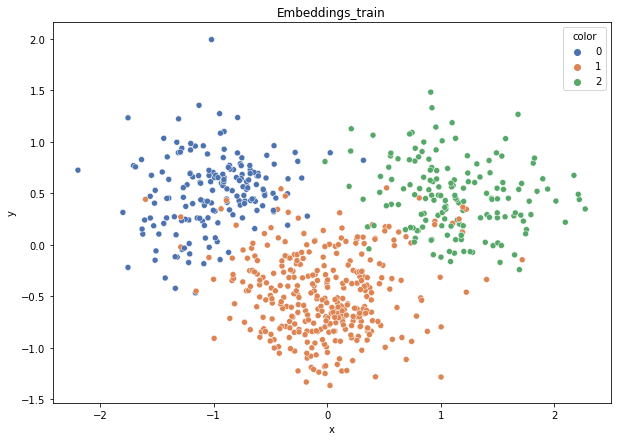

DT-f1-new-features: 0.888
DT-f1-old+new-features: 0.885
DT-f1-old-features: 0.877
DT-gmean-new-features: 0.897
DT-gmean-old+new-features: 0.89
DT-gmean-old-features: 0.87
KNN-f1-new-features: 0.904
KNN-f1-old+new-features: 0.91
KNN-f1-old-features: 0.91
KNN-gmean-new-features: 0.907
KNN-gmean-old+new-features: 0.913
KNN-gmean-old-features: 0.913
RF24-f1-new-features: 0.913
RF24-f1-old+new-features: 0.97
RF24-f1-old-features: 0.98
RF24-gmean-new-features: 0.918
RF24-gmean-old+new-features: 0.973
RF24-gmean-old-features: 0.981
new_yeast


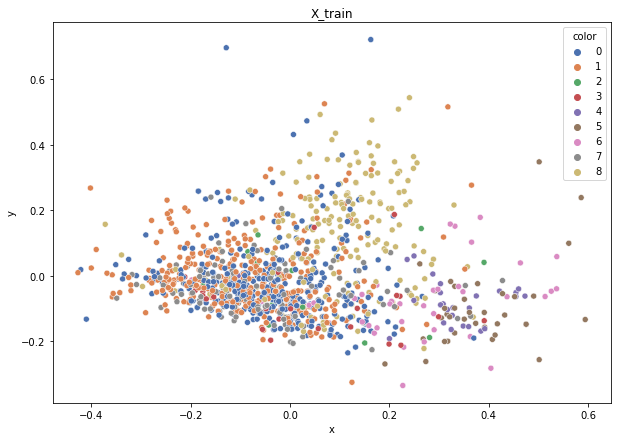

Class cardinalities: Counter({0: 370, 1: 343, 8: 195, 7: 135, 6: 40, 5: 36, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024325906642526016, 0: 0.012820410257547495, 1: 0.013829597070823827, 5: 0.1317653276470159, 4: 0.16941256411759187, 6: 0.11858879488231433, 3: 0.19764799147052386, 7: 0.03513742070587091, 2: 0.2964719872057858}


100%|██████████| 297/297 [00:00<00:00, 2588.77it/s]


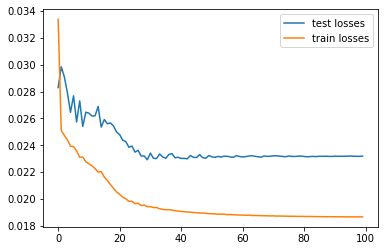

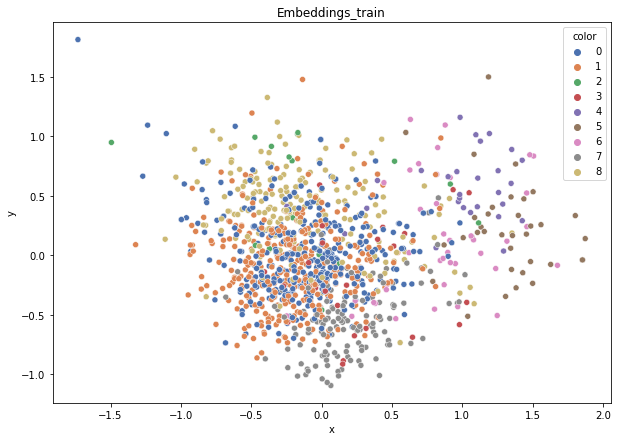

DT-f1-new-features: 0.341
DT-f1-old+new-features: 0.488
DT-f1-old-features: 0.495
DT-gmean-new-features: 0.197
DT-gmean-old+new-features: 0.471
DT-gmean-old-features: 0.272
KNN-f1-new-features: 0.328
KNN-f1-old+new-features: 0.517
KNN-f1-old-features: 0.511
KNN-gmean-new-features: 0.18
KNN-gmean-old+new-features: 0.286
KNN-gmean-old-features: 0.284
RF24-f1-new-features: 0.414
RF24-f1-old+new-features: 0.546
RF24-f1-old-features: 0.566
RF24-gmean-new-features: 0.214
RF24-gmean-old+new-features: 0.303
RF24-gmean-old-features: 0.313


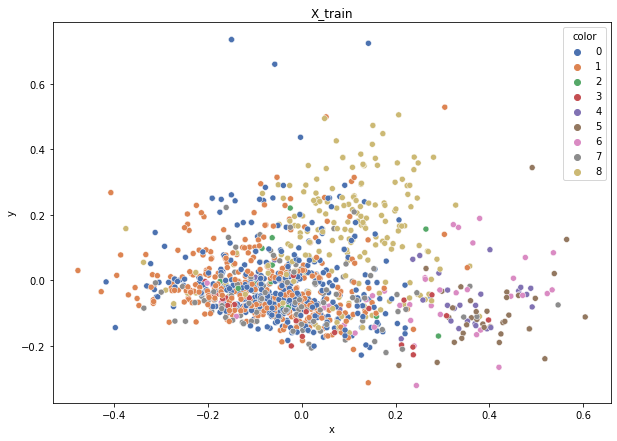

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {1: 0.013814401543936261, 8: 0.02429917810035968, 0: 0.012771805200997676, 5: 0.13538113513057534, 6: 0.11556926169683263, 7: 0.035360744250523414, 3: 0.1974308220654224, 4: 0.16922641891321918, 2: 0.2961462330981336}


100%|██████████| 297/297 [00:00<00:00, 2935.89it/s]


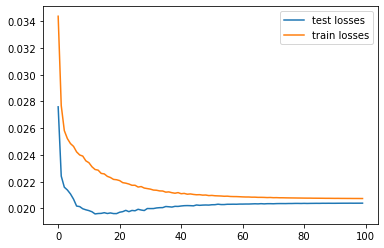

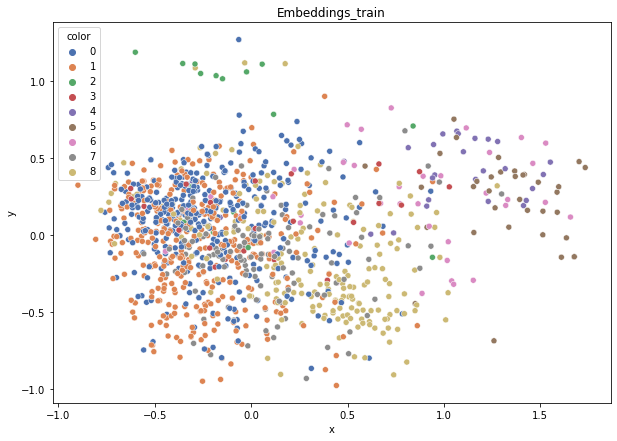

DT-f1-new-features: 0.323
DT-f1-old+new-features: 0.466
DT-f1-old-features: 0.453
DT-gmean-new-features: 0.186
DT-gmean-old+new-features: 0.263
DT-gmean-old-features: 0.26
KNN-f1-new-features: 0.366
KNN-f1-old+new-features: 0.481
KNN-f1-old-features: 0.546
KNN-gmean-new-features: 0.186
KNN-gmean-old+new-features: 0.267
KNN-gmean-old-features: 0.29
RF24-f1-new-features: 0.408
RF24-f1-old+new-features: 0.602
RF24-f1-old-features: 0.611
RF24-gmean-new-features: 0.223
RF24-gmean-old+new-features: 0.327
RF24-gmean-old-features: 0.331


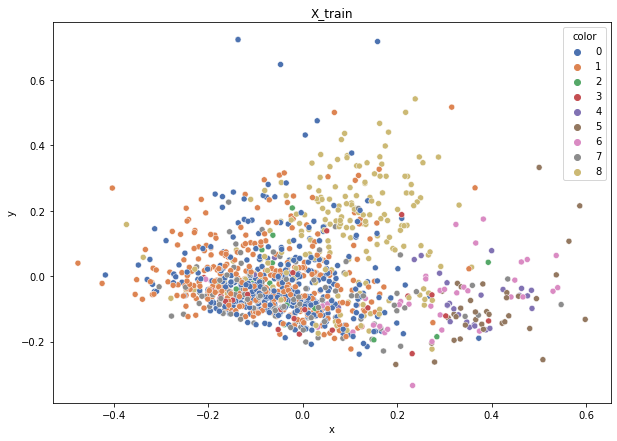

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299178100359677, 1: 0.01381440154393626, 0: 0.012771805200997674, 5: 0.13538113513057534, 4: 0.16922641891321916, 6: 0.11556926169683261, 7: 0.03536074425052341, 3: 0.19743082206542237, 2: 0.29614623309813354}


100%|██████████| 297/297 [00:00<00:00, 2924.08it/s]


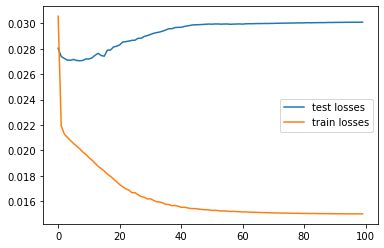

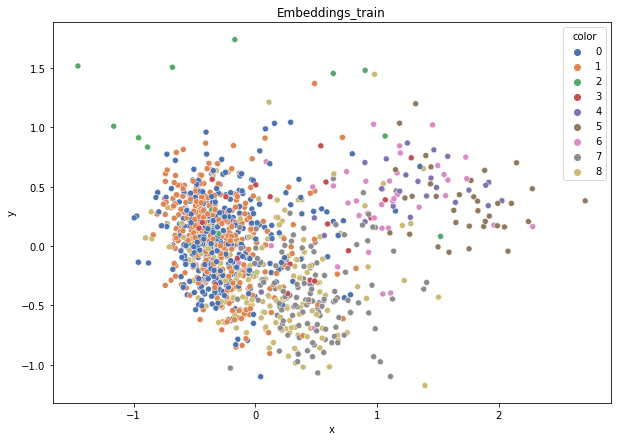

DT-f1-new-features: 0.381
DT-f1-old+new-features: 0.436
DT-f1-old-features: 0.408
DT-gmean-new-features: 0.375
DT-gmean-old+new-features: 0.246
DT-gmean-old-features: 0.408
KNN-f1-new-features: 0.366
KNN-f1-old+new-features: 0.418
KNN-f1-old-features: 0.447
KNN-gmean-new-features: 0.199
KNN-gmean-old+new-features: 0.229
KNN-gmean-old-features: 0.25
RF24-f1-new-features: 0.414
RF24-f1-old+new-features: 0.555
RF24-f1-old-features: 0.544
RF24-gmean-new-features: 0.347
RF24-gmean-old+new-features: 0.501
RF24-gmean-old-features: 0.477


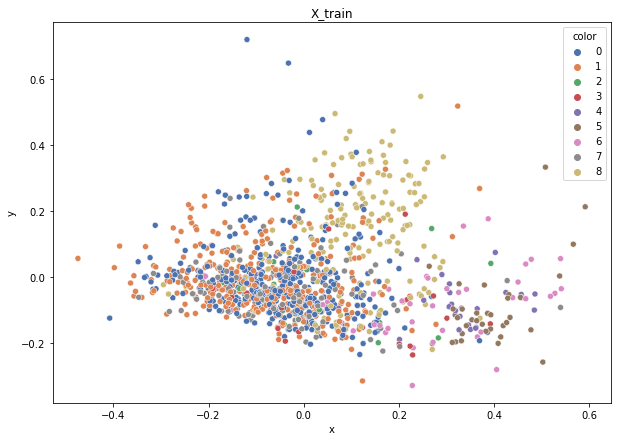

Class cardinalities: Counter({0: 370, 1: 344, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299315142460837, 1: 0.013774321083662392, 0: 0.012806395818323955, 5: 0.13538189865085323, 4: 0.16922737331356652, 6: 0.11556991348243568, 7: 0.03536094367746166, 3: 0.1974319355324943, 2: 0.29614790329874147}


100%|██████████| 297/297 [00:00<00:00, 3010.67it/s]


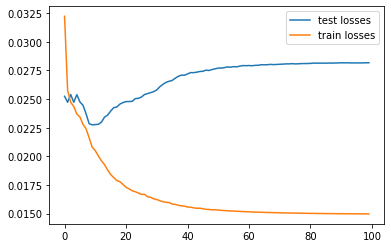

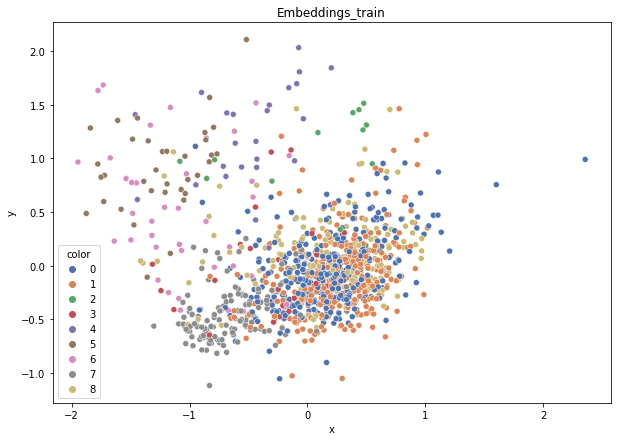

DT-f1-new-features: 0.273
DT-f1-old+new-features: 0.383
DT-f1-old-features: 0.439
DT-gmean-new-features: 0.157
DT-gmean-old+new-features: 0.388
DT-gmean-old-features: 0.248
KNN-f1-new-features: 0.321
KNN-f1-old+new-features: 0.43
KNN-f1-old-features: 0.464
KNN-gmean-new-features: 0.166
KNN-gmean-old+new-features: 0.227
KNN-gmean-old-features: 0.41
RF24-f1-new-features: 0.364
RF24-f1-old+new-features: 0.522
RF24-f1-old-features: 0.531
RF24-gmean-new-features: 0.202
RF24-gmean-old+new-features: 0.275
RF24-gmean-old-features: 0.277


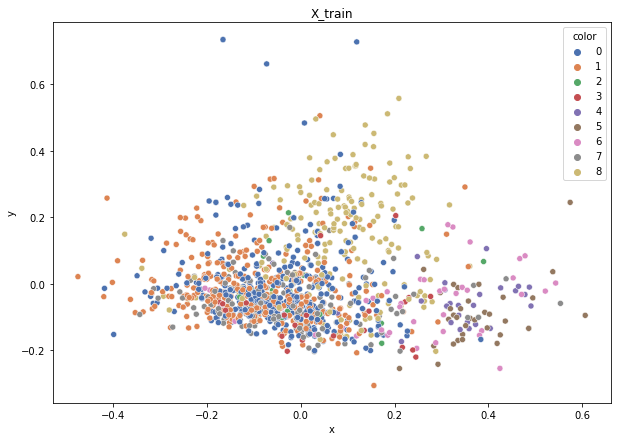

Class cardinalities: Counter({0: 370, 1: 343, 8: 196, 7: 135, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.02418370057482606, 1: 0.013819257471329179, 0: 0.012810825169367322, 5: 0.13542872321902596, 4: 0.16928590402378244, 6: 0.11560988567477826, 7: 0.035111150464191915, 3: 0.1975002213610795, 2: 0.29625033204161927}


100%|██████████| 296/296 [00:00<00:00, 3132.23it/s]


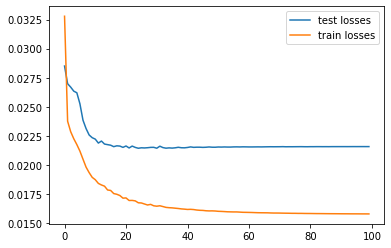

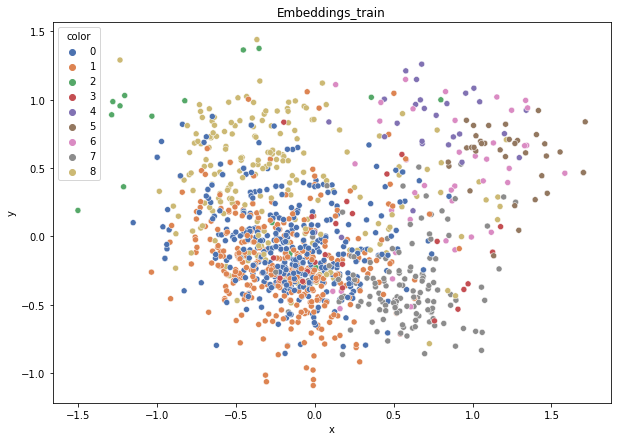

DT-f1-new-features: 0.38
DT-f1-old+new-features: 0.439
DT-f1-old-features: 0.425
DT-gmean-new-features: 0.216
DT-gmean-old+new-features: 0.418
DT-gmean-old-features: 0.237
KNN-f1-new-features: 0.366
KNN-f1-old+new-features: 0.411
KNN-f1-old-features: 0.49
KNN-gmean-new-features: 0.324
KNN-gmean-old+new-features: 0.38
KNN-gmean-old-features: 0.432
RF24-f1-new-features: 0.424
RF24-f1-old+new-features: 0.528
RF24-f1-old-features: 0.561
RF24-gmean-new-features: 0.228
RF24-gmean-old+new-features: 0.277
RF24-gmean-old-features: 0.293
1czysty-cut


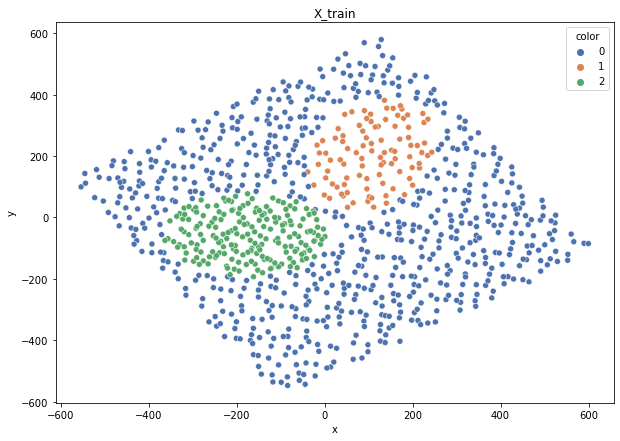

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2790.09it/s]


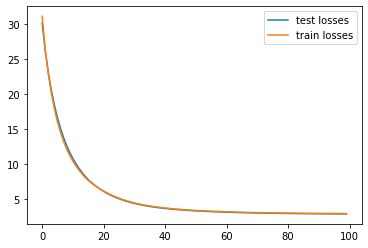

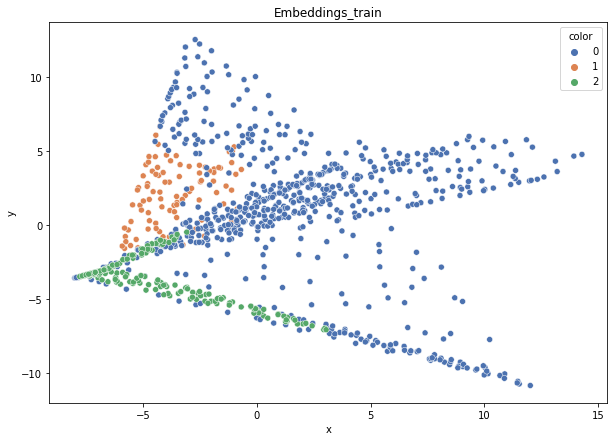

DT-f1-new-features: 0.885
DT-f1-old+new-features: 0.897
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.889
DT-gmean-old+new-features: 0.895
DT-gmean-old-features: 0.889
KNN-f1-new-features: 0.887
KNN-f1-old+new-features: 0.937
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.923
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.941
RF24-f1-new-features: 0.924
RF24-f1-old+new-features: 0.936
RF24-f1-old-features: 0.934
RF24-gmean-new-features: 0.935
RF24-gmean-old+new-features: 0.946
RF24-gmean-old-features: 0.939


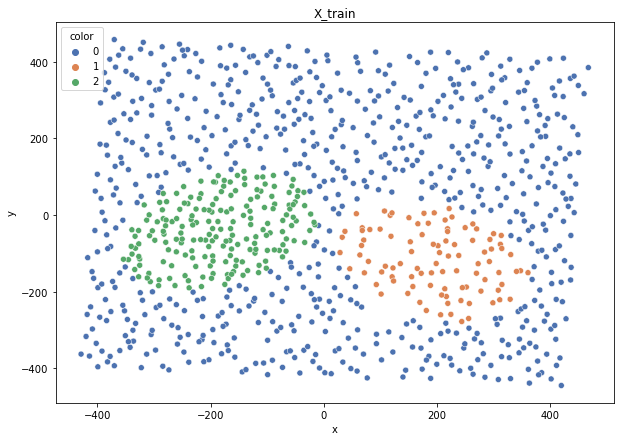

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3040.71it/s]


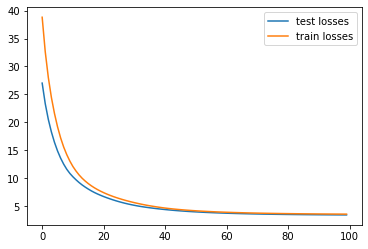

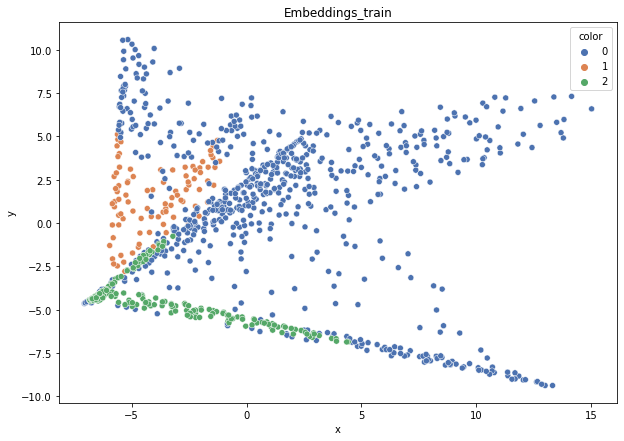

DT-f1-new-features: 0.889
DT-f1-old+new-features: 0.916
DT-f1-old-features: 0.929
DT-gmean-new-features: 0.88
DT-gmean-old+new-features: 0.884
DT-gmean-old-features: 0.928
KNN-f1-new-features: 0.905
KNN-f1-old+new-features: 0.945
KNN-f1-old-features: 0.945
KNN-gmean-new-features: 0.887
KNN-gmean-old+new-features: 0.934
KNN-gmean-old-features: 0.934
RF24-f1-new-features: 0.891
RF24-f1-old+new-features: 0.924
RF24-f1-old-features: 0.901
RF24-gmean-new-features: 0.868
RF24-gmean-old+new-features: 0.912
RF24-gmean-old-features: 0.906


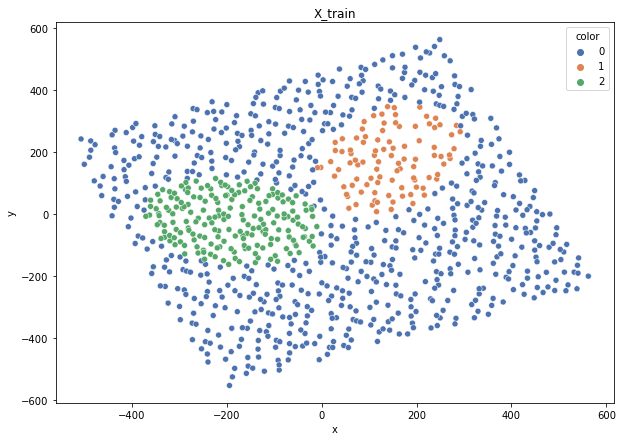

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2805.71it/s]


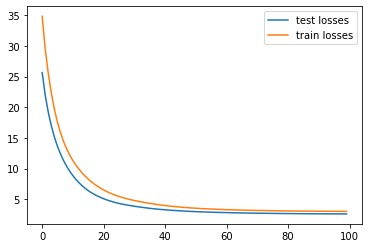

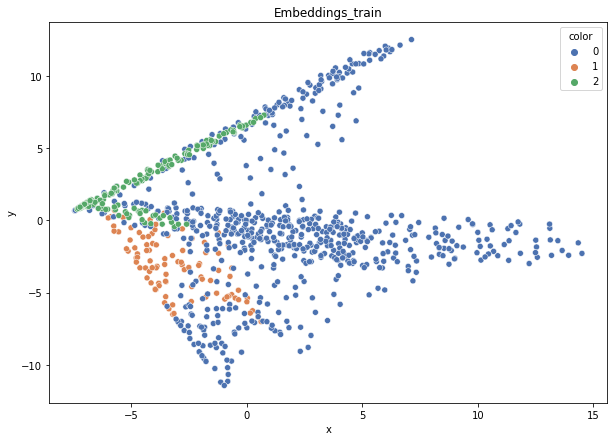

DT-f1-new-features: 0.987
DT-f1-old+new-features: 0.942
DT-f1-old-features: 0.942
DT-gmean-new-features: 0.989
DT-gmean-old+new-features: 0.934
DT-gmean-old-features: 0.934
KNN-f1-new-features: 0.974
KNN-f1-old+new-features: 0.953
KNN-f1-old-features: 0.953
KNN-gmean-new-features: 0.973
KNN-gmean-old+new-features: 0.931
KNN-gmean-old-features: 0.931
RF24-f1-new-features: 0.971
RF24-f1-old+new-features: 0.983
RF24-f1-old-features: 0.951
RF24-gmean-new-features: 0.98
RF24-gmean-old+new-features: 0.994
RF24-gmean-old-features: 0.949


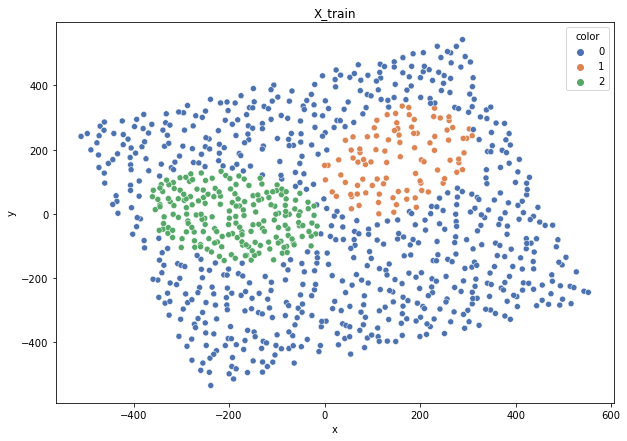

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2887.60it/s]


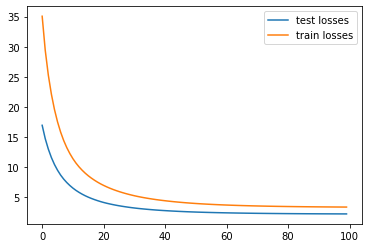

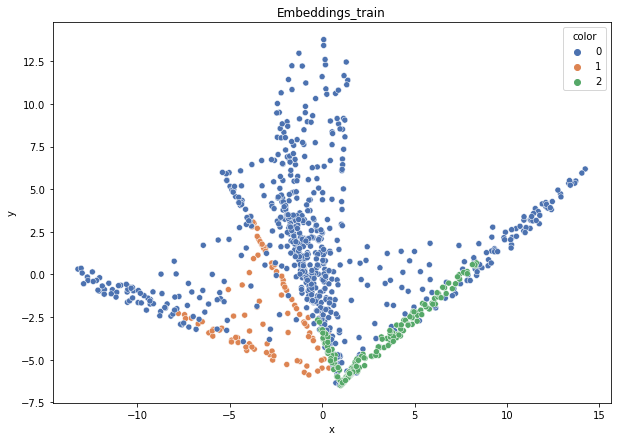

DT-f1-new-features: 0.879
DT-f1-old+new-features: 0.919
DT-f1-old-features: 0.932
DT-gmean-new-features: 0.931
DT-gmean-old+new-features: 0.955
DT-gmean-old-features: 0.959
KNN-f1-new-features: 0.931
KNN-f1-old+new-features: 0.939
KNN-f1-old-features: 0.939
KNN-gmean-new-features: 0.976
KNN-gmean-old+new-features: 0.971
KNN-gmean-old-features: 0.971
RF24-f1-new-features: 0.901
RF24-f1-old+new-features: 0.942
RF24-f1-old-features: 0.937
RF24-gmean-new-features: 0.944
RF24-gmean-old+new-features: 0.975
RF24-gmean-old-features: 0.963


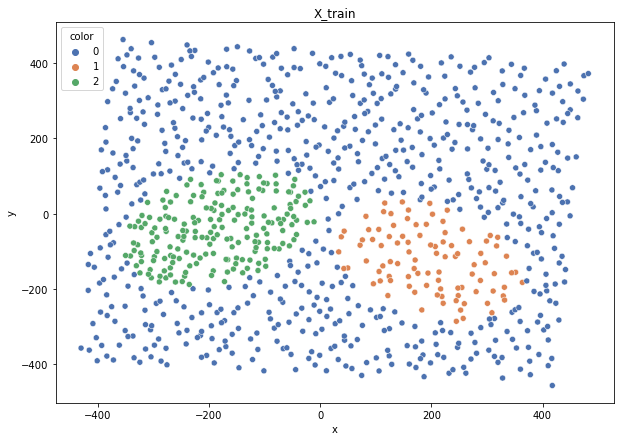

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2750.03it/s]


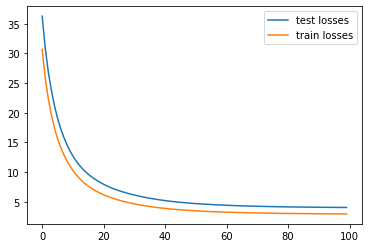

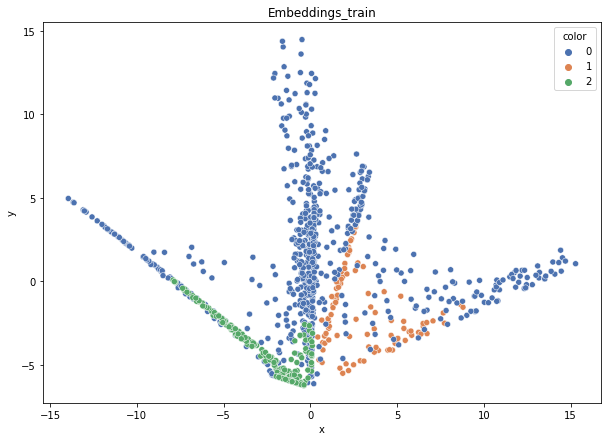

DT-f1-new-features: 0.914
DT-f1-old+new-features: 0.944
DT-f1-old-features: 0.973
DT-gmean-new-features: 0.894
DT-gmean-old+new-features: 0.936
DT-gmean-old-features: 0.973
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.958
KNN-f1-old-features: 0.958
KNN-gmean-new-features: 0.91
KNN-gmean-old+new-features: 0.955
KNN-gmean-old-features: 0.955
RF24-f1-new-features: 0.913
RF24-f1-old+new-features: 0.949
RF24-f1-old-features: 0.948
RF24-gmean-new-features: 0.896
RF24-gmean-old+new-features: 0.943
RF24-gmean-old-features: 0.936
2delikatne-cut


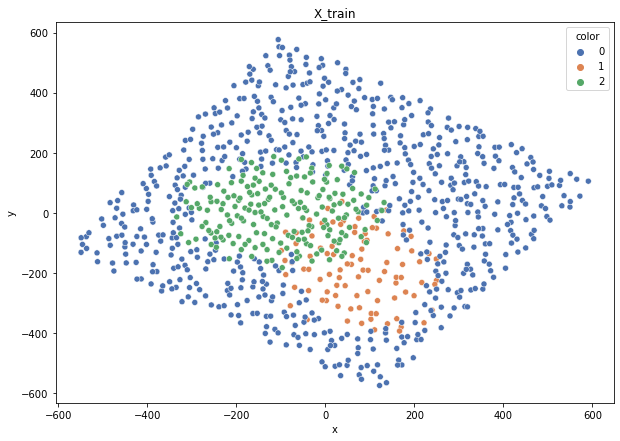

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2894.44it/s]


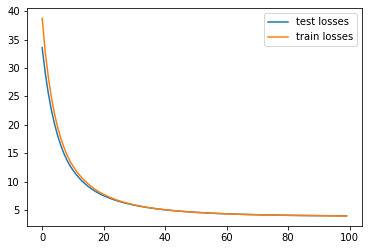

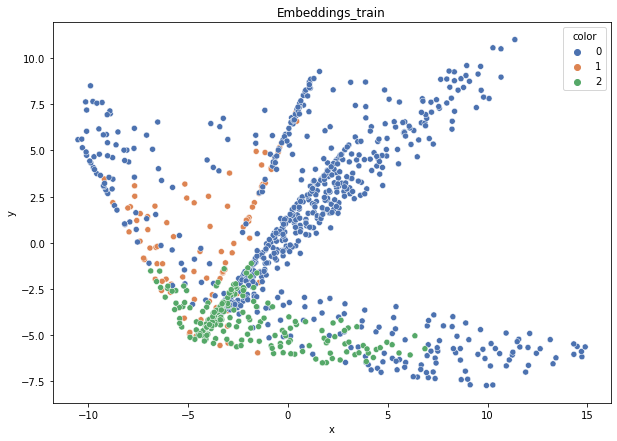

DT-f1-new-features: 0.702
DT-f1-old+new-features: 0.737
DT-f1-old-features: 0.69
DT-gmean-new-features: 0.714
DT-gmean-old+new-features: 0.73
DT-gmean-old-features: 0.674
KNN-f1-new-features: 0.685
KNN-f1-old+new-features: 0.693
KNN-f1-old-features: 0.693
KNN-gmean-new-features: 0.674
KNN-gmean-old+new-features: 0.674
KNN-gmean-old-features: 0.674
RF24-f1-new-features: 0.773
RF24-f1-old+new-features: 0.767
RF24-f1-old-features: 0.774
RF24-gmean-new-features: 0.773
RF24-gmean-old+new-features: 0.755
RF24-gmean-old-features: 0.76


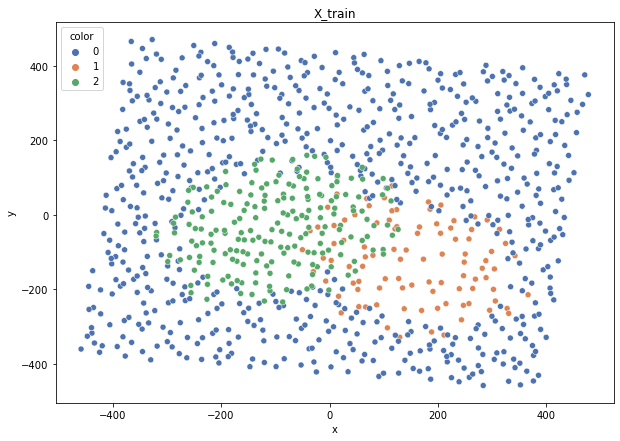

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2756.34it/s]


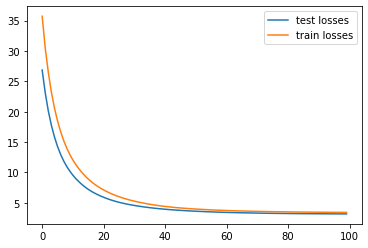

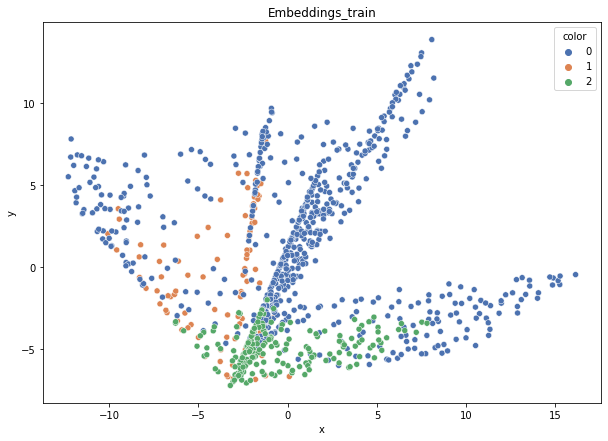

DT-f1-new-features: 0.781
DT-f1-old+new-features: 0.726
DT-f1-old-features: 0.763
DT-gmean-new-features: 0.798
DT-gmean-old+new-features: 0.728
DT-gmean-old-features: 0.787
KNN-f1-new-features: 0.717
KNN-f1-old+new-features: 0.742
KNN-f1-old-features: 0.742
KNN-gmean-new-features: 0.71
KNN-gmean-old+new-features: 0.727
KNN-gmean-old-features: 0.727
RF24-f1-new-features: 0.792
RF24-f1-old+new-features: 0.794
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.782
RF24-gmean-old+new-features: 0.785
RF24-gmean-old-features: 0.776


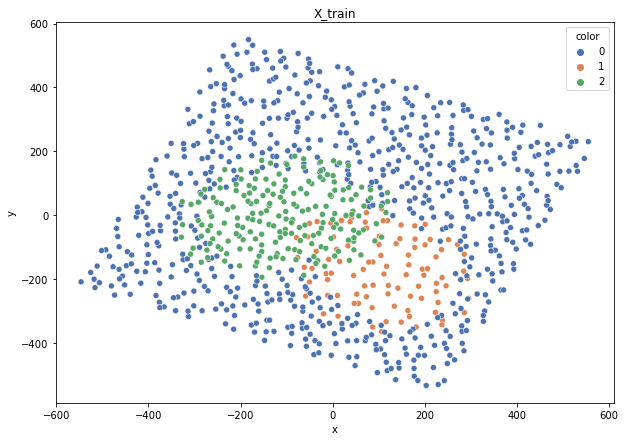

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2973.10it/s]


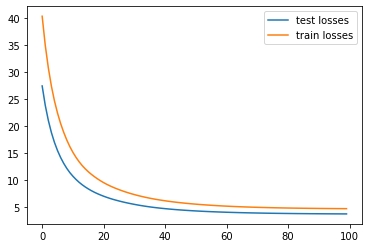

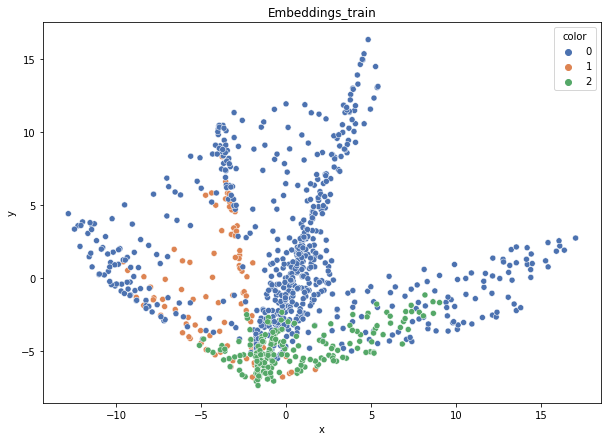

DT-f1-new-features: 0.749
DT-f1-old+new-features: 0.744
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.749
DT-gmean-old+new-features: 0.768
DT-gmean-old-features: 0.727
KNN-f1-new-features: 0.667
KNN-f1-old+new-features: 0.666
KNN-f1-old-features: 0.666
KNN-gmean-new-features: 0.626
KNN-gmean-old+new-features: 0.636
KNN-gmean-old-features: 0.636
RF24-f1-new-features: 0.778
RF24-f1-old+new-features: 0.784
RF24-f1-old-features: 0.757
RF24-gmean-new-features: 0.781
RF24-gmean-old+new-features: 0.773
RF24-gmean-old-features: 0.754


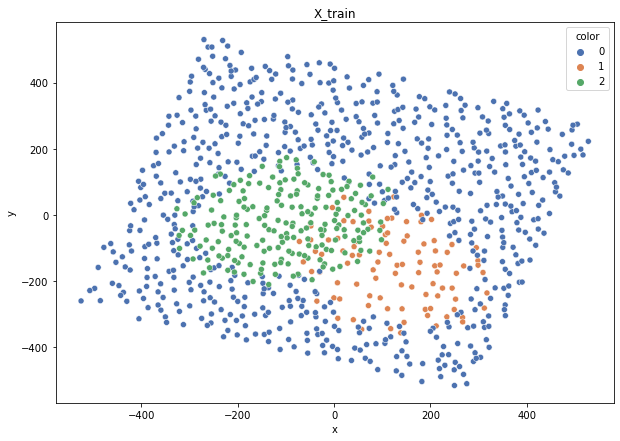

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2410.79it/s]


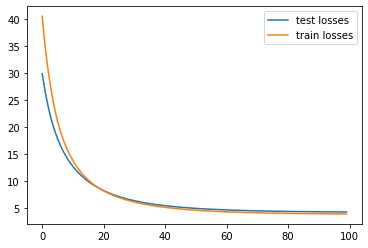

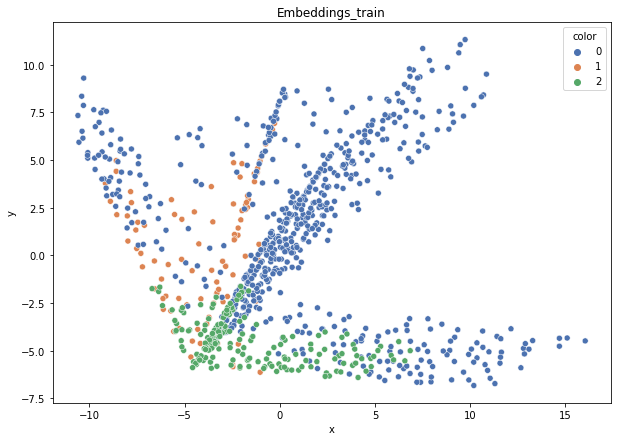

DT-f1-new-features: 0.749
DT-f1-old+new-features: 0.758
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.786
DT-gmean-old+new-features: 0.771
DT-gmean-old-features: 0.724
KNN-f1-new-features: 0.776
KNN-f1-old+new-features: 0.73
KNN-f1-old-features: 0.73
KNN-gmean-new-features: 0.789
KNN-gmean-old+new-features: 0.735
KNN-gmean-old-features: 0.735
RF24-f1-new-features: 0.772
RF24-f1-old+new-features: 0.748
RF24-f1-old-features: 0.714
RF24-gmean-new-features: 0.78
RF24-gmean-old+new-features: 0.753
RF24-gmean-old-features: 0.712


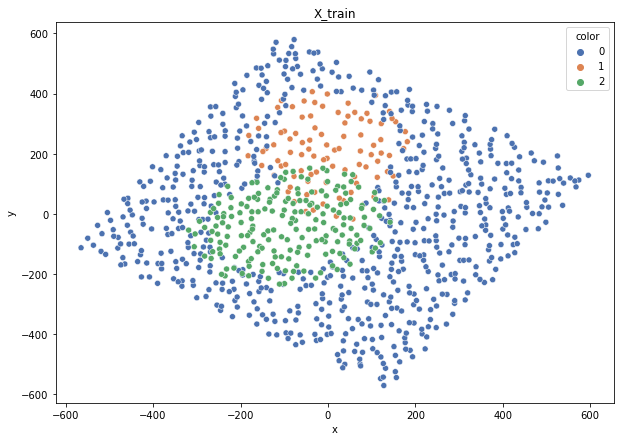

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3034.63it/s]


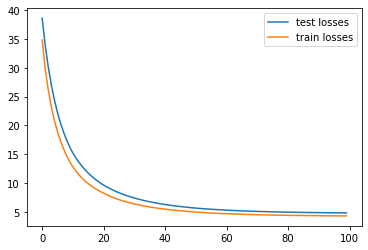

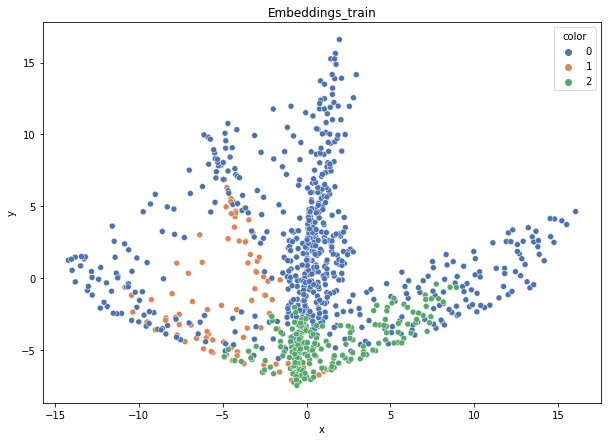

DT-f1-new-features: 0.715
DT-f1-old+new-features: 0.691
DT-f1-old-features: 0.744
DT-gmean-new-features: 0.72
DT-gmean-old+new-features: 0.684
DT-gmean-old-features: 0.774
KNN-f1-new-features: 0.706
KNN-f1-old+new-features: 0.669
KNN-f1-old-features: 0.669
KNN-gmean-new-features: 0.682
KNN-gmean-old+new-features: 0.62
KNN-gmean-old-features: 0.62
RF24-f1-new-features: 0.774
RF24-f1-old+new-features: 0.798
RF24-f1-old-features: 0.785
RF24-gmean-new-features: 0.745
RF24-gmean-old+new-features: 0.78
RF24-gmean-old-features: 0.783
3mocniej-cut


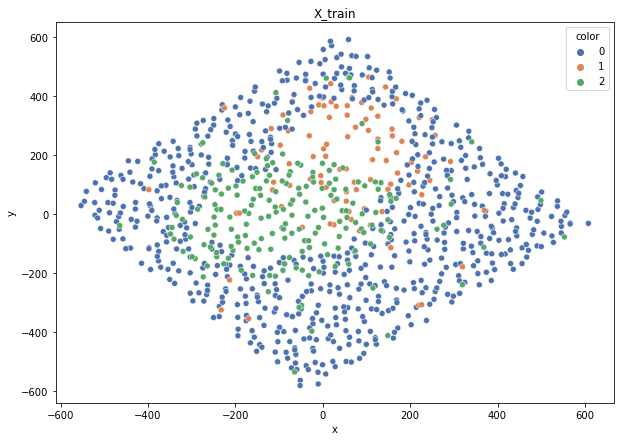

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2569.91it/s]


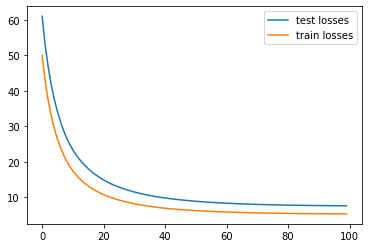

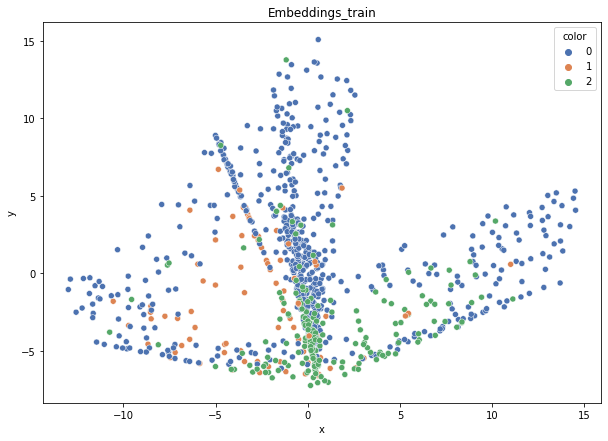

DT-f1-new-features: 0.553
DT-f1-old+new-features: 0.509
DT-f1-old-features: 0.522
DT-gmean-new-features: 0.58
DT-gmean-old+new-features: 0.504
DT-gmean-old-features: 0.524
KNN-f1-new-features: 0.513
KNN-f1-old+new-features: 0.537
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.466
KNN-gmean-old+new-features: 0.502
KNN-gmean-old-features: 0.502
RF24-f1-new-features: 0.56
RF24-f1-old+new-features: 0.563
RF24-f1-old-features: 0.545
RF24-gmean-new-features: 0.492
RF24-gmean-old+new-features: 0.493
RF24-gmean-old-features: 0.493


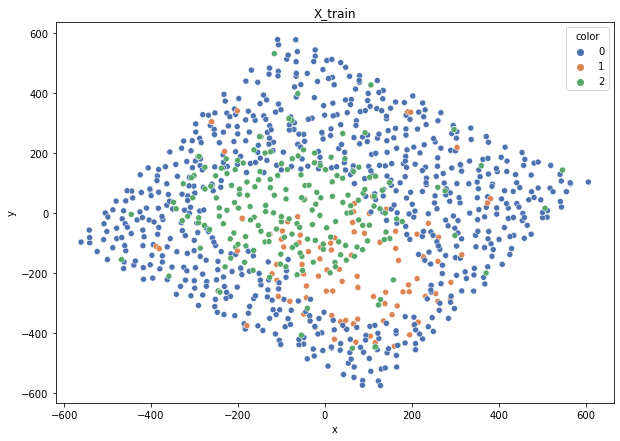

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2993.55it/s]


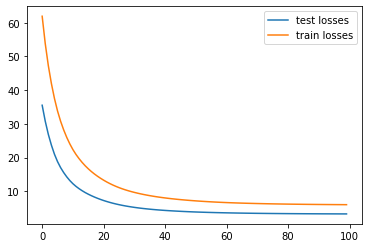

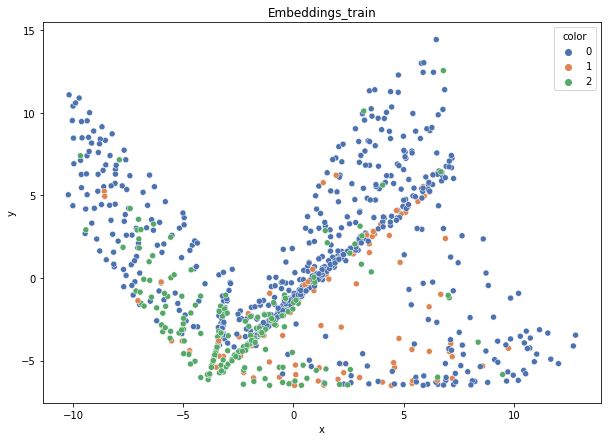

DT-f1-new-features: 0.535
DT-f1-old+new-features: 0.558
DT-f1-old-features: 0.531
DT-gmean-new-features: 0.549
DT-gmean-old+new-features: 0.566
DT-gmean-old-features: 0.547
KNN-f1-new-features: 0.521
KNN-f1-old+new-features: 0.519
KNN-f1-old-features: 0.533
KNN-gmean-new-features: 0.468
KNN-gmean-old+new-features: 0.454
KNN-gmean-old-features: 0.478
RF24-f1-new-features: 0.667
RF24-f1-old+new-features: 0.643
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.637
RF24-gmean-old+new-features: 0.627
RF24-gmean-old-features: 0.551


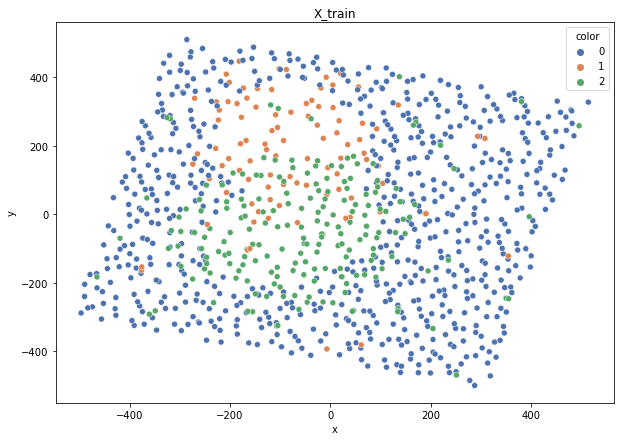

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2879.01it/s]


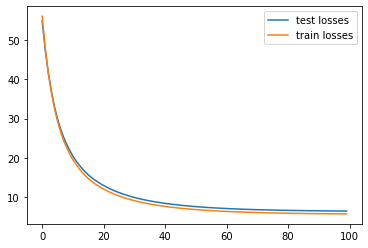

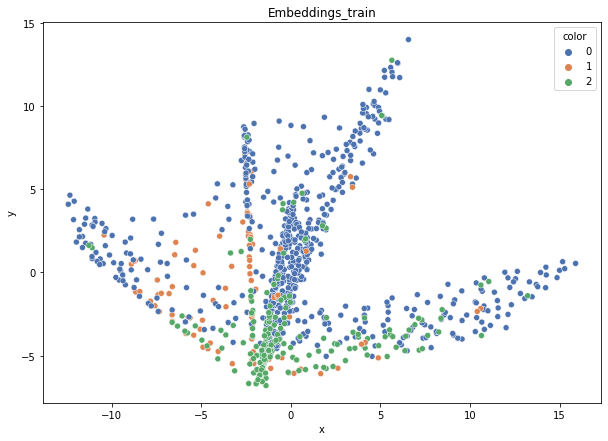

DT-f1-new-features: 0.479
DT-f1-old+new-features: 0.474
DT-f1-old-features: 0.442
DT-gmean-new-features: 0.463
DT-gmean-old+new-features: 0.454
DT-gmean-old-features: 0.43
KNN-f1-new-features: 0.431
KNN-f1-old+new-features: 0.438
KNN-f1-old-features: 0.438
KNN-gmean-new-features: 0.369
KNN-gmean-old+new-features: 0.373
KNN-gmean-old-features: 0.373
RF24-f1-new-features: 0.48
RF24-f1-old+new-features: 0.488
RF24-f1-old-features: 0.481
RF24-gmean-new-features: 0.413
RF24-gmean-old+new-features: 0.416
RF24-gmean-old-features: 0.396


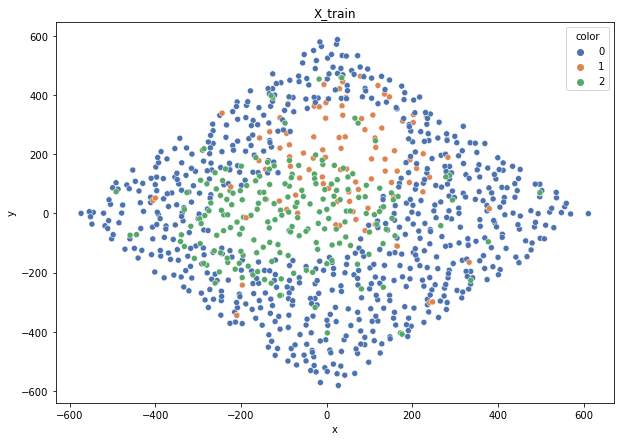

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2428.41it/s]


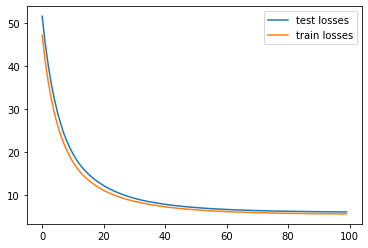

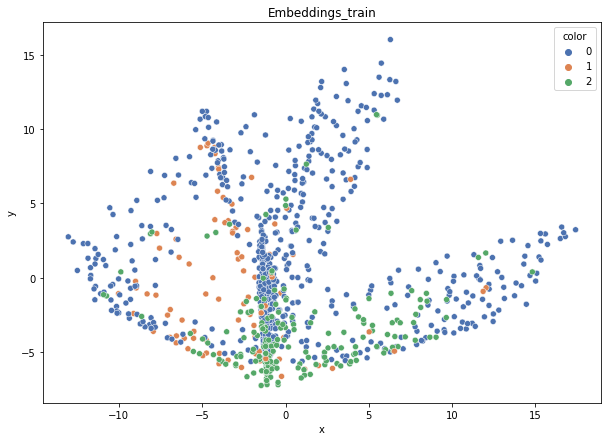

DT-f1-new-features: 0.483
DT-f1-old+new-features: 0.581
DT-f1-old-features: 0.477
DT-gmean-new-features: 0.444
DT-gmean-old+new-features: 0.591
DT-gmean-old-features: 0.473
KNN-f1-new-features: 0.482
KNN-f1-old+new-features: 0.51
KNN-f1-old-features: 0.51
KNN-gmean-new-features: 0.39
KNN-gmean-old+new-features: 0.464
KNN-gmean-old-features: 0.464
RF24-f1-new-features: 0.595
RF24-f1-old+new-features: 0.569
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.56
RF24-gmean-old+new-features: 0.535
RF24-gmean-old-features: 0.584


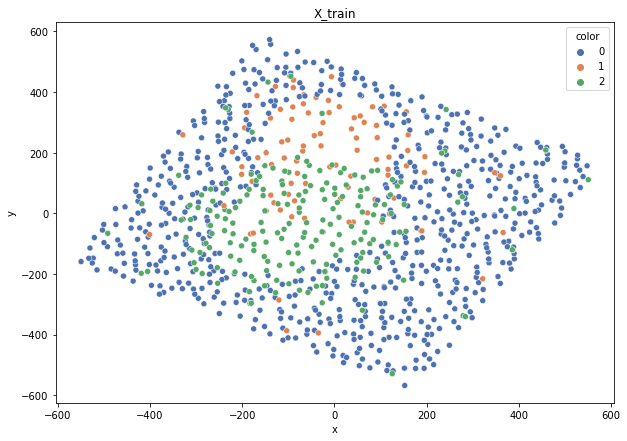

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2647.79it/s]


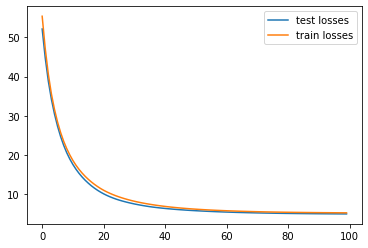

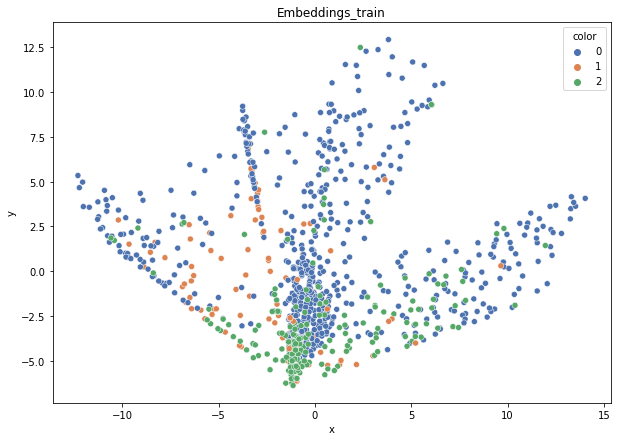

DT-f1-new-features: 0.455
DT-f1-old+new-features: 0.544
DT-f1-old-features: 0.552
DT-gmean-new-features: 0.427
DT-gmean-old+new-features: 0.517
DT-gmean-old-features: 0.536
KNN-f1-new-features: 0.502
KNN-f1-old+new-features: 0.519
KNN-f1-old-features: 0.519
KNN-gmean-new-features: 0.419
KNN-gmean-old+new-features: 0.469
KNN-gmean-old-features: 0.469
RF24-f1-new-features: 0.534
RF24-f1-old+new-features: 0.569
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.475
RF24-gmean-old+new-features: 0.502
RF24-gmean-old-features: 0.574
4delikatne-bezover-cut


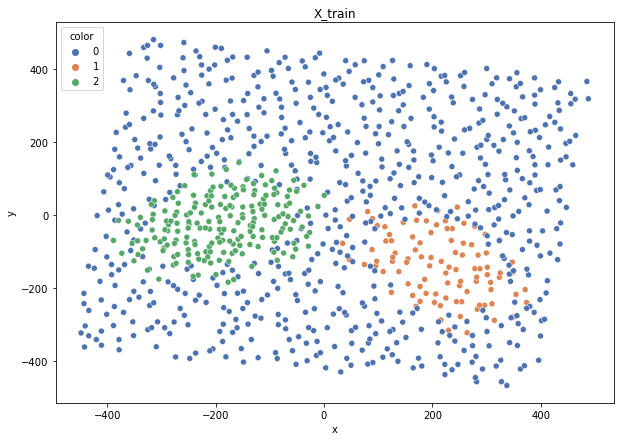

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2754.16it/s]


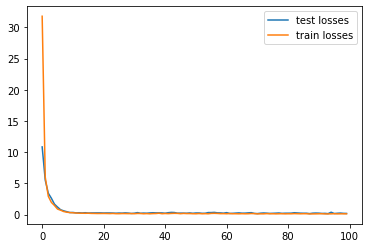

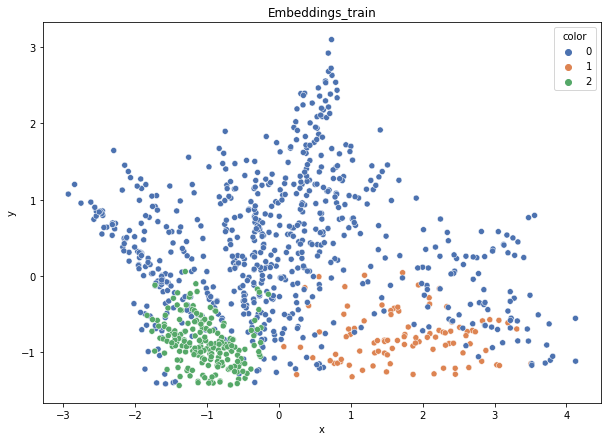

DT-f1-new-features: 0.76
DT-f1-old+new-features: 0.797
DT-f1-old-features: 0.809
DT-gmean-new-features: 0.758
DT-gmean-old+new-features: 0.821
DT-gmean-old-features: 0.814
KNN-f1-new-features: 0.753
KNN-f1-old+new-features: 0.777
KNN-f1-old-features: 0.777
KNN-gmean-new-features: 0.723
KNN-gmean-old+new-features: 0.753
KNN-gmean-old-features: 0.753
RF24-f1-new-features: 0.78
RF24-f1-old+new-features: 0.815
RF24-f1-old-features: 0.811
RF24-gmean-new-features: 0.793
RF24-gmean-old+new-features: 0.799
RF24-gmean-old-features: 0.811


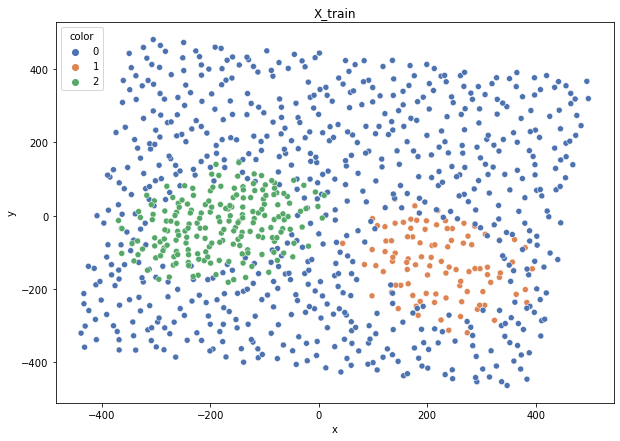

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2304.42it/s]


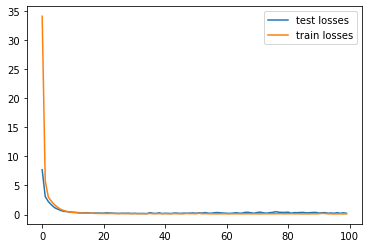

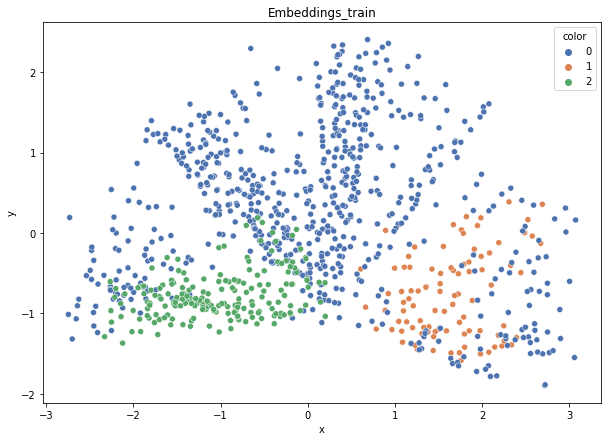

DT-f1-new-features: 0.801
DT-f1-old+new-features: 0.789
DT-f1-old-features: 0.761
DT-gmean-new-features: 0.811
DT-gmean-old+new-features: 0.792
DT-gmean-old-features: 0.769
KNN-f1-new-features: 0.745
KNN-f1-old+new-features: 0.767
KNN-f1-old-features: 0.767
KNN-gmean-new-features: 0.743
KNN-gmean-old+new-features: 0.782
KNN-gmean-old-features: 0.782
RF24-f1-new-features: 0.806
RF24-f1-old+new-features: 0.824
RF24-f1-old-features: 0.826
RF24-gmean-new-features: 0.794
RF24-gmean-old+new-features: 0.826
RF24-gmean-old-features: 0.845


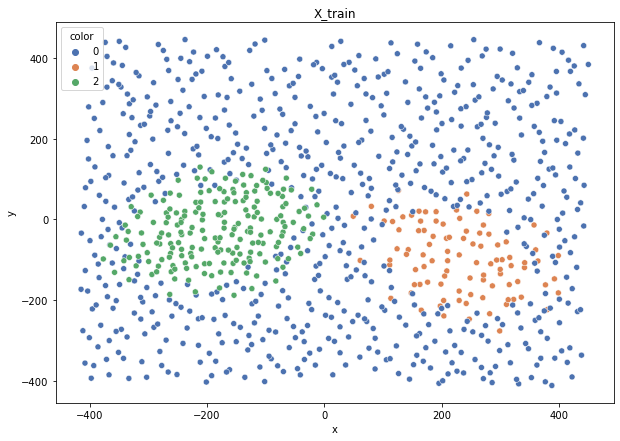

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3012.31it/s]


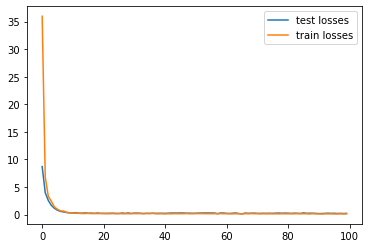

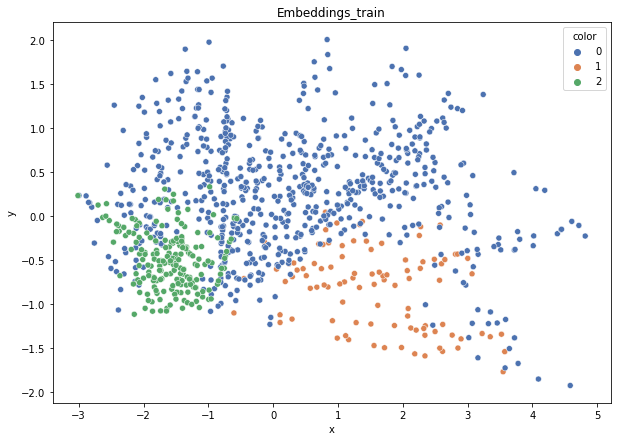

DT-f1-new-features: 0.785
DT-f1-old+new-features: 0.82
DT-f1-old-features: 0.785
DT-gmean-new-features: 0.775
DT-gmean-old+new-features: 0.83
DT-gmean-old-features: 0.785
KNN-f1-new-features: 0.755
KNN-f1-old+new-features: 0.77
KNN-f1-old-features: 0.77
KNN-gmean-new-features: 0.726
KNN-gmean-old+new-features: 0.746
KNN-gmean-old-features: 0.746
RF24-f1-new-features: 0.808
RF24-f1-old+new-features: 0.83
RF24-f1-old-features: 0.801
RF24-gmean-new-features: 0.798
RF24-gmean-old+new-features: 0.822
RF24-gmean-old-features: 0.78


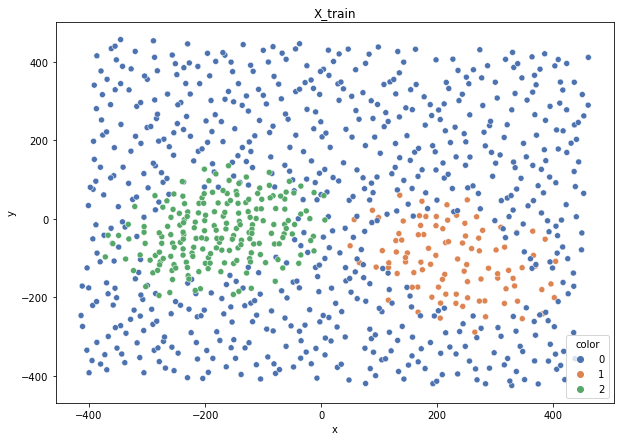

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2844.04it/s]


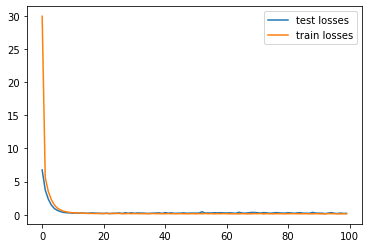

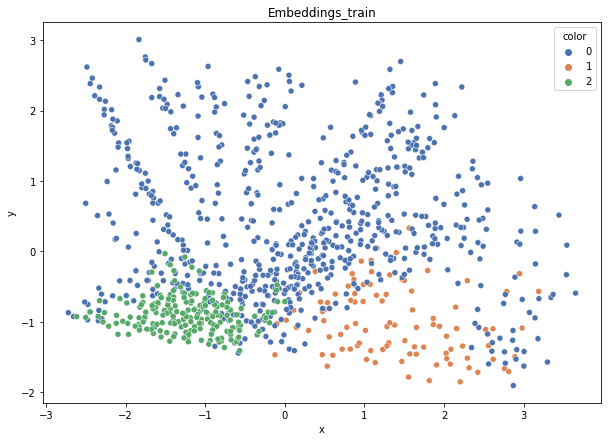

DT-f1-new-features: 0.722
DT-f1-old+new-features: 0.781
DT-f1-old-features: 0.805
DT-gmean-new-features: 0.773
DT-gmean-old+new-features: 0.823
DT-gmean-old-features: 0.831
KNN-f1-new-features: 0.763
KNN-f1-old+new-features: 0.747
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.766
KNN-gmean-old+new-features: 0.749
KNN-gmean-old-features: 0.749
RF24-f1-new-features: 0.842
RF24-f1-old+new-features: 0.856
RF24-f1-old-features: 0.827
RF24-gmean-new-features: 0.877
RF24-gmean-old+new-features: 0.871
RF24-gmean-old-features: 0.871


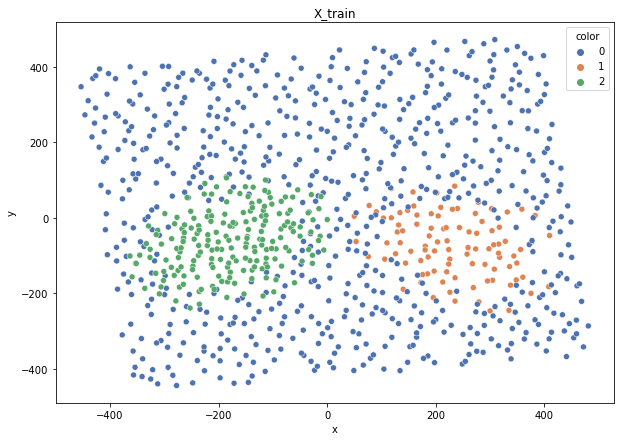

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 2789.82it/s]


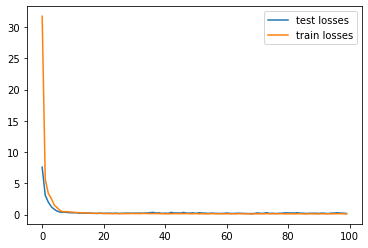

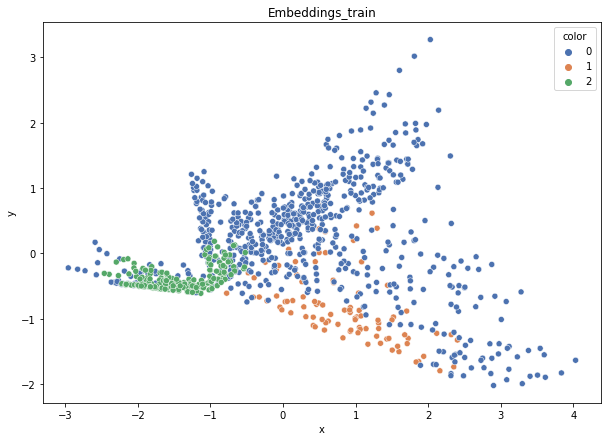

DT-f1-new-features: 0.783
DT-f1-old+new-features: 0.824
DT-f1-old-features: 0.821
DT-gmean-new-features: 0.81
DT-gmean-old+new-features: 0.851
DT-gmean-old-features: 0.866
KNN-f1-new-features: 0.769
KNN-f1-old+new-features: 0.786
KNN-f1-old-features: 0.786
KNN-gmean-new-features: 0.749
KNN-gmean-old+new-features: 0.788
KNN-gmean-old-features: 0.788
RF24-f1-new-features: 0.829
RF24-f1-old+new-features: 0.846
RF24-f1-old-features: 0.836
RF24-gmean-new-features: 0.866
RF24-gmean-old+new-features: 0.874
RF24-gmean-old-features: 0.87
balance-scale


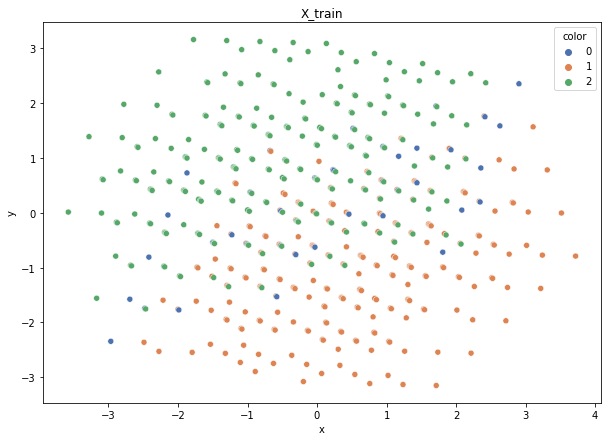

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


100%|██████████| 125/125 [00:00<00:00, 2862.52it/s]


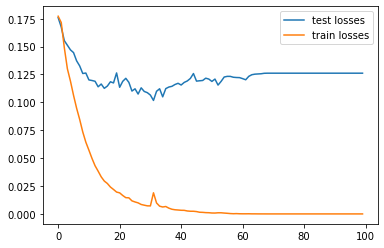

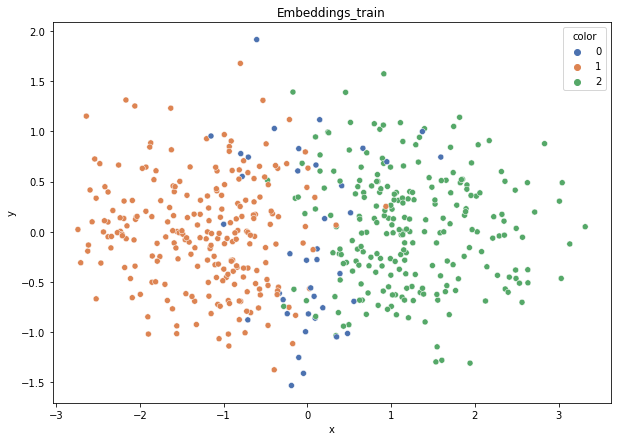

DT-f1-new-features: 0.666
DT-f1-old+new-features: 0.582
DT-f1-old-features: 0.568
DT-gmean-new-features: 0.683
DT-gmean-old+new-features: 0.406
DT-gmean-old-features: 0.088
KNN-f1-new-features: 0.676
KNN-f1-old+new-features: 0.567
KNN-f1-old-features: 0.577
KNN-gmean-new-features: 0.61
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.091
RF24-f1-new-features: 0.697
RF24-f1-old+new-features: 0.671
RF24-f1-old-features: 0.588
RF24-gmean-new-features: 0.618
RF24-gmean-old+new-features: 0.546
RF24-gmean-old-features: 0.092


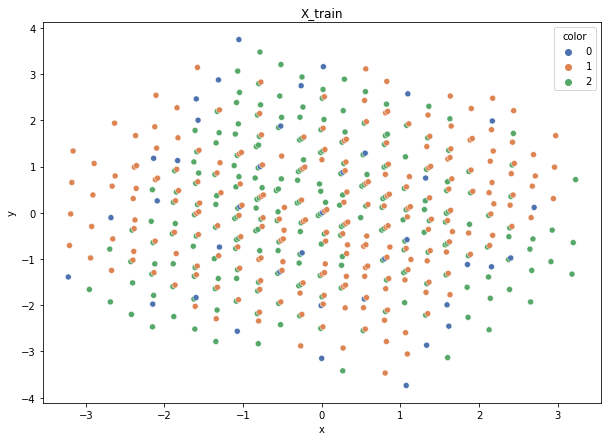

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


100%|██████████| 125/125 [00:00<00:00, 2448.19it/s]


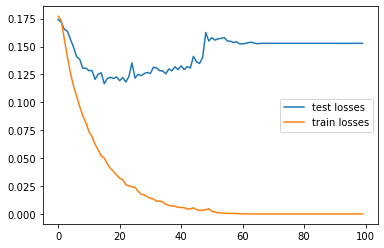

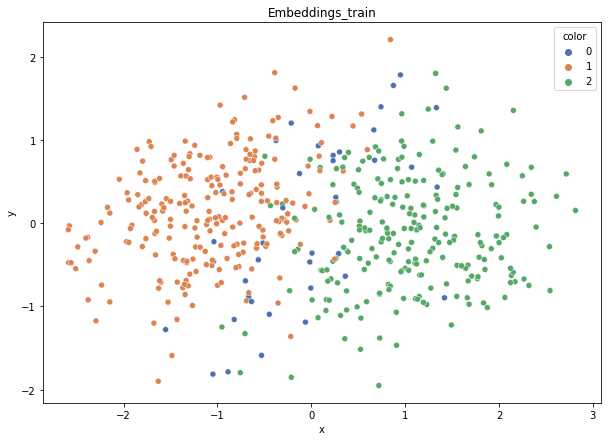

DT-f1-new-features: 0.66
DT-f1-old+new-features: 0.657
DT-f1-old-features: 0.638
DT-gmean-new-features: 0.594
DT-gmean-old+new-features: 0.598
DT-gmean-old-features: 0.585
KNN-f1-new-features: 0.557
KNN-f1-old+new-features: 0.573
KNN-f1-old-features: 0.558
KNN-gmean-new-features: 0.09
KNN-gmean-old+new-features: 0.092
KNN-gmean-old-features: 0.089
RF24-f1-new-features: 0.639
RF24-f1-old+new-features: 0.633
RF24-f1-old-features: 0.595
RF24-gmean-new-features: 0.434
RF24-gmean-old+new-features: 0.431
RF24-gmean-old-features: 0.093


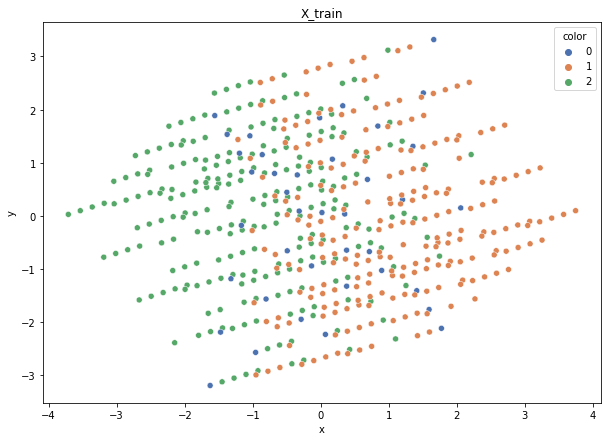

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {2: 0.12614436991098174, 1: 0.1266928236932034, 0: 0.7471628063958148}


100%|██████████| 125/125 [00:00<00:00, 2515.35it/s]


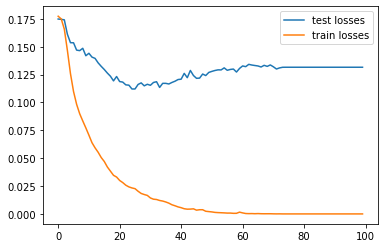

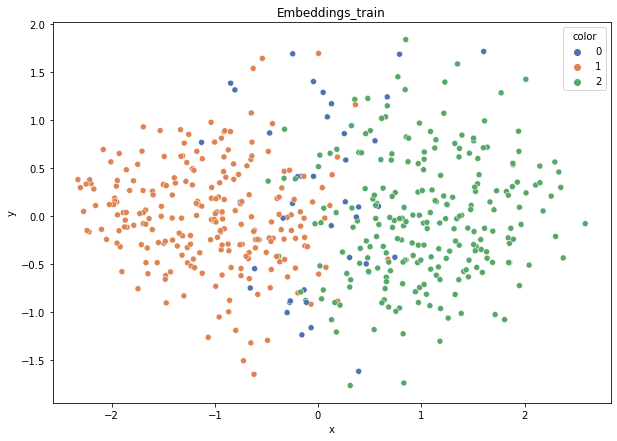

DT-f1-new-features: 0.594
DT-f1-old+new-features: 0.633
DT-f1-old-features: 0.655
DT-gmean-new-features: 0.5
DT-gmean-old+new-features: 0.575
DT-gmean-old-features: 0.597
KNN-f1-new-features: 0.599
KNN-f1-old+new-features: 0.545
KNN-f1-old-features: 0.574
KNN-gmean-new-features: 0.504
KNN-gmean-old+new-features: 0.087
KNN-gmean-old-features: 0.091
RF24-f1-new-features: 0.63
RF24-f1-old+new-features: 0.601
RF24-f1-old-features: 0.6
RF24-gmean-new-features: 0.581
RF24-gmean-old+new-features: 0.417
RF24-gmean-old-features: 0.093


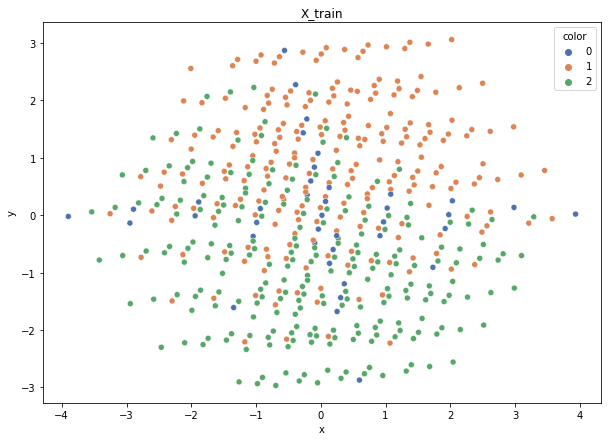

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.12614436991098174, 1: 0.1266928236932034}


100%|██████████| 125/125 [00:00<00:00, 2247.85it/s]


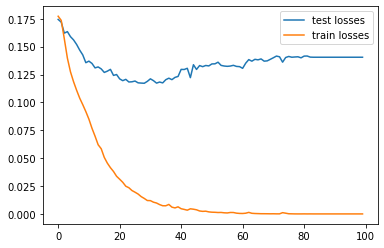

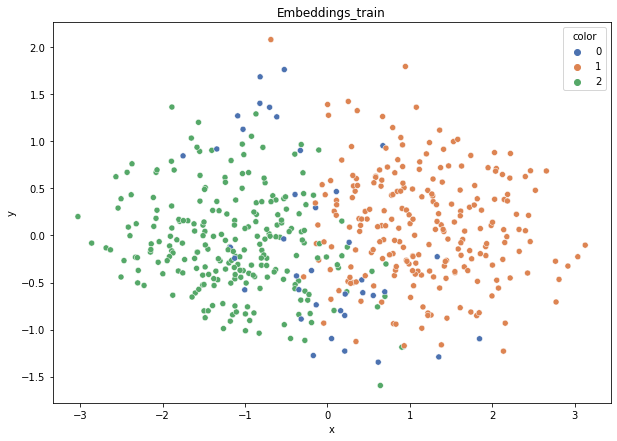

DT-f1-new-features: 0.582
DT-f1-old+new-features: 0.577
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.406
DT-gmean-old+new-features: 0.4
DT-gmean-old-features: 0.397
KNN-f1-new-features: 0.683
KNN-f1-old+new-features: 0.557
KNN-f1-old-features: 0.558
KNN-gmean-new-features: 0.653
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.088
RF24-f1-new-features: 0.647
RF24-f1-old+new-features: 0.661
RF24-f1-old-features: 0.603
RF24-gmean-new-features: 0.529
RF24-gmean-old+new-features: 0.445
RF24-gmean-old-features: 0.094


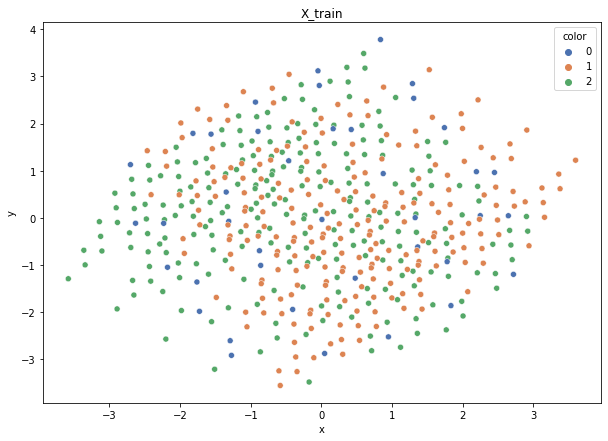

Class cardinalities: Counter({2: 230, 1: 230, 0: 40})
Weights: {0: 0.7419354838709677, 2: 0.12903225806451613, 1: 0.12903225806451613}


100%|██████████| 125/125 [00:00<00:00, 2647.88it/s]


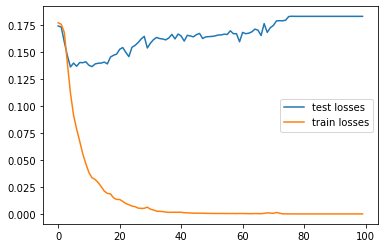

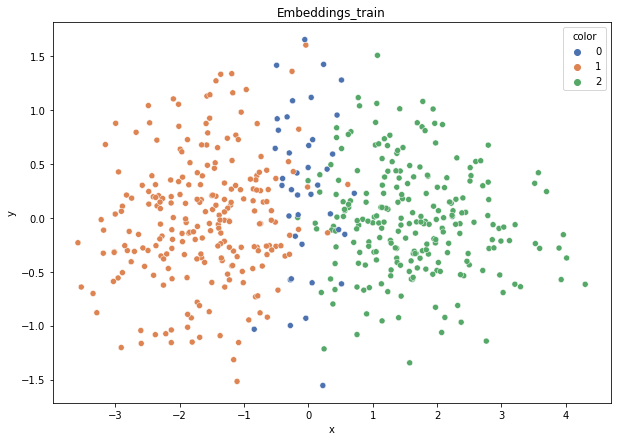

DT-f1-new-features: 0.656
DT-f1-old+new-features: 0.634
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.615
DT-gmean-old+new-features: 0.541
DT-gmean-old-features: 0.415
KNN-f1-new-features: 0.669
KNN-f1-old+new-features: 0.566
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.624
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.088
RF24-f1-new-features: 0.672
RF24-f1-old+new-features: 0.721
RF24-f1-old-features: 0.587
RF24-gmean-new-features: 0.628
RF24-gmean-old+new-features: 0.705
RF24-gmean-old-features: 0.091
cleveland


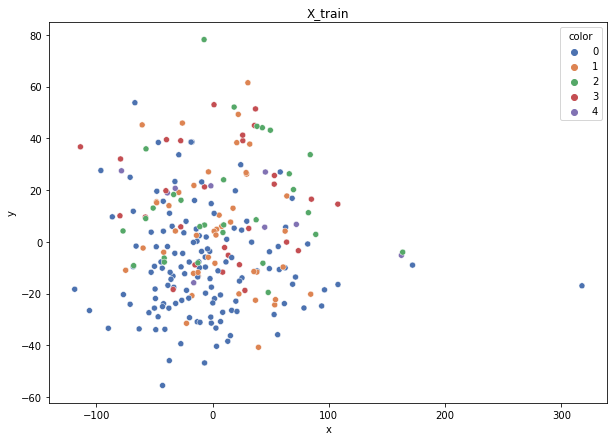

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 2559.96it/s]


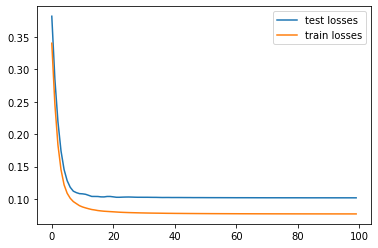

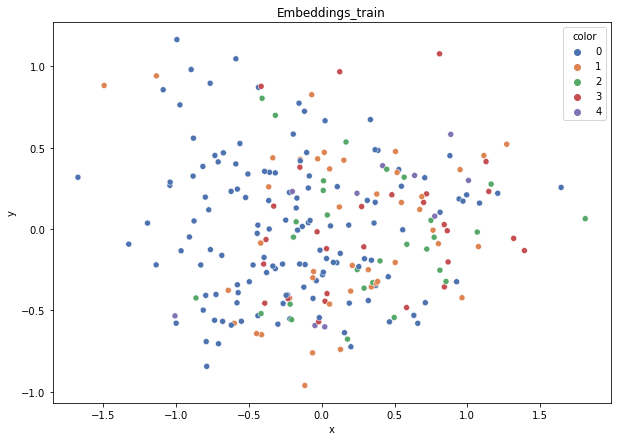

DT-f1-new-features: 0.279
DT-f1-old+new-features: 0.32
DT-f1-old-features: 0.267
DT-gmean-new-features: 0.232
DT-gmean-old+new-features: 0.278
DT-gmean-old-features: 0.098
KNN-f1-new-features: 0.282
KNN-f1-old+new-features: 0.23
KNN-f1-old-features: 0.23
KNN-gmean-new-features: 0.23
KNN-gmean-old+new-features: 0.086
KNN-gmean-old-features: 0.086
RF24-f1-new-features: 0.323
RF24-f1-old+new-features: 0.328
RF24-f1-old-features: 0.316
RF24-gmean-new-features: 0.26
RF24-gmean-old+new-features: 0.1
RF24-gmean-old-features: 0.092


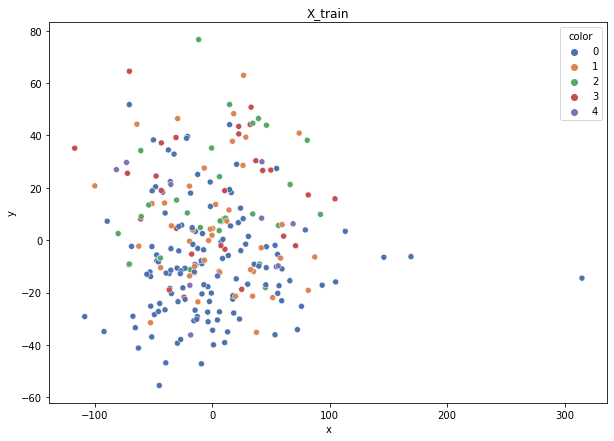

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 2860.09it/s]


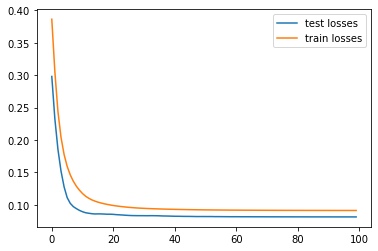

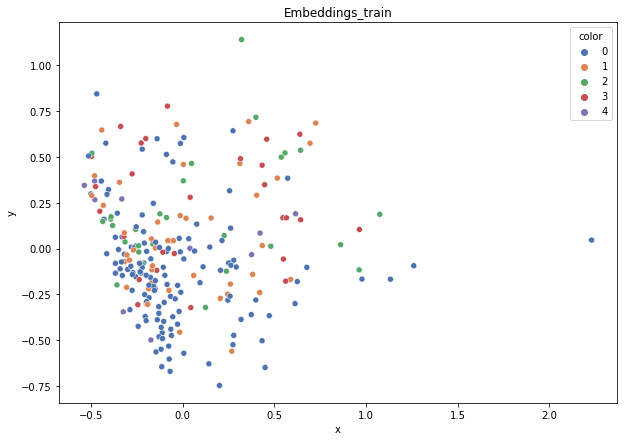

DT-f1-new-features: 0.321
DT-f1-old+new-features: 0.206
DT-f1-old-features: 0.305
DT-gmean-new-features: 0.125
DT-gmean-old+new-features: 0.03
DT-gmean-old-features: 0.25
KNN-f1-new-features: 0.21
KNN-f1-old+new-features: 0.22
KNN-f1-old-features: 0.22
KNN-gmean-new-features: 0.034
KNN-gmean-old+new-features: 0.074
KNN-gmean-old-features: 0.074
RF24-f1-new-features: 0.242
RF24-f1-old+new-features: 0.329
RF24-f1-old-features: 0.305
RF24-gmean-new-features: 0.081
RF24-gmean-old+new-features: 0.101
RF24-gmean-old-features: 0.093


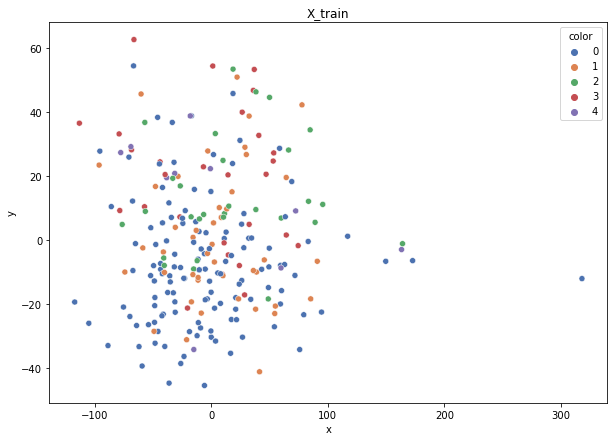

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 3: 0.17807468492085946, 1: 0.11332025404054694, 2: 0.1719341785442781, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 2321.56it/s]


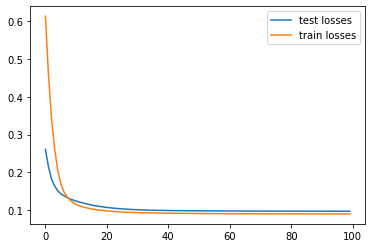

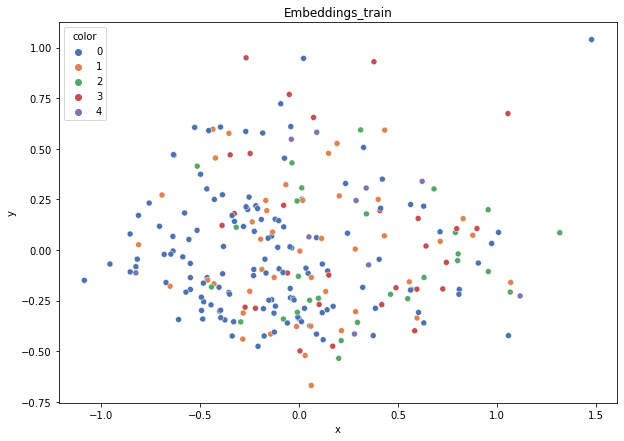

DT-f1-new-features: 0.249
DT-f1-old+new-features: 0.338
DT-f1-old-features: 0.39
DT-gmean-new-features: 0.038
DT-gmean-old+new-features: 0.332
DT-gmean-old-features: 0.138
KNN-f1-new-features: 0.25
KNN-f1-old+new-features: 0.264
KNN-f1-old-features: 0.264
KNN-gmean-new-features: 0.086
KNN-gmean-old+new-features: 0.088
KNN-gmean-old-features: 0.088
RF24-f1-new-features: 0.249
RF24-f1-old+new-features: 0.335
RF24-f1-old-features: 0.315
RF24-gmean-new-features: 0.035
RF24-gmean-old+new-features: 0.105
RF24-gmean-old-features: 0.1


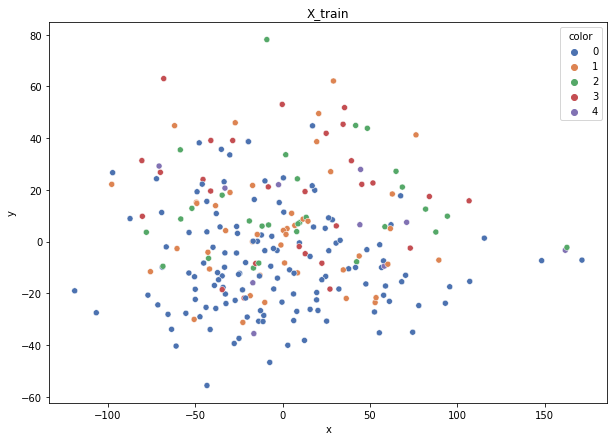

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 11})
Weights: {0: 0.03986894846317969, 2: 0.18009766374746689, 1: 0.11870073292446681, 3: 0.18652972316701927, 4: 0.47480293169786725}


100%|██████████| 60/60 [00:00<00:00, 2855.28it/s]


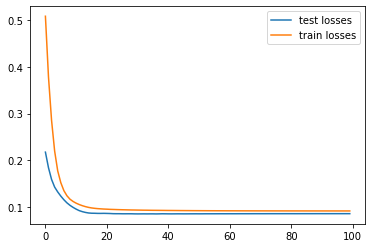

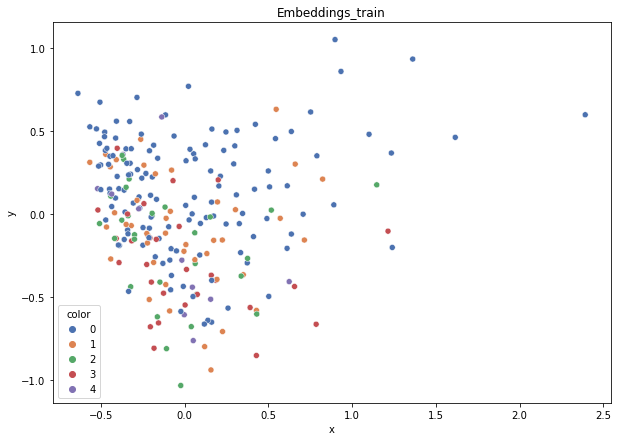

DT-f1-new-features: 0.241
DT-f1-old+new-features: 0.161
DT-f1-old-features: 0.305
DT-gmean-new-features: 0.088
DT-gmean-old+new-features: 0.023
DT-gmean-old-features: 0.112
KNN-f1-new-features: 0.16
KNN-f1-old+new-features: 0.275
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.012
KNN-gmean-old+new-features: 0.23
KNN-gmean-old-features: 0.23
RF24-f1-new-features: 0.2
RF24-f1-old+new-features: 0.284
RF24-f1-old-features: 0.304
RF24-gmean-new-features: 0.027
RF24-gmean-old+new-features: 0.037
RF24-gmean-old-features: 0.098


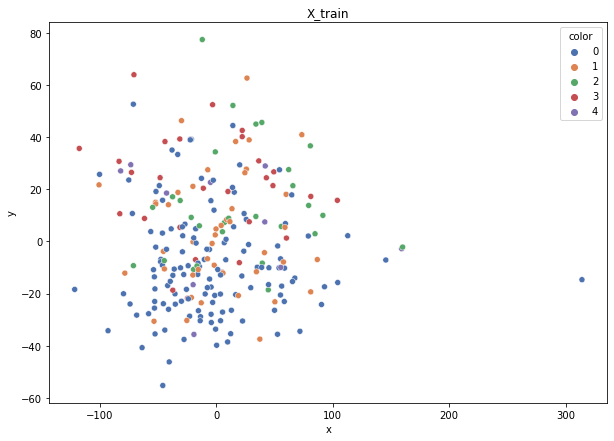

Class cardinalities: Counter({0: 132, 1: 44, 2: 28, 3: 28, 4: 11})
Weights: {2: 0.18539325842696627, 1: 0.11797752808988764, 0: 0.03932584269662921, 3: 0.18539325842696627, 4: 0.47191011235955055}


100%|██████████| 60/60 [00:00<00:00, 2950.13it/s]


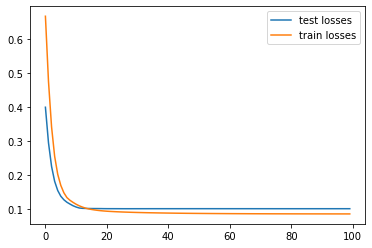

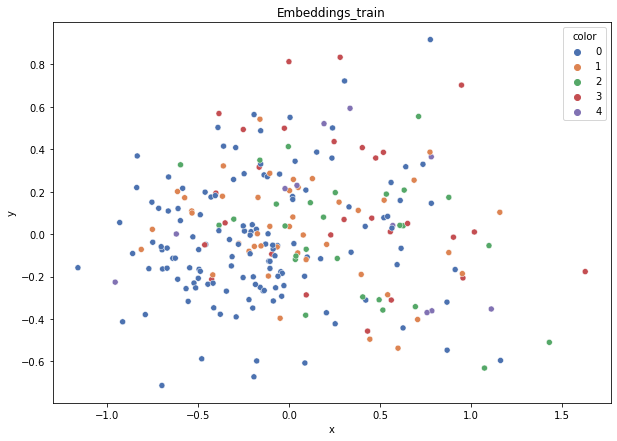

DT-f1-new-features: 0.139
DT-f1-old+new-features: 0.24
DT-f1-old-features: 0.227
DT-gmean-new-features: 0.01
DT-gmean-old+new-features: 0.083
DT-gmean-old-features: 0.03
KNN-f1-new-features: 0.157
KNN-f1-old+new-features: 0.212
KNN-f1-old-features: 0.212
KNN-gmean-new-features: 0.026
KNN-gmean-old+new-features: 0.032
KNN-gmean-old-features: 0.032
RF24-f1-new-features: 0.306
RF24-f1-old+new-features: 0.467
RF24-f1-old-features: 0.411
RF24-gmean-new-features: 0.099
RF24-gmean-old+new-features: 0.343
RF24-gmean-old-features: 0.13
cleveland_v2


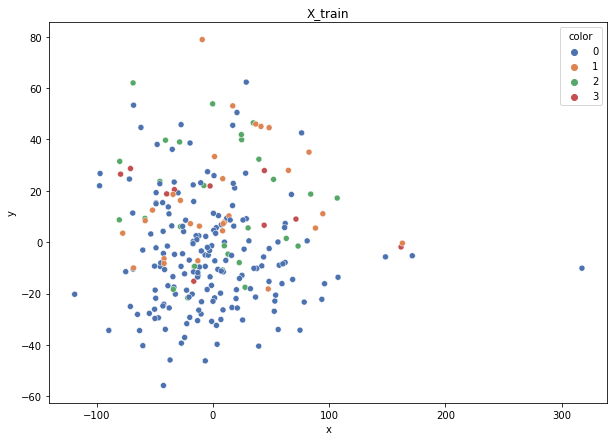

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 2691.77it/s]


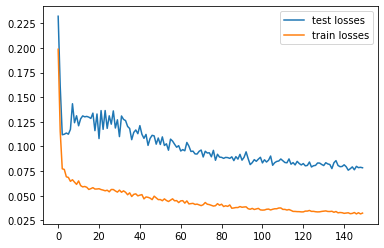

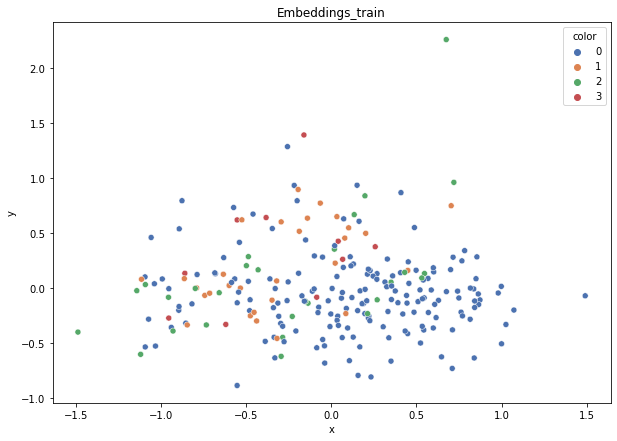

DT-f1-new-features: 0.298
DT-f1-old+new-features: 0.369
DT-f1-old-features: 0.358
DT-gmean-new-features: 0.086
DT-gmean-old+new-features: 0.099
DT-gmean-old-features: 0.099
KNN-f1-new-features: 0.301
KNN-f1-old+new-features: 0.24
KNN-f1-old-features: 0.24
KNN-gmean-new-features: 0.074
KNN-gmean-old+new-features: 0.019
KNN-gmean-old-features: 0.019
RF24-f1-new-features: 0.357
RF24-f1-old+new-features: 0.362
RF24-f1-old-features: 0.462
RF24-gmean-new-features: 0.085
RF24-gmean-old+new-features: 0.086
RF24-gmean-old-features: 0.121


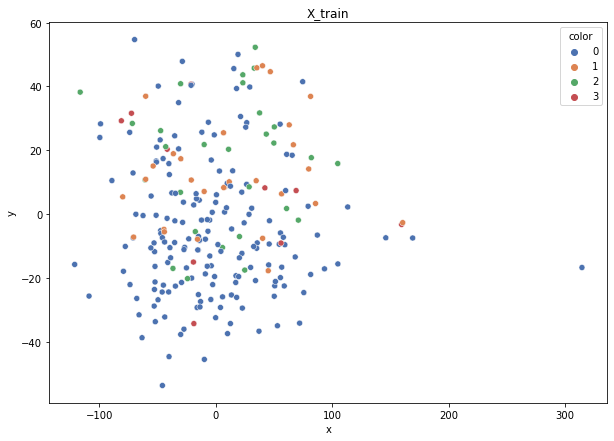

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 2577.42it/s]


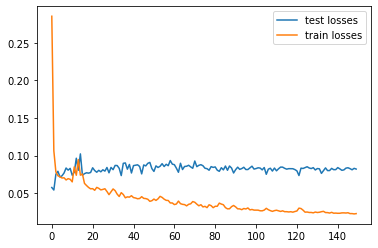

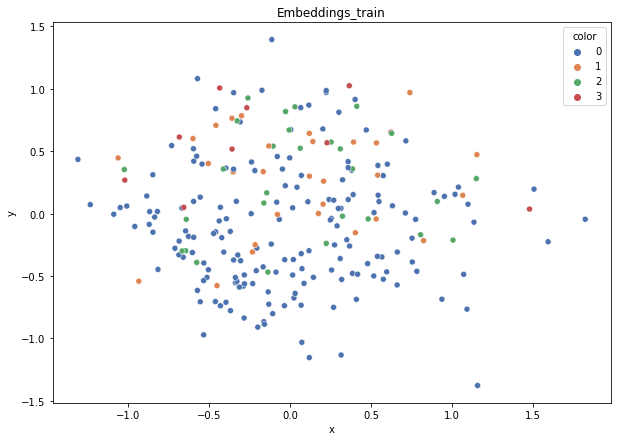

DT-f1-new-features: 0.4
DT-f1-old+new-features: 0.416
DT-f1-old-features: 0.484
DT-gmean-new-features: 0.375
DT-gmean-old+new-features: 0.123
DT-gmean-old-features: 0.546
KNN-f1-new-features: 0.437
KNN-f1-old+new-features: 0.306
KNN-f1-old-features: 0.306
KNN-gmean-new-features: 0.113
KNN-gmean-old+new-features: 0.074
KNN-gmean-old-features: 0.074
RF24-f1-new-features: 0.326
RF24-f1-old+new-features: 0.316
RF24-f1-old-features: 0.346
RF24-gmean-new-features: 0.084
RF24-gmean-old+new-features: 0.077
RF24-gmean-old-features: 0.085


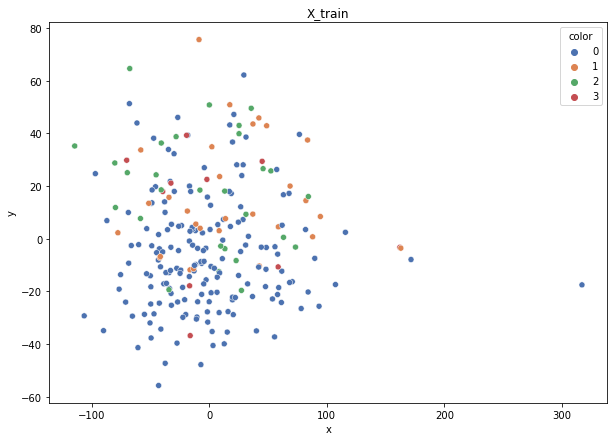

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 2358.98it/s]


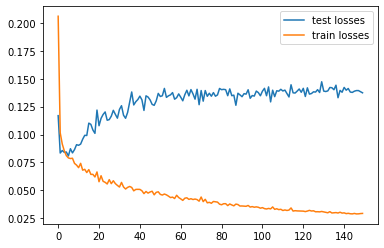

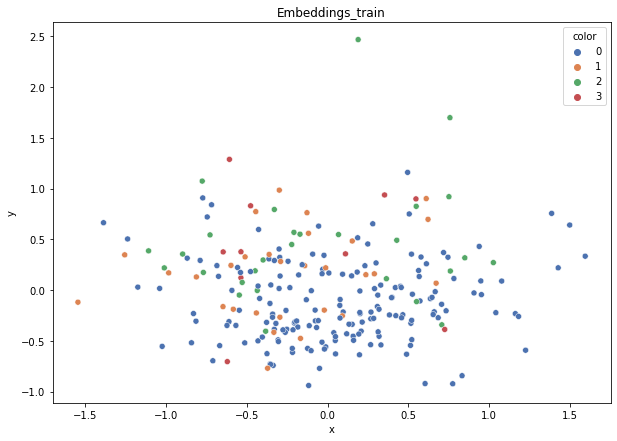

DT-f1-new-features: 0.395
DT-f1-old+new-features: 0.274
DT-f1-old-features: 0.294
DT-gmean-new-features: 0.32
DT-gmean-old+new-features: 0.064
DT-gmean-old-features: 0.075
KNN-f1-new-features: 0.301
KNN-f1-old+new-features: 0.389
KNN-f1-old-features: 0.389
KNN-gmean-new-features: 0.024
KNN-gmean-old+new-features: 0.103
KNN-gmean-old-features: 0.103
RF24-f1-new-features: 0.423
RF24-f1-old+new-features: 0.313
RF24-f1-old-features: 0.26
RF24-gmean-new-features: 0.28
RF24-gmean-old+new-features: 0.067
RF24-gmean-old-features: 0.019


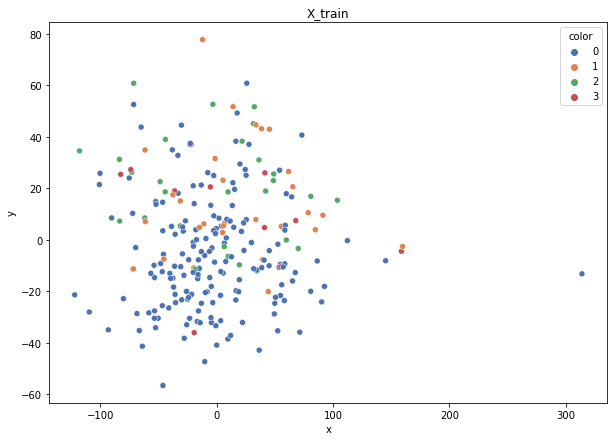

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 11})
Weights: {1: 0.20670586024536255, 0: 0.03425411398351722, 2: 0.21408821239698264, 3: 0.5449518133741377}


100%|██████████| 60/60 [00:00<00:00, 2742.75it/s]


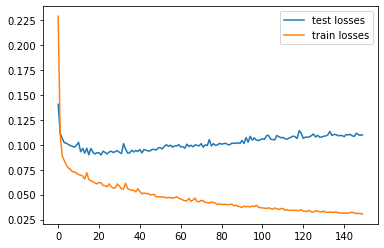

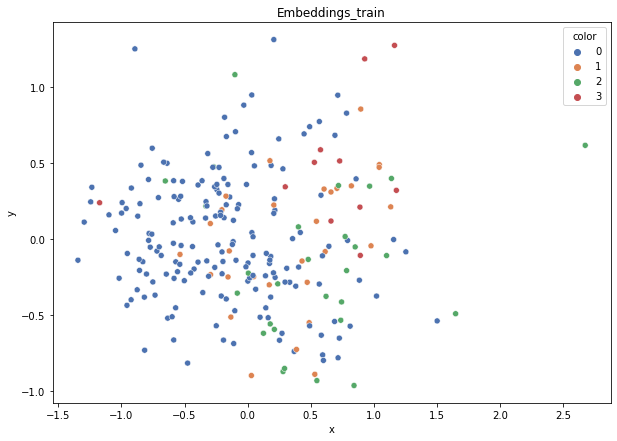

DT-f1-new-features: 0.217
DT-f1-old+new-features: 0.185
DT-f1-old-features: 0.238
DT-gmean-new-features: 0.018
DT-gmean-old+new-features: 0.005
DT-gmean-old-features: 0.018
KNN-f1-new-features: 0.253
KNN-f1-old+new-features: 0.316
KNN-f1-old-features: 0.316
KNN-gmean-new-features: 0.019
KNN-gmean-old+new-features: 0.076
KNN-gmean-old-features: 0.076
RF24-f1-new-features: 0.317
RF24-f1-old+new-features: 0.442
RF24-f1-old-features: 0.432
RF24-gmean-new-features: 0.066
RF24-gmean-old+new-features: 0.105
RF24-gmean-old-features: 0.104


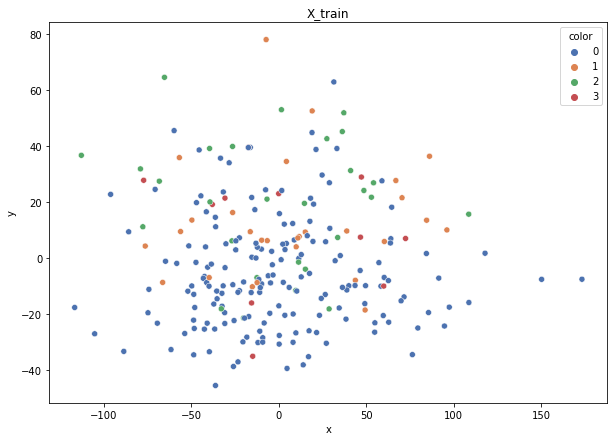

Class cardinalities: Counter({0: 176, 1: 28, 2: 28, 3: 11})
Weights: {0: 0.03381642512077295, 1: 0.21256038647342995, 2: 0.21256038647342995, 3: 0.5410628019323672}


100%|██████████| 60/60 [00:00<00:00, 2781.25it/s]


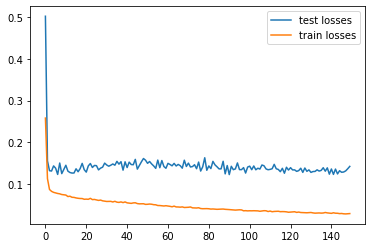

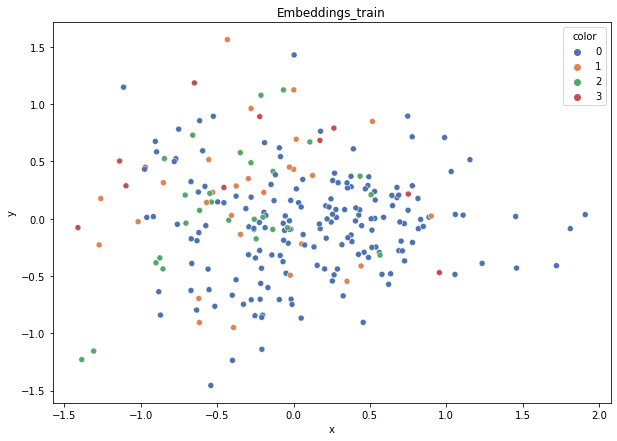

DT-f1-new-features: 0.403
DT-f1-old+new-features: 0.283
DT-f1-old-features: 0.335
DT-gmean-new-features: 0.376
DT-gmean-old+new-features: 0.071
DT-gmean-old-features: 0.092
KNN-f1-new-features: 0.303
KNN-f1-old+new-features: 0.323
KNN-f1-old-features: 0.323
KNN-gmean-new-features: 0.084
KNN-gmean-old+new-features: 0.087
KNN-gmean-old-features: 0.087
RF24-f1-new-features: 0.393
RF24-f1-old+new-features: 0.458
RF24-f1-old-features: 0.29
RF24-gmean-new-features: 0.347
RF24-gmean-old+new-features: 0.419
RF24-gmean-old-features: 0.022
glass


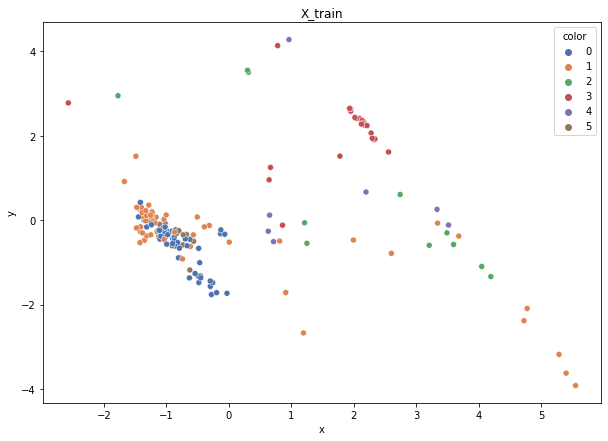

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 13, 2: 11, 4: 7})
Weights: {0: 0.04597401674853029, 1: 0.042205654719962245, 3: 0.1119367364312042, 5: 0.1980419183013613, 2: 0.2340495398106997, 4: 0.36779213398824234}


100%|██████████| 43/43 [00:00<00:00, 2662.58it/s]


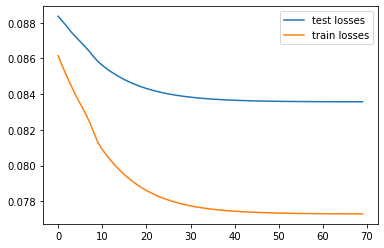

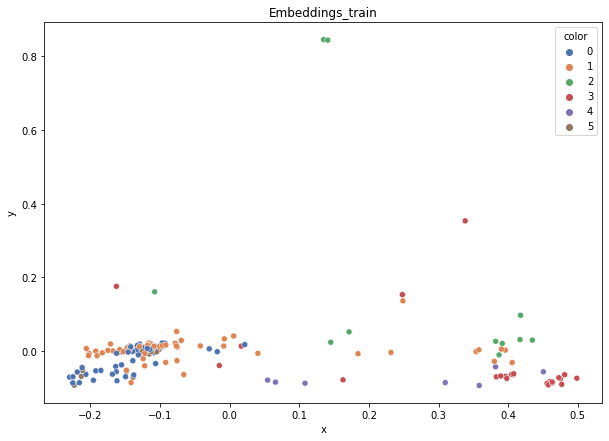

DT-f1-new-features: 0.719
DT-f1-old+new-features: 0.577
DT-f1-old-features: 0.709
DT-gmean-new-features: 0.724
DT-gmean-old+new-features: 0.217
DT-gmean-old-features: 0.737
KNN-f1-new-features: 0.758
KNN-f1-old+new-features: 0.718
KNN-f1-old-features: 0.718
KNN-gmean-new-features: 0.661
KNN-gmean-old+new-features: 0.698
KNN-gmean-old-features: 0.698
RF24-f1-new-features: 0.72
RF24-f1-old+new-features: 0.863
RF24-f1-old-features: 0.774
RF24-gmean-new-features: 0.681
RF24-gmean-old+new-features: 0.844
RF24-gmean-old-features: 0.731


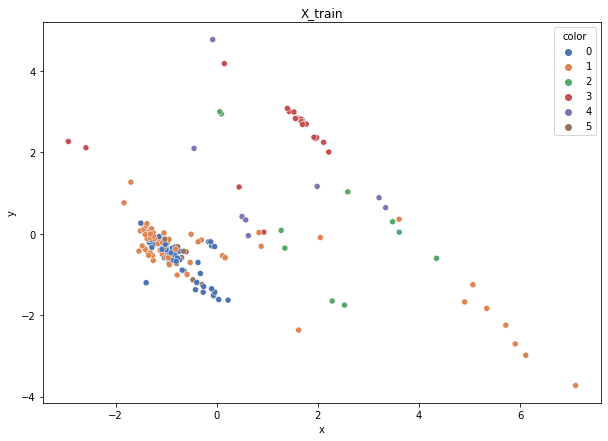

Class cardinalities: Counter({1: 60, 0: 56, 3: 24, 5: 13, 2: 10, 4: 8})
Weights: {5: 0.2034390893678857, 4: 0.33058852022281426, 1: 0.0440784693630419, 0: 0.047226931460402036, 3: 0.11019617340760475, 2: 0.2644708161782514}


100%|██████████| 43/43 [00:00<00:00, 2441.39it/s]


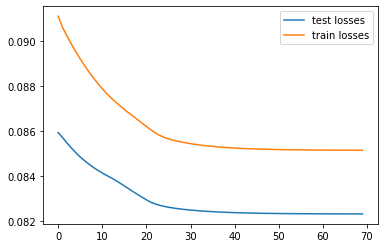

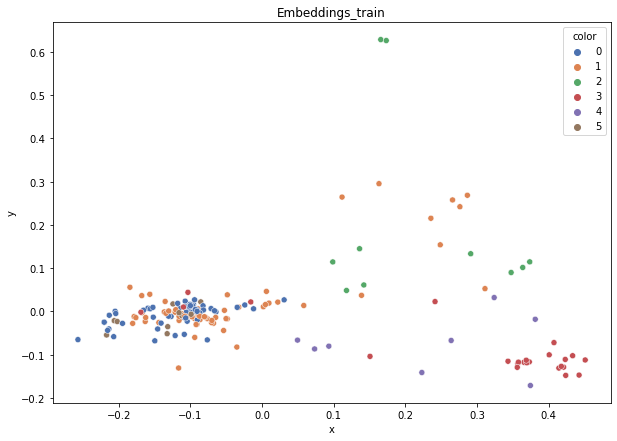

DT-f1-new-features: 0.522
DT-f1-old+new-features: 0.507
DT-f1-old-features: 0.53
DT-gmean-new-features: 0.214
DT-gmean-old+new-features: 0.207
DT-gmean-old-features: 0.232
KNN-f1-new-features: 0.701
KNN-f1-old+new-features: 0.69
KNN-f1-old-features: 0.69
KNN-gmean-new-features: 0.653
KNN-gmean-old+new-features: 0.733
KNN-gmean-old-features: 0.733
RF24-f1-new-features: 0.612
RF24-f1-old+new-features: 0.751
RF24-f1-old-features: 0.652
RF24-gmean-new-features: 0.242
RF24-gmean-old+new-features: 0.775
RF24-gmean-old-features: 0.279


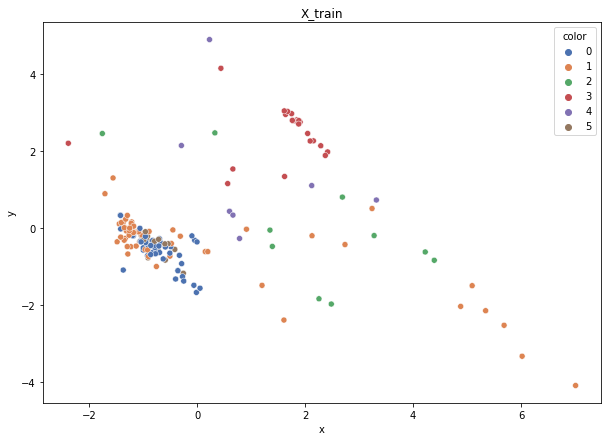

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


100%|██████████| 43/43 [00:00<00:00, 2029.81it/s]


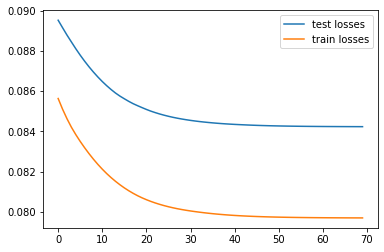

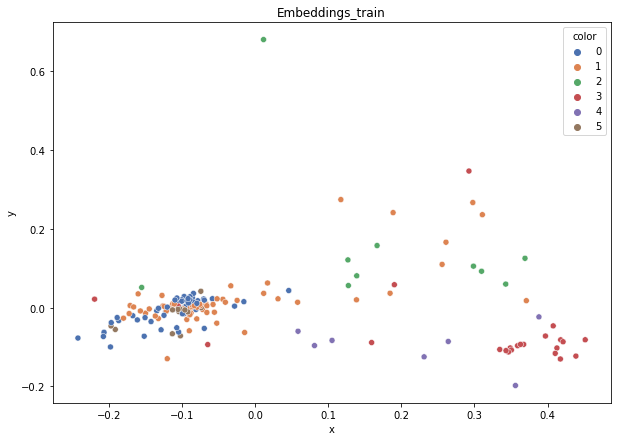

DT-f1-new-features: 0.574
DT-f1-old+new-features: 0.594
DT-f1-old-features: 0.607
DT-gmean-new-features: 0.563
DT-gmean-old+new-features: 0.247
DT-gmean-old-features: 0.25
KNN-f1-new-features: 0.739
KNN-f1-old+new-features: 0.654
KNN-f1-old-features: 0.654
KNN-gmean-new-features: 0.725
KNN-gmean-old+new-features: 0.249
KNN-gmean-old-features: 0.249
RF24-f1-new-features: 0.688
RF24-f1-old+new-features: 0.685
RF24-f1-old-features: 0.731
RF24-gmean-new-features: 0.269
RF24-gmean-old+new-features: 0.274
RF24-gmean-old-features: 0.281


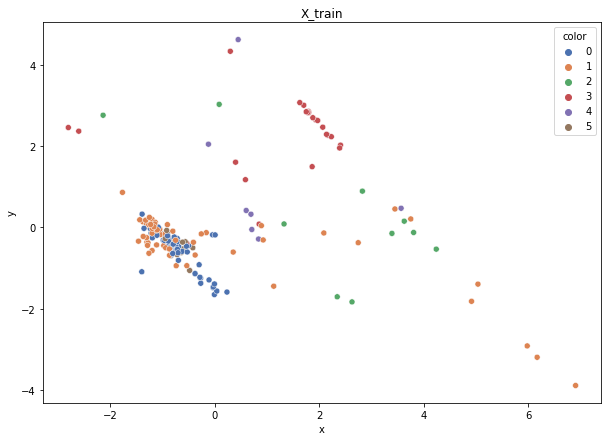

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


100%|██████████| 43/43 [00:00<00:00, 2708.16it/s]


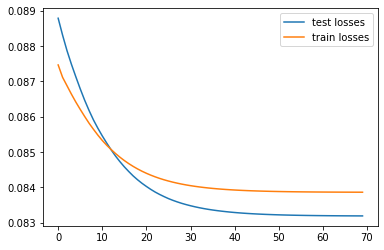

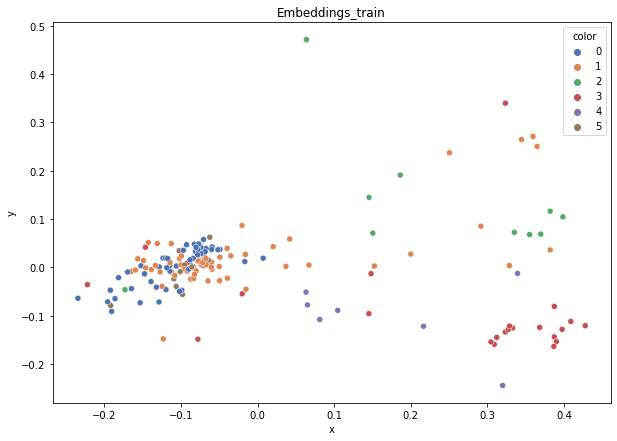

DT-f1-new-features: 0.649
DT-f1-old+new-features: 0.607
DT-f1-old-features: 0.641
DT-gmean-new-features: 0.274
DT-gmean-old+new-features: 0.607
DT-gmean-old-features: 0.681
KNN-f1-new-features: 0.697
KNN-f1-old+new-features: 0.513
KNN-f1-old-features: 0.522
KNN-gmean-new-features: 0.654
KNN-gmean-old+new-features: 0.088
KNN-gmean-old-features: 0.088
RF24-f1-new-features: 0.69
RF24-f1-old+new-features: 0.787
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.642
RF24-gmean-old+new-features: 0.76
RF24-gmean-old-features: 0.748


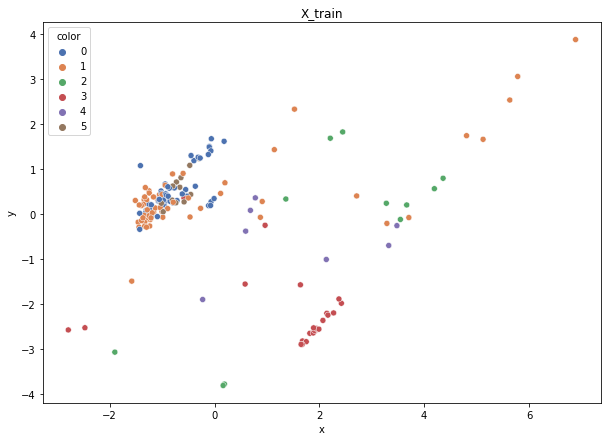

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 11, 4: 7})
Weights: {0: 0.04663368999308034, 5: 0.18653475997232136, 4: 0.3730695199446427, 1: 0.04281125638709015, 3: 0.11354289737445648, 2: 0.237407876328409}


100%|██████████| 42/42 [00:00<00:00, 3040.71it/s]


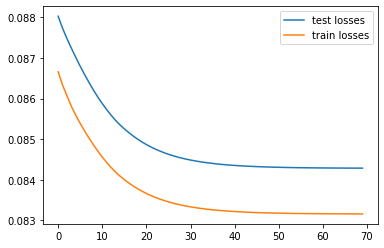

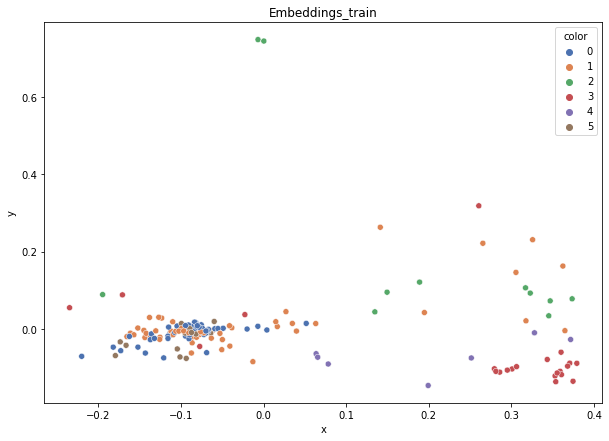

DT-f1-new-features: 0.626
DT-f1-old+new-features: 0.721
DT-f1-old-features: 0.73
DT-gmean-new-features: 0.635
DT-gmean-old+new-features: 0.759
DT-gmean-old-features: 0.737
KNN-f1-new-features: 0.636
KNN-f1-old+new-features: 0.705
KNN-f1-old-features: 0.705
KNN-gmean-new-features: 0.673
KNN-gmean-old+new-features: 0.714
KNN-gmean-old-features: 0.714
RF24-f1-new-features: 0.667
RF24-f1-old+new-features: 0.8
RF24-f1-old-features: 0.857
RF24-gmean-new-features: 0.644
RF24-gmean-old+new-features: 0.839
RF24-gmean-old-features: 0.865
new_ecoli


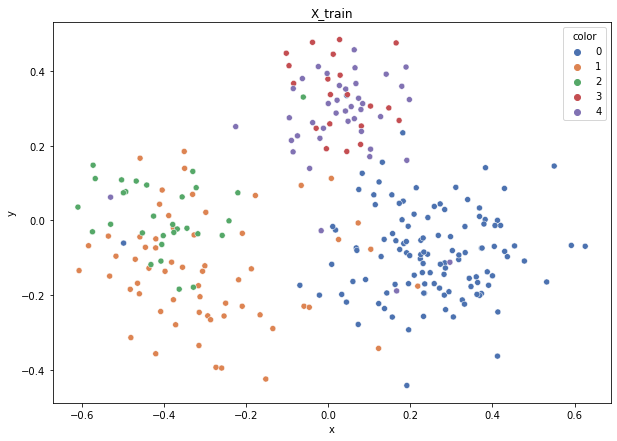

Class cardinalities: Counter({0: 116, 1: 61, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.0649452946471851, 1: 0.1235025275257946, 2: 0.2511218059691157, 3: 0.37668270895367356, 4: 0.183747662904231}


100%|██████████| 68/68 [00:00<00:00, 2066.32it/s]


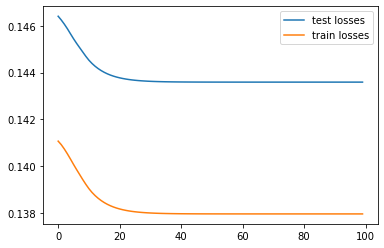

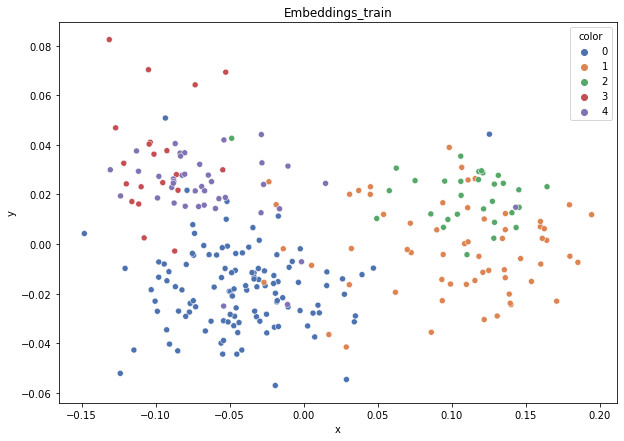

DT-f1-new-features: 0.621
DT-f1-old+new-features: 0.691
DT-f1-old-features: 0.634
DT-gmean-new-features: 0.619
DT-gmean-old+new-features: 0.652
DT-gmean-old-features: 0.537
KNN-f1-new-features: 0.695
KNN-f1-old+new-features: 0.752
KNN-f1-old-features: 0.738
KNN-gmean-new-features: 0.694
KNN-gmean-old+new-features: 0.719
KNN-gmean-old-features: 0.704
RF24-f1-new-features: 0.768
RF24-f1-old+new-features: 0.812
RF24-f1-old-features: 0.812
RF24-gmean-new-features: 0.786
RF24-gmean-old+new-features: 0.808
RF24-gmean-old-features: 0.802


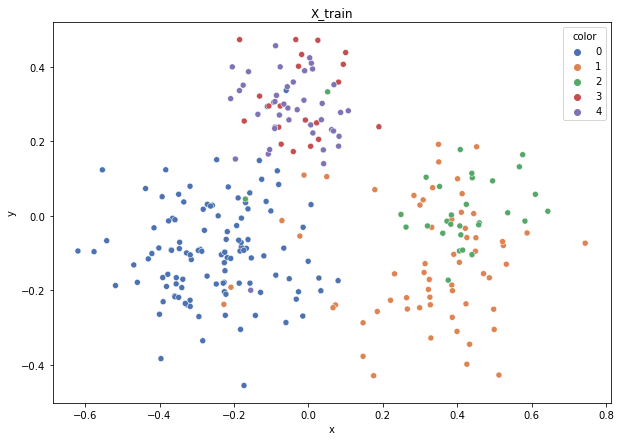

Class cardinalities: Counter({0: 116, 1: 61, 4: 42, 2: 30, 3: 20})
Weights: {0: 0.06523067522150933, 1: 0.12404521845401774, 2: 0.25222527752316937, 3: 0.3783379162847541, 4: 0.18016091251654956}


100%|██████████| 67/67 [00:00<00:00, 2314.78it/s]


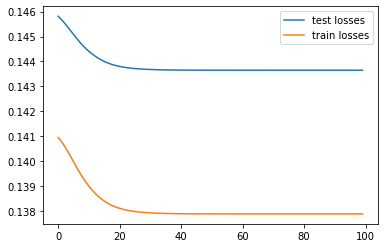

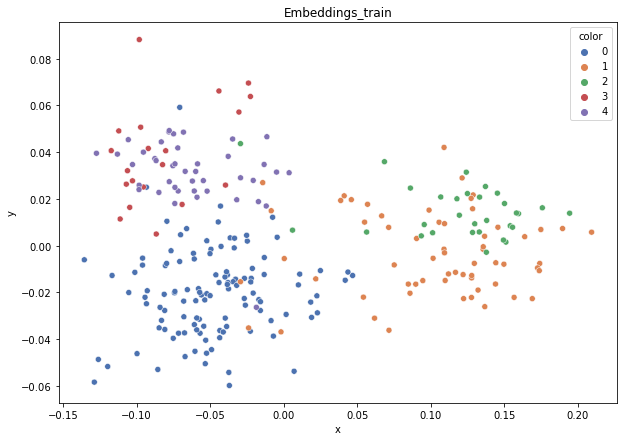

DT-f1-new-features: 0.649
DT-f1-old+new-features: 0.779
DT-f1-old-features: 0.707
DT-gmean-new-features: 0.639
DT-gmean-old+new-features: 0.758
DT-gmean-old-features: 0.688
KNN-f1-new-features: 0.708
KNN-f1-old+new-features: 0.666
KNN-f1-old-features: 0.666
KNN-gmean-new-features: 0.678
KNN-gmean-old+new-features: 0.644
KNN-gmean-old-features: 0.644
RF24-f1-new-features: 0.735
RF24-f1-old+new-features: 0.845
RF24-f1-old-features: 0.841
RF24-gmean-new-features: 0.709
RF24-gmean-old+new-features: 0.815
RF24-gmean-old-features: 0.829


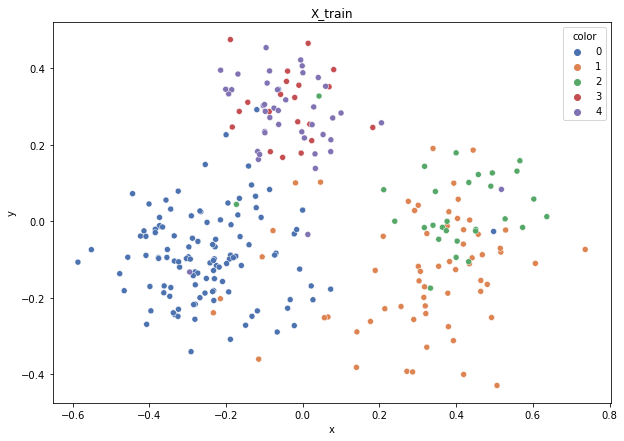

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


100%|██████████| 67/67 [00:00<00:00, 2791.43it/s]


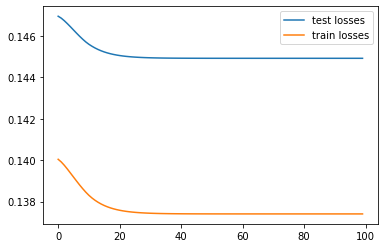

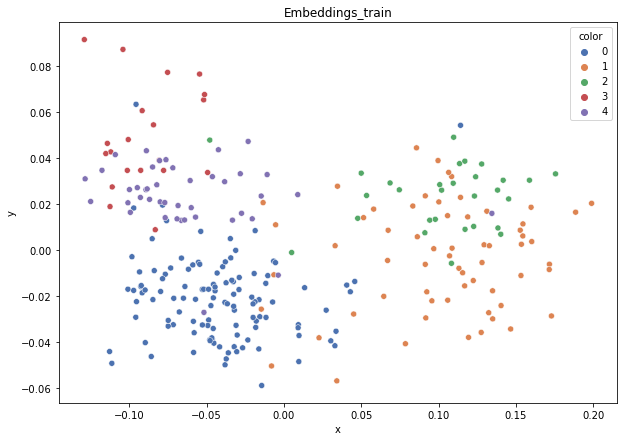

DT-f1-new-features: 0.786
DT-f1-old+new-features: 0.815
DT-f1-old-features: 0.775
DT-gmean-new-features: 0.779
DT-gmean-old+new-features: 0.851
DT-gmean-old-features: 0.765
KNN-f1-new-features: 0.754
KNN-f1-old+new-features: 0.862
KNN-f1-old-features: 0.862
KNN-gmean-new-features: 0.713
KNN-gmean-old+new-features: 0.815
KNN-gmean-old-features: 0.815
RF24-f1-new-features: 0.836
RF24-f1-old+new-features: 0.903
RF24-f1-old-features: 0.879
RF24-gmean-new-features: 0.84
RF24-gmean-old+new-features: 0.892
RF24-gmean-old-features: 0.846


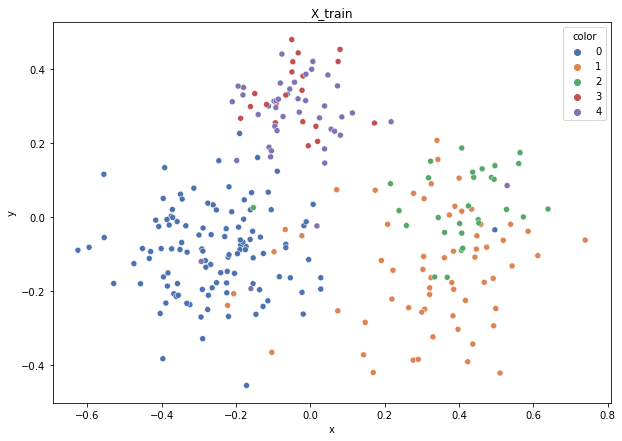

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


100%|██████████| 67/67 [00:00<00:00, 3003.30it/s]


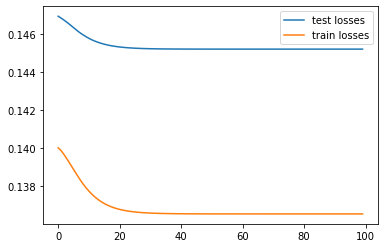

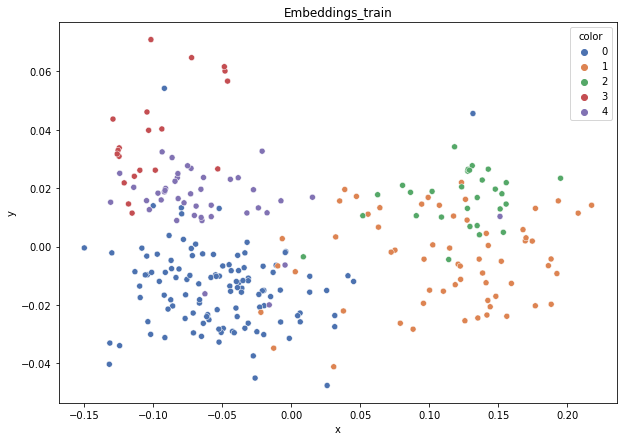

DT-f1-new-features: 0.778
DT-f1-old+new-features: 0.617
DT-f1-old-features: 0.649
DT-gmean-new-features: 0.78
DT-gmean-old+new-features: 0.572
DT-gmean-old-features: 0.606
KNN-f1-new-features: 0.642
KNN-f1-old+new-features: 0.736
KNN-f1-old-features: 0.736
KNN-gmean-new-features: 0.596
KNN-gmean-old+new-features: 0.705
KNN-gmean-old-features: 0.705
RF24-f1-new-features: 0.711
RF24-f1-old+new-features: 0.749
RF24-f1-old-features: 0.767
RF24-gmean-new-features: 0.705
RF24-gmean-old+new-features: 0.723
RF24-gmean-old-features: 0.719


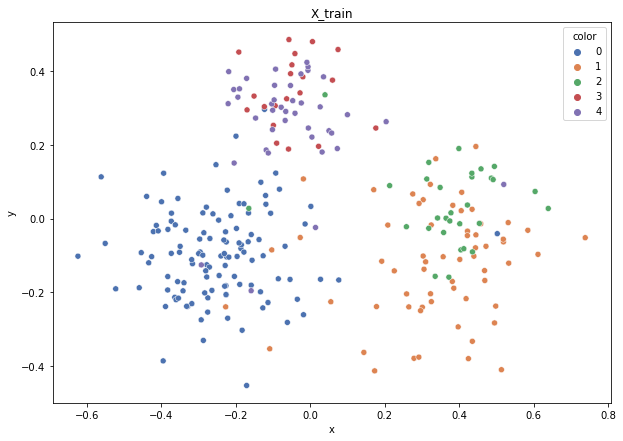

Class cardinalities: Counter({0: 116, 1: 62, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.06507492234699798, 1: 0.12175308052018977, 2: 0.25162303307505884, 3: 0.3774345496125883, 4: 0.18411441444516502}


100%|██████████| 67/67 [00:00<00:00, 2680.12it/s]


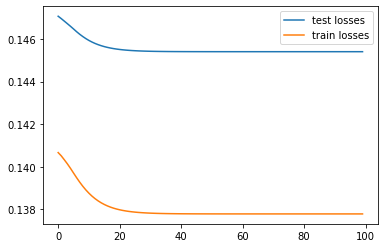

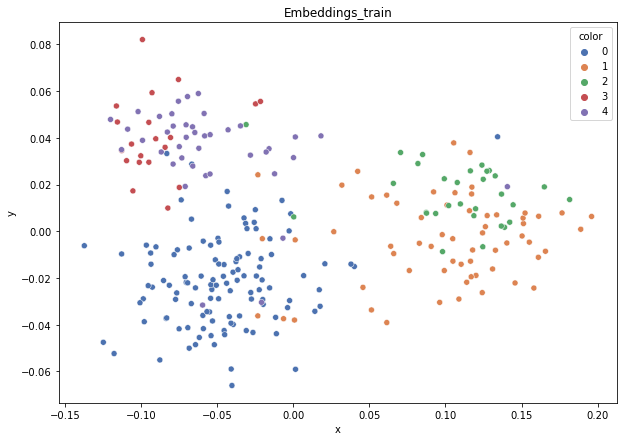

DT-f1-new-features: 0.704
DT-f1-old+new-features: 0.762
DT-f1-old-features: 0.775
DT-gmean-new-features: 0.739
DT-gmean-old+new-features: 0.79
DT-gmean-old-features: 0.807
KNN-f1-new-features: 0.854
KNN-f1-old+new-features: 0.843
KNN-f1-old-features: 0.843
KNN-gmean-new-features: 0.843
KNN-gmean-old+new-features: 0.858
KNN-gmean-old-features: 0.858
RF24-f1-new-features: 0.832
RF24-f1-old+new-features: 0.904
RF24-f1-old-features: 0.887
RF24-gmean-new-features: 0.831
RF24-gmean-old+new-features: 0.902
RF24-gmean-old-features: 0.876
new_led7digit


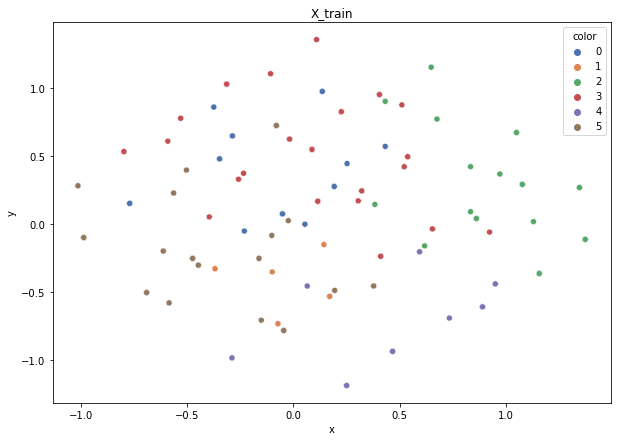

Class cardinalities: Counter({3: 87, 5: 79, 0: 78, 2: 75, 4: 41, 1: 40})
Weights: {0: 0.12859532399632337, 2: 0.1337391369561763, 3: 0.11529235944497956, 4: 0.24464476272471275, 5: 0.1269675350849775, 1: 0.25076088179283057}


100%|██████████| 100/100 [00:00<00:00, 2202.39it/s]


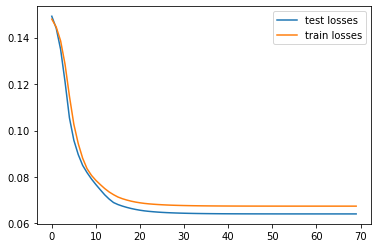

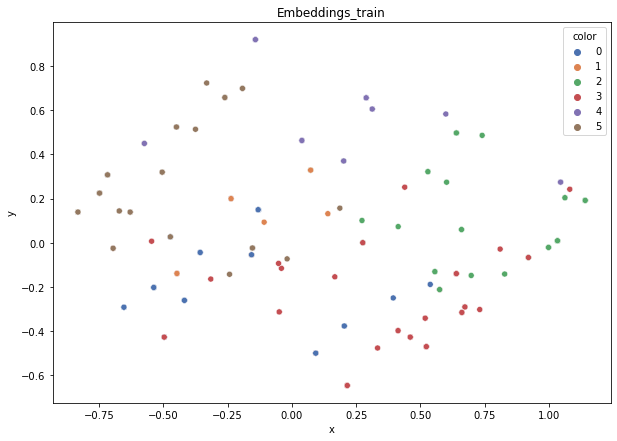

DT-f1-new-features: 0.774
DT-f1-old+new-features: 0.793
DT-f1-old-features: 0.789
DT-gmean-new-features: 0.776
DT-gmean-old+new-features: 0.806
DT-gmean-old-features: 0.797
KNN-f1-new-features: 0.693
KNN-f1-old+new-features: 0.782
KNN-f1-old-features: 0.674
KNN-gmean-new-features: 0.682
KNN-gmean-old+new-features: 0.776
KNN-gmean-old-features: 0.658
RF24-f1-new-features: 0.751
RF24-f1-old+new-features: 0.78
RF24-f1-old-features: 0.796
RF24-gmean-new-features: 0.738
RF24-gmean-old+new-features: 0.781
RF24-gmean-old-features: 0.797


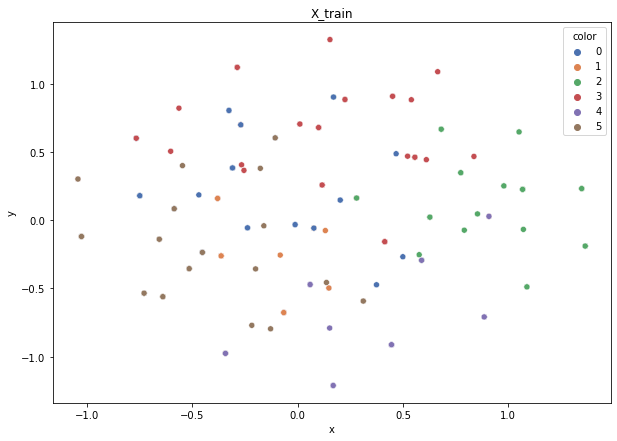

Class cardinalities: Counter({3: 87, 5: 80, 0: 78, 2: 75, 4: 41, 1: 39})
Weights: {0: 0.1279755802357915, 2: 0.13309460344522317, 3: 0.114736727107951, 4: 0.2434657380095546, 5: 0.12477619072989674, 1: 0.255951160471583}


100%|██████████| 100/100 [00:00<00:00, 2491.69it/s]


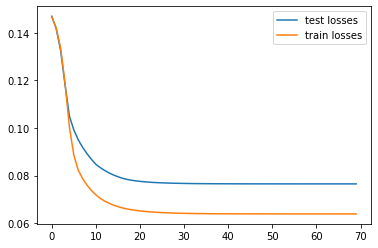

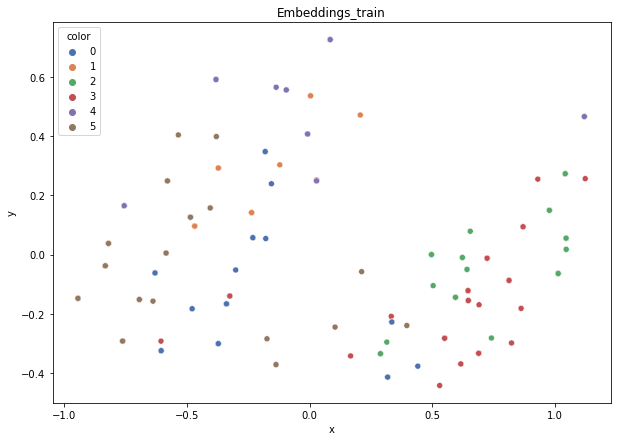

DT-f1-new-features: 0.725
DT-f1-old+new-features: 0.724
DT-f1-old-features: 0.779
DT-gmean-new-features: 0.697
DT-gmean-old+new-features: 0.697
DT-gmean-old-features: 0.755
KNN-f1-new-features: 0.67
KNN-f1-old+new-features: 0.736
KNN-f1-old-features: 0.592
KNN-gmean-new-features: 0.561
KNN-gmean-old+new-features: 0.706
KNN-gmean-old-features: 0.236
RF24-f1-new-features: 0.732
RF24-f1-old+new-features: 0.73
RF24-f1-old-features: 0.767
RF24-gmean-new-features: 0.691
RF24-gmean-old+new-features: 0.691
RF24-gmean-old-features: 0.735


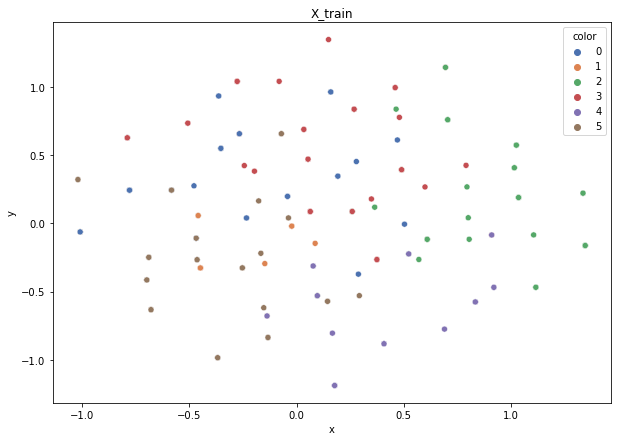

Class cardinalities: Counter({3: 86, 5: 79, 0: 78, 2: 76, 4: 42, 1: 39})
Weights: {0: 0.12857143873483481, 2: 0.1319548976489094, 3: 0.11661130489903622, 4: 0.23877552907897892, 5: 0.12694395216857107, 1: 0.25714287746966963}


100%|██████████| 100/100 [00:00<00:00, 2675.89it/s]


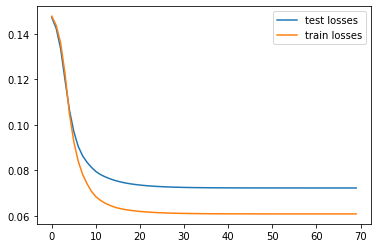

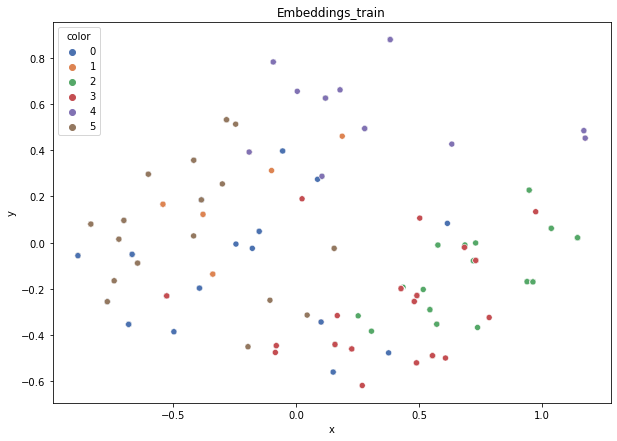

DT-f1-new-features: 0.774
DT-f1-old+new-features: 0.774
DT-f1-old-features: 0.782
DT-gmean-new-features: 0.776
DT-gmean-old+new-features: 0.776
DT-gmean-old-features: 0.783
KNN-f1-new-features: 0.7
KNN-f1-old+new-features: 0.767
KNN-f1-old-features: 0.768
KNN-gmean-new-features: 0.679
KNN-gmean-old+new-features: 0.762
KNN-gmean-old-features: 0.743
RF24-f1-new-features: 0.775
RF24-f1-old+new-features: 0.785
RF24-f1-old-features: 0.793
RF24-gmean-new-features: 0.776
RF24-gmean-old+new-features: 0.785
RF24-gmean-old-features: 0.793


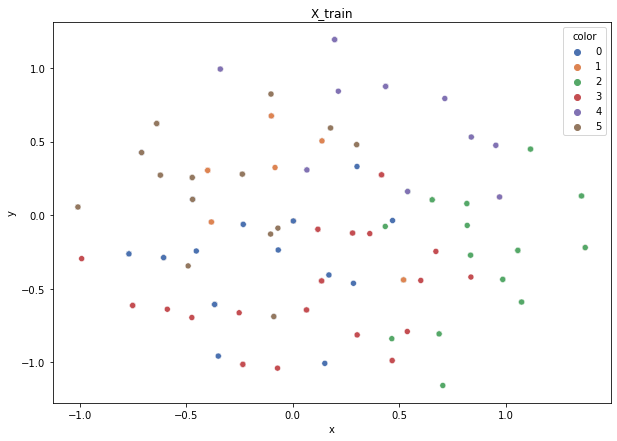

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


100%|██████████| 100/100 [00:00<00:00, 2857.60it/s]


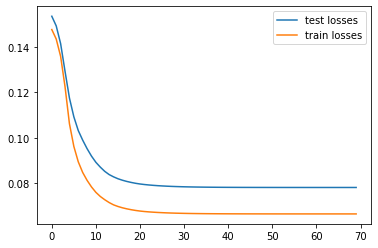

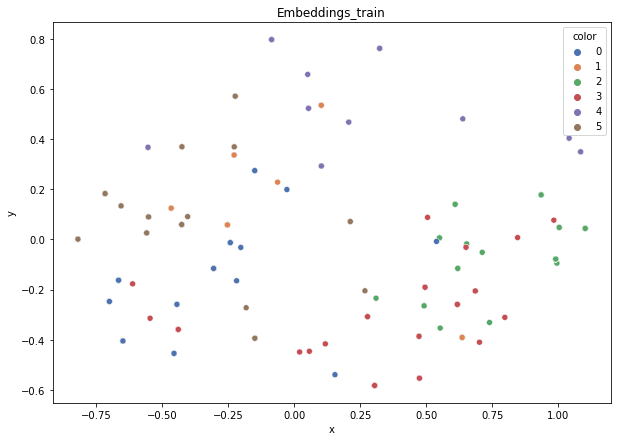

DT-f1-new-features: 0.732
DT-f1-old+new-features: 0.747
DT-f1-old-features: 0.716
DT-gmean-new-features: 0.719
DT-gmean-old+new-features: 0.739
DT-gmean-old-features: 0.698
KNN-f1-new-features: 0.735
KNN-f1-old+new-features: 0.594
KNN-f1-old-features: 0.615
KNN-gmean-new-features: 0.731
KNN-gmean-old+new-features: 0.52
KNN-gmean-old-features: 0.57
RF24-f1-new-features: 0.726
RF24-f1-old+new-features: 0.75
RF24-f1-old-features: 0.763
RF24-gmean-new-features: 0.705
RF24-gmean-old+new-features: 0.726
RF24-gmean-old-features: 0.751


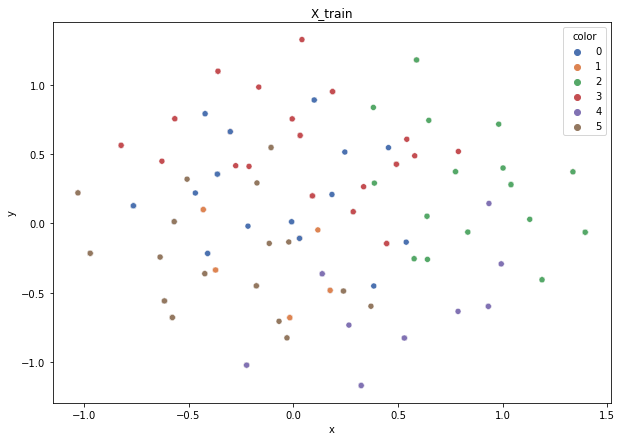

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


100%|██████████| 100/100 [00:00<00:00, 2919.60it/s]


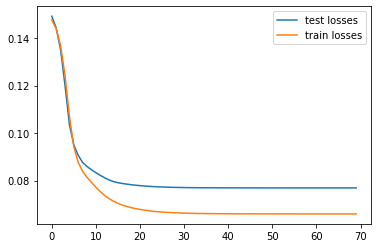

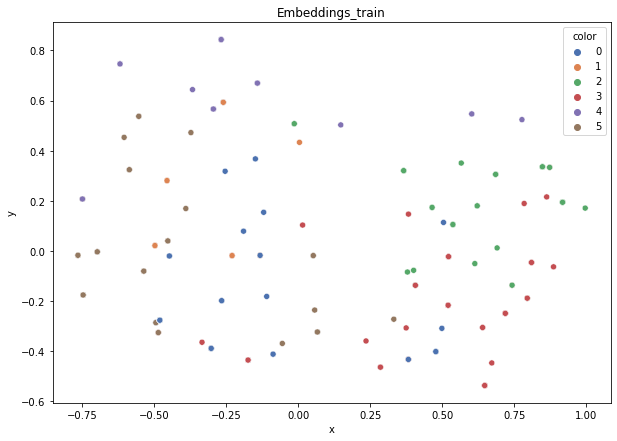

DT-f1-new-features: 0.784
DT-f1-old+new-features: 0.793
DT-f1-old-features: 0.802
DT-gmean-new-features: 0.788
DT-gmean-old+new-features: 0.797
DT-gmean-old-features: 0.806
KNN-f1-new-features: 0.749
KNN-f1-old+new-features: 0.832
KNN-f1-old-features: 0.718
KNN-gmean-new-features: 0.738
KNN-gmean-old+new-features: 0.84
KNN-gmean-old-features: 0.719
RF24-f1-new-features: 0.789
RF24-f1-old+new-features: 0.802
RF24-f1-old-features: 0.802
RF24-gmean-new-features: 0.788
RF24-gmean-old+new-features: 0.806
RF24-gmean-old-features: 0.806
new_winequality-red


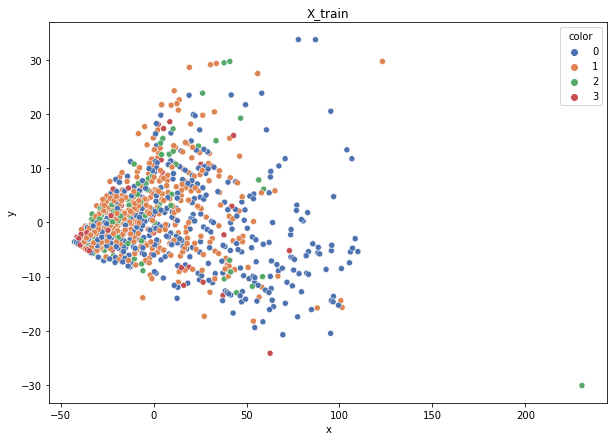

Class cardinalities: Counter({0: 544, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07217510080141348, 1: 0.07683611513888246, 2: 0.246938709660182, 3: 0.6040500743995221}


100%|██████████| 320/320 [00:00<00:00, 2814.48it/s]


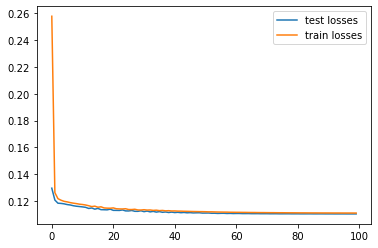

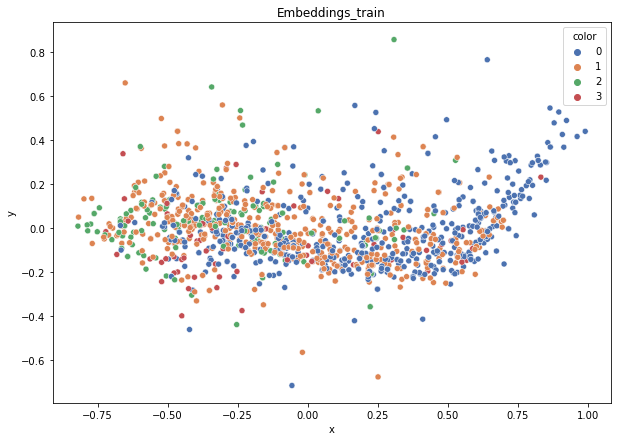

DT-f1-new-features: 0.496
DT-f1-old+new-features: 0.541
DT-f1-old-features: 0.52
DT-gmean-new-features: 0.487
DT-gmean-old+new-features: 0.503
DT-gmean-old-features: 0.438
KNN-f1-new-features: 0.493
KNN-f1-old+new-features: 0.453
KNN-f1-old-features: 0.453
KNN-gmean-new-features: 0.441
KNN-gmean-old+new-features: 0.337
KNN-gmean-old-features: 0.337
RF24-f1-new-features: 0.525
RF24-f1-old+new-features: 0.574
RF24-f1-old-features: 0.584
RF24-gmean-new-features: 0.369
RF24-gmean-old+new-features: 0.397
RF24-gmean-old-features: 0.403


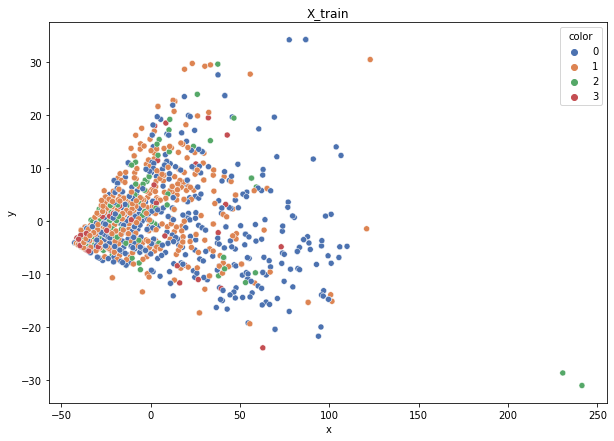

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


100%|██████████| 320/320 [00:00<00:00, 3099.59it/s]


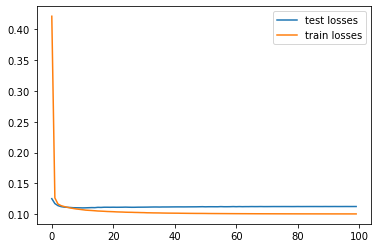

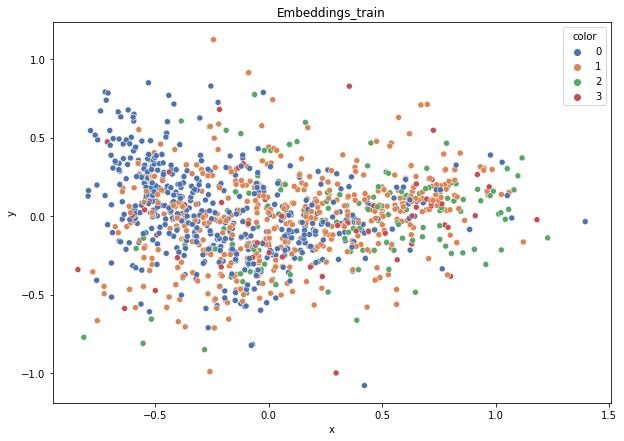

DT-f1-new-features: 0.373
DT-f1-old+new-features: 0.514
DT-f1-old-features: 0.503
DT-gmean-new-features: 0.296
DT-gmean-old+new-features: 0.503
DT-gmean-old-features: 0.479
KNN-f1-new-features: 0.469
KNN-f1-old+new-features: 0.486
KNN-f1-old-features: 0.486
KNN-gmean-new-features: 0.339
KNN-gmean-old+new-features: 0.431
KNN-gmean-old-features: 0.431
RF24-f1-new-features: 0.472
RF24-f1-old+new-features: 0.577
RF24-f1-old-features: 0.556
RF24-gmean-new-features: 0.337
RF24-gmean-old+new-features: 0.453
RF24-gmean-old-features: 0.435


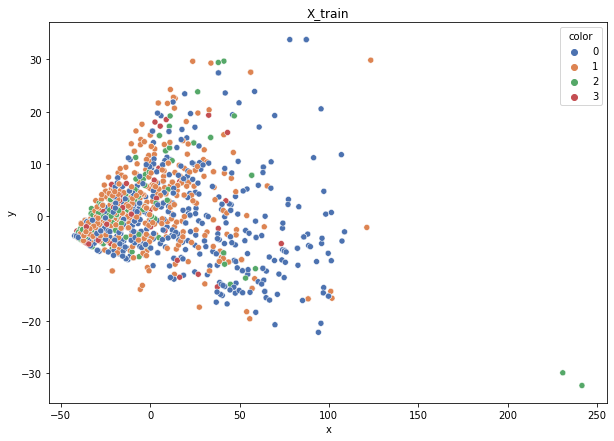

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


100%|██████████| 320/320 [00:00<00:00, 2778.01it/s]


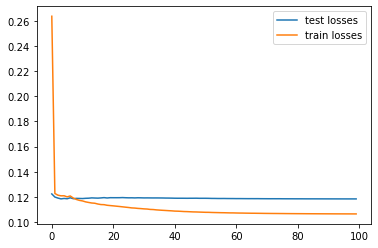

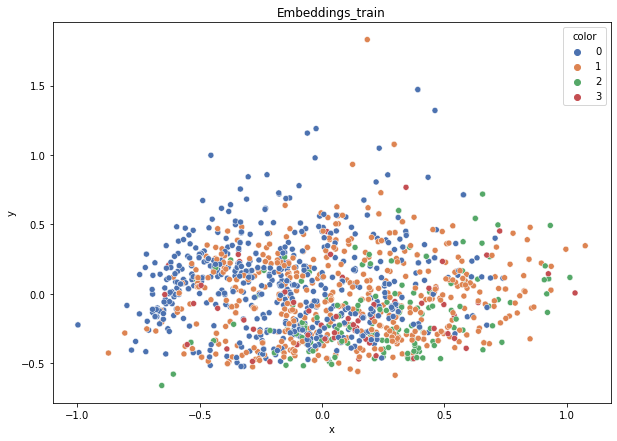

DT-f1-new-features: 0.37
DT-f1-old+new-features: 0.486
DT-f1-old-features: 0.512
DT-gmean-new-features: 0.29
DT-gmean-old+new-features: 0.453
DT-gmean-old-features: 0.467
KNN-f1-new-features: 0.5
KNN-f1-old+new-features: 0.491
KNN-f1-old-features: 0.488
KNN-gmean-new-features: 0.419
KNN-gmean-old+new-features: 0.416
KNN-gmean-old-features: 0.415
RF24-f1-new-features: 0.472
RF24-f1-old+new-features: 0.509
RF24-f1-old-features: 0.512
RF24-gmean-new-features: 0.343
RF24-gmean-old+new-features: 0.136
RF24-gmean-old-features: 0.137


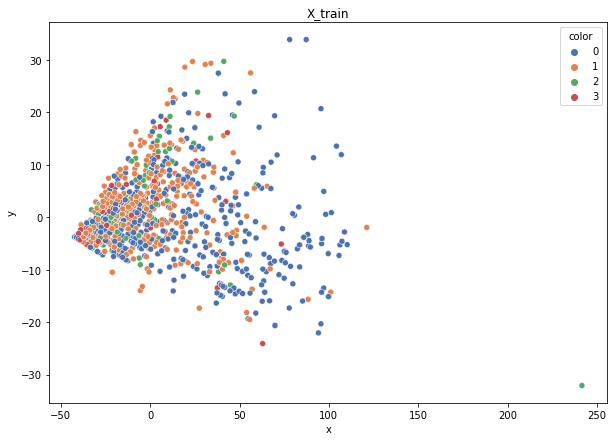

Class cardinalities: Counter({0: 545, 1: 510, 2: 160, 3: 64})
Weights: {0: 0.07147706120661339, 2: 0.24346873973502686, 3: 0.6086718493375671, 1: 0.07638234972079273}


100%|██████████| 320/320 [00:00<00:00, 3203.90it/s]


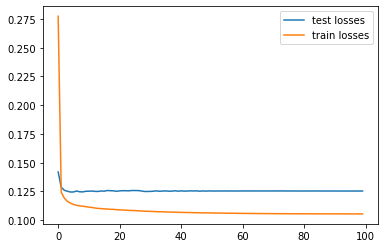

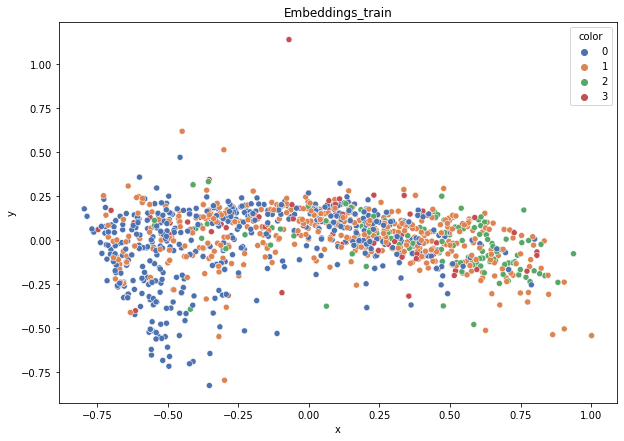

DT-f1-new-features: 0.356
DT-f1-old+new-features: 0.427
DT-f1-old-features: 0.434
DT-gmean-new-features: 0.344
DT-gmean-old+new-features: 0.379
DT-gmean-old-features: 0.398
KNN-f1-new-features: 0.44
KNN-f1-old+new-features: 0.468
KNN-f1-old-features: 0.461
KNN-gmean-new-features: 0.407
KNN-gmean-old+new-features: 0.429
KNN-gmean-old-features: 0.422
RF24-f1-new-features: 0.435
RF24-f1-old+new-features: 0.528
RF24-f1-old-features: 0.511
RF24-gmean-new-features: 0.375
RF24-gmean-old+new-features: 0.402
RF24-gmean-old-features: 0.4


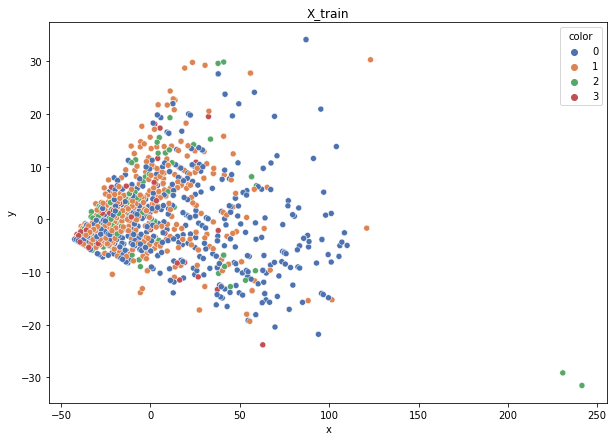

Class cardinalities: Counter({0: 545, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07205221139741194, 1: 0.07684629199919668, 2: 0.24697141642509127, 3: 0.6041300801783002}


100%|██████████| 319/319 [00:00<00:00, 2594.57it/s]


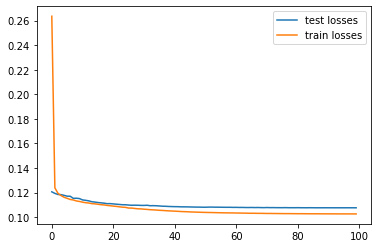

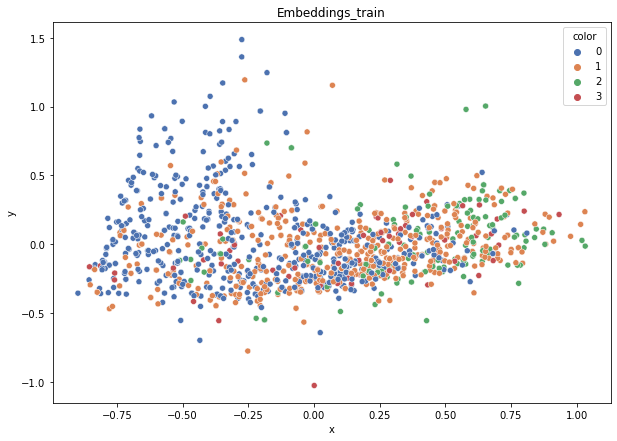

DT-f1-new-features: 0.459
DT-f1-old+new-features: 0.471
DT-f1-old-features: 0.461
DT-gmean-new-features: 0.391
DT-gmean-old+new-features: 0.401
DT-gmean-old-features: 0.398
KNN-f1-new-features: 0.502
KNN-f1-old+new-features: 0.507
KNN-f1-old-features: 0.507
KNN-gmean-new-features: 0.444
KNN-gmean-old+new-features: 0.415
KNN-gmean-old-features: 0.415
RF24-f1-new-features: 0.522
RF24-f1-old+new-features: 0.63
RF24-f1-old-features: 0.614
RF24-gmean-new-features: 0.45
RF24-gmean-old+new-features: 0.551
RF24-gmean-old-features: 0.479
thyroid-newthyroid


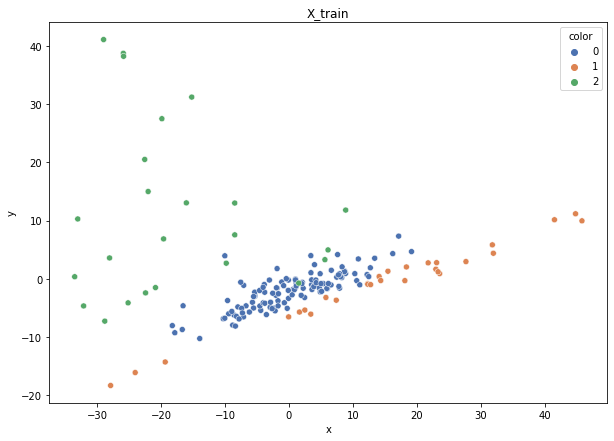

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 2131.15it/s]


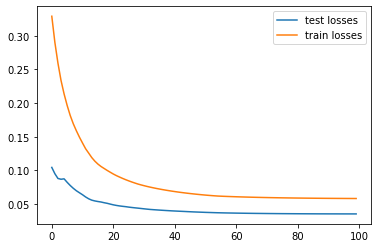

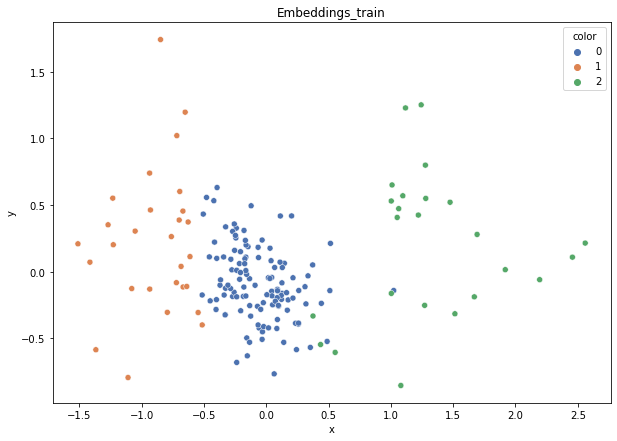

DT-f1-new-features: 1.0
DT-f1-old+new-features: 0.936
DT-f1-old-features: 0.902
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 0.93
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.964
KNN-f1-old+new-features: 0.933
KNN-f1-old-features: 0.933
KNN-gmean-new-features: 0.941
KNN-gmean-old+new-features: 0.93
KNN-gmean-old-features: 0.93
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 0.964
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 0.941
RF24-gmean-old-features: 0.894


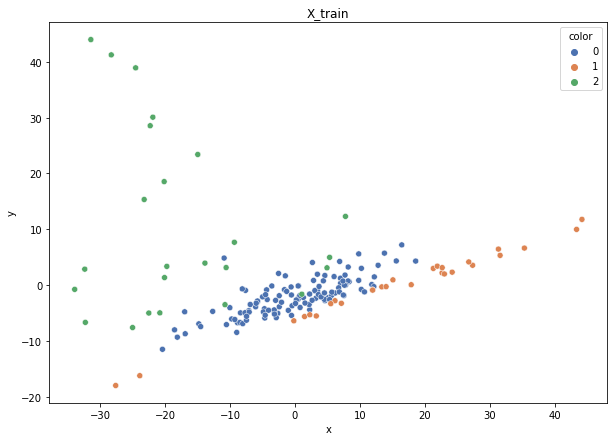

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 2085.80it/s]


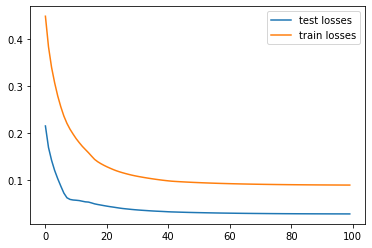

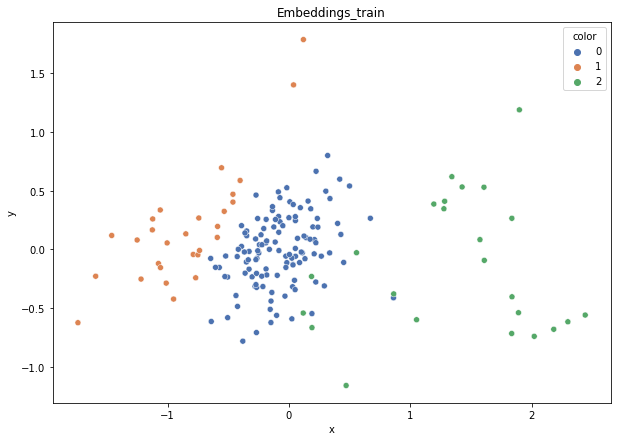

DT-f1-new-features: 1.0
DT-f1-old+new-features: 0.972
DT-f1-old-features: 0.947
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 0.989
DT-gmean-old-features: 0.977
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 1.0
KNN-f1-old-features: 1.0
KNN-gmean-new-features: 0.989
KNN-gmean-old+new-features: 1.0
KNN-gmean-old-features: 1.0
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 0.95


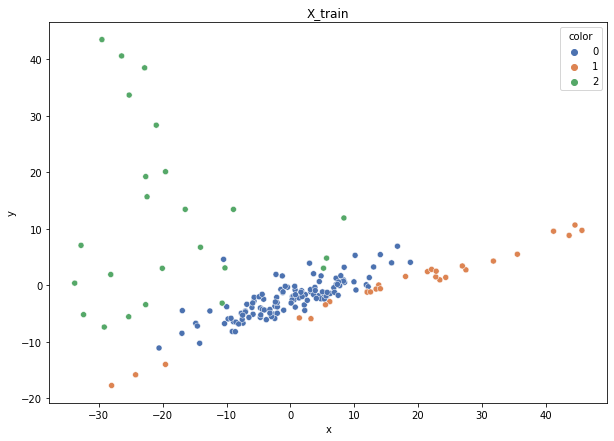

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 2580.33it/s]


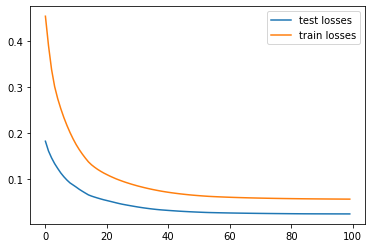

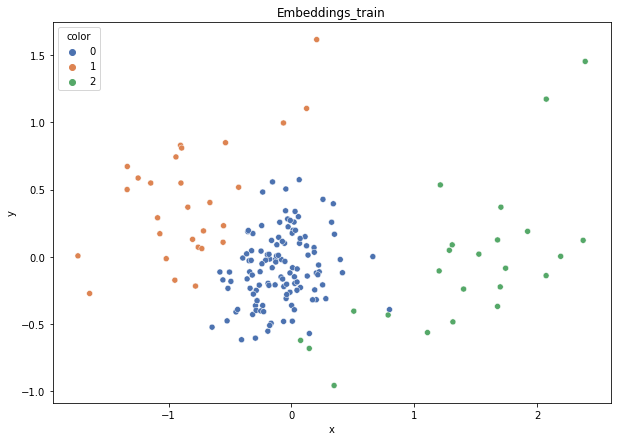

DT-f1-new-features: 0.936
DT-f1-old+new-features: 0.905
DT-f1-old-features: 0.905
DT-gmean-new-features: 0.93
DT-gmean-old+new-features: 0.92
DT-gmean-old-features: 0.92
KNN-f1-new-features: 0.933
KNN-f1-old+new-features: 0.862
KNN-f1-old-features: 0.862
KNN-gmean-new-features: 0.93
KNN-gmean-old+new-features: 0.821
KNN-gmean-old-features: 0.821
RF24-f1-new-features: 0.905
RF24-f1-old+new-features: 0.936
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.92
RF24-gmean-old+new-features: 0.93
RF24-gmean-old-features: 0.894


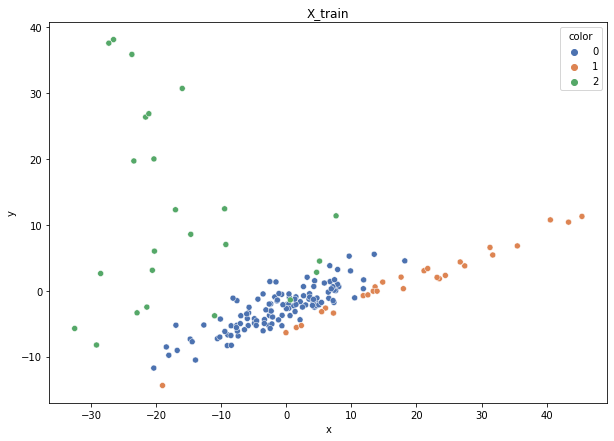

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 2057.88it/s]


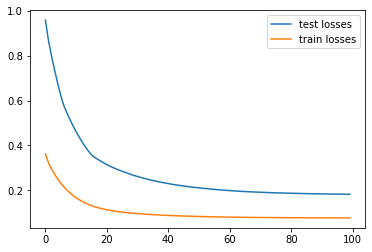

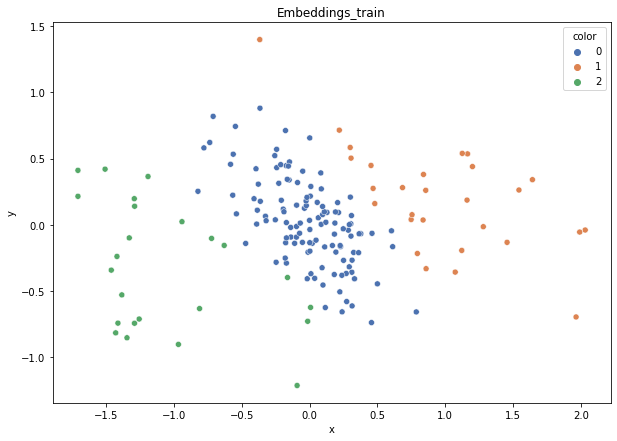

DT-f1-new-features: 0.941
DT-f1-old+new-features: 0.933
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.977
DT-gmean-old+new-features: 0.93
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.941
KNN-f1-old+new-features: 0.906
KNN-f1-old-features: 0.906
KNN-gmean-new-features: 0.977
KNN-gmean-old+new-features: 0.92
KNN-gmean-old-features: 0.92
RF24-f1-new-features: 0.902
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 0.902
RF24-gmean-new-features: 0.884
RF24-gmean-old+new-features: 0.95
RF24-gmean-old-features: 0.884


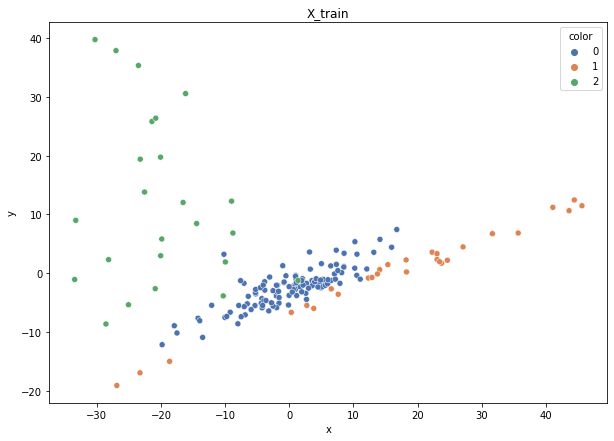

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 2663.72it/s]


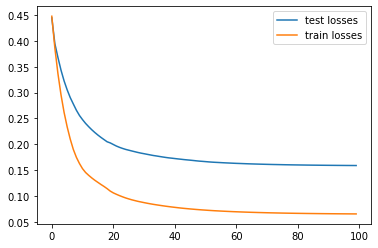

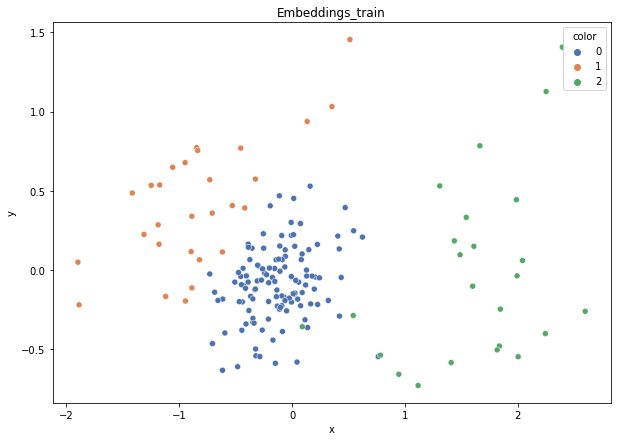

DT-f1-new-features: 0.772
DT-f1-old+new-features: 0.913
DT-f1-old-features: 0.893
DT-gmean-new-features: 0.757
DT-gmean-old+new-features: 0.965
DT-gmean-old-features: 0.864
KNN-f1-new-features: 0.873
KNN-f1-old+new-features: 0.873
KNN-f1-old-features: 0.873
KNN-gmean-new-features: 0.794
KNN-gmean-old+new-features: 0.794
KNN-gmean-old-features: 0.794
RF24-f1-new-features: 0.817
RF24-f1-old+new-features: 0.845
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.776
RF24-gmean-old+new-features: 0.785
RF24-gmean-old-features: 0.874


In [10]:
result_dict = defaultdict(list)

if test_all_ds:
    ds_names = dt_name_to_cols_to_encode.keys()
else:
    ds_names = [ds_name]
for dataset_name in ds_names:
# for dataset_name in list(datasets.keys()):
    print(dataset_name)
    result_dict["dataset"].append(dataset_name)
    fold_result_dict = defaultdict(list)

    X, y = datasets[dataset_name]['data'], datasets[dataset_name]['target']
    X_encoded, y = datasets[f"{dataset_name}_encoded"]['data'], datasets[f"{dataset_name}_encoded"]['target']
    
    skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
    n_splits = skf.get_n_splits(X, y)
    
    folds = []
    if test_on_all_folds:
        folds = skf.split(X, y)
    else:
        folds = list(skf.split(X, y))[1:2]
        
    for train_index, test_index in folds:
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        
        X_train_enc, X_test_enc = X_encoded[train_index], X_encoded[test_index]
        
        # PCA X_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(X_train), y_train)
        plt.title("X_train")
        plt.show()
        
        weights = ex.weights_calculation_strategy1(X_train, y_train)
        cfg =  config[dataset_name]
        # pretrain ANN triplets
        embeddings_train, embeddings_test = ex.train_triplets(X_train_enc, y_train, X_test_enc, y_test, weights,cfg)
        
        # PCA embeddings_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(embeddings_train), y_train)
        plt.title("Embeddings_train")
        plt.show()
        
        X_train_new = np.hstack([X_train, embeddings_train])
        X_test_new = np.hstack([X_test, embeddings_test])
        
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train, y_train)
            preds = clf.predict(X_test)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_new, y_train)
            preds = clf.predict(X_test_new)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old+new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old+new-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(embeddings_train, y_train)
            preds = clf.predict(embeddings_test)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-new-features"].append(gmean)
        for key in sorted(list(fold_result_dict.keys())):
            print(f"{key}: {np.round(fold_result_dict[key][-1],3)}")
            
    for k in fold_result_dict:
        result_dict[k].append(np.mean(fold_result_dict[k]))

In [11]:
results_df = pd.DataFrame.from_dict(result_dict)

In [12]:
results_df

,dataset,RF24-f1-old-features,RF24-gmean-old-features,DT-f1-old-features,DT-gmean-old-features,KNN-f1-old-features,KNN-gmean-old-features,RF24-f1-old+new-features,RF24-gmean-old+new-features,DT-f1-old+new-features,DT-gmean-old+new-features,KNN-f1-old+new-features,KNN-gmean-old+new-features,RF24-f1-new-features,RF24-gmean-new-features,DT-f1-new-features,DT-gmean-new-features,KNN-f1-new-features,KNN-gmean-new-features
0,cmc,0.516400,0.514937,0.467943,0.470938,0.450639,0.442843,0.522812,0.515638,0.444379,0.441531,0.435626,0.425296,0.469267,0.461556,0.408544,0.410519,0.420329,0.410164
1,dermatology,0.964200,0.962295,0.949703,0.951222,0.874814,0.864271,0.969314,0.964939,0.920078,0.909164,0.873159,0.863504,0.603679,0.528222,0.559375,0.463393,0.583187,0.512387
2,hayes-roth,0.852497,0.841131,0.851208,0.838449,0.703130,0.662881,0.857543,0.843277,0.833016,0.819526,0.851474,0.838423,0.862633,0.848258,0.852821,0.839385,0.872642,0.862796
3,new_vehicle,0.958741,0.963324,0.897836,0.899298,0.873858,0.877222,0.960152,0.967005,0.921032,0.928282,0.873858,0.877222,0.925563,0.934126,0.903402,0.910857,0.908015,0.908192
4,new_yeast,0.562634,0.338190,0.443761,0.284857,0.491575,0.333038,0.550432,0.336523,0.442366,0.357118,0.451474,0.277750,0.404787,0.242735,0.339644,0.226227,0.349641,0.210804
5,1czysty-cut,0.934189,0.938694,0.935490,0.936512,0.946263,0.946186,0.946784,0.954012,0.923624,0.920671,0.946263,0.946186,0.920118,0.924845,0.910601,0.916866,0.924028,0.933861
6,2delikatne-cut,0.761136,0.756883,0.724198,0.737376,0.699865,0.678350,0.778083,0.769156,0.731153,0.736149,0.699865,0.678350,0.777855,0.772328,0.739141,0.753585,0.710165,0.696171
7,3mocniej-cut,0.560931,0.519703,0.504810,0.502048,0.507431,0.457254,0.566690,0.514705,0.533035,0.526489,0.504753,0.452464,0.567139,0.515366,0.501010,0.492377,0.489913,0.422630
8,4delikatne-bezover-cut,0.820201,0.835313,0.796105,0.813035,0.769472,0.763740,0.834144,0.838320,0.802222,0.823274,0.769472,0.763740,0.812957,0.825395,0.770367,0.785362,0.756799,0.741433
9,balance-scale,0.594609,0.092416,0.605016,0.416495,0.567141,0.089341,0.657409,0.508961,0.616572,0.503820,0.561606,0.089358,0.657182,0.558015,0.631549,0.559427,0.636491,0.496102


In [13]:
results_df.filter(regex=("dataset|RF24-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-f1-old-features,RF24-f1-old+new-features,RF24-f1-new-features
0,cmc,0.516400,0.522812,0.469267
1,dermatology,0.964200,0.969314,0.603679
2,hayes-roth,0.852497,0.857543,0.862633
3,new_vehicle,0.958741,0.960152,0.925563
4,new_yeast,0.562634,0.550432,0.404787
5,1czysty-cut,0.934189,0.946784,0.920118
6,2delikatne-cut,0.761136,0.778083,0.777855
7,3mocniej-cut,0.560931,0.566690,0.567139
8,4delikatne-bezover-cut,0.820201,0.834144,0.812957
9,balance-scale,0.594609,0.657409,0.657182


In [14]:
results_df.filter(regex=("dataset|RF24-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-gmean-old-features,RF24-gmean-old+new-features,RF24-gmean-new-features
0,cmc,0.514937,0.515638,0.461556
1,dermatology,0.962295,0.964939,0.528222
2,hayes-roth,0.841131,0.843277,0.848258
3,new_vehicle,0.963324,0.967005,0.934126
4,new_yeast,0.338190,0.336523,0.242735
5,1czysty-cut,0.938694,0.954012,0.924845
6,2delikatne-cut,0.756883,0.769156,0.772328
7,3mocniej-cut,0.519703,0.514705,0.515366
8,4delikatne-bezover-cut,0.835313,0.838320,0.825395
9,balance-scale,0.092416,0.508961,0.558015


In [15]:
results_df.filter(regex=("dataset|DT-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-f1-old-features,DT-f1-old+new-features,DT-f1-new-features
0,cmc,0.467943,0.444379,0.408544
1,dermatology,0.949703,0.920078,0.559375
2,hayes-roth,0.851208,0.833016,0.852821
3,new_vehicle,0.897836,0.921032,0.903402
4,new_yeast,0.443761,0.442366,0.339644
5,1czysty-cut,0.935490,0.923624,0.910601
6,2delikatne-cut,0.724198,0.731153,0.739141
7,3mocniej-cut,0.504810,0.533035,0.501010
8,4delikatne-bezover-cut,0.796105,0.802222,0.770367
9,balance-scale,0.605016,0.616572,0.631549


In [16]:
results_df.filter(regex=("dataset|DT-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-gmean-old-features,DT-gmean-old+new-features,DT-gmean-new-features
0,cmc,0.470938,0.441531,0.410519
1,dermatology,0.951222,0.909164,0.463393
2,hayes-roth,0.838449,0.819526,0.839385
3,new_vehicle,0.899298,0.928282,0.910857
4,new_yeast,0.284857,0.357118,0.226227
5,1czysty-cut,0.936512,0.920671,0.916866
6,2delikatne-cut,0.737376,0.736149,0.753585
7,3mocniej-cut,0.502048,0.526489,0.492377
8,4delikatne-bezover-cut,0.813035,0.823274,0.785362
9,balance-scale,0.416495,0.503820,0.559427


In [17]:
results_df.filter(regex=("dataset|KNN-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-f1-old-features,KNN-f1-old+new-features,KNN-f1-new-features
0,cmc,0.450639,0.435626,0.420329
1,dermatology,0.874814,0.873159,0.583187
2,hayes-roth,0.703130,0.851474,0.872642
3,new_vehicle,0.873858,0.873858,0.908015
4,new_yeast,0.491575,0.451474,0.349641
5,1czysty-cut,0.946263,0.946263,0.924028
6,2delikatne-cut,0.699865,0.699865,0.710165
7,3mocniej-cut,0.507431,0.504753,0.489913
8,4delikatne-bezover-cut,0.769472,0.769472,0.756799
9,balance-scale,0.567141,0.561606,0.636491


In [18]:
results_df.filter(regex=("dataset|KNN-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-gmean-old-features,KNN-gmean-old+new-features,KNN-gmean-new-features
0,cmc,0.442843,0.425296,0.410164
1,dermatology,0.864271,0.863504,0.512387
2,hayes-roth,0.662881,0.838423,0.862796
3,new_vehicle,0.877222,0.877222,0.908192
4,new_yeast,0.333038,0.277750,0.210804
5,1czysty-cut,0.946186,0.946186,0.933861
6,2delikatne-cut,0.678350,0.678350,0.696171
7,3mocniej-cut,0.457254,0.452464,0.422630
8,4delikatne-bezover-cut,0.763740,0.763740,0.741433
9,balance-scale,0.089341,0.089358,0.496102
